In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r tau
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 329s - loss: 2.9093e-04
Epoch 2/10
 - 343s - loss: 4.1788e-05
Epoch 3/10
 - 333s - loss: 3.4779e-05
Epoch 4/10
 - 344s - loss: 3.2869e-05
Epoch 5/10
 - 345s - loss: 3.1132e-05
Epoch 6/10
 - 339s - loss: 3.0551e-05
Epoch 7/10
 - 336s - loss: 2.9529e-05
Epoch 8/10
 - 332s - loss: 2.8960e-05
Epoch 9/10
 - 339s - loss: 2.8600e-05
Epoch 10/10
 - 349s - loss: 2.8200e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.2583 RMSE


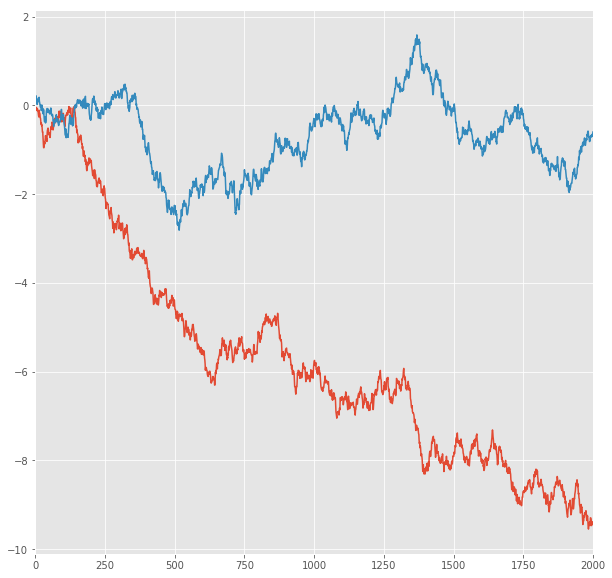

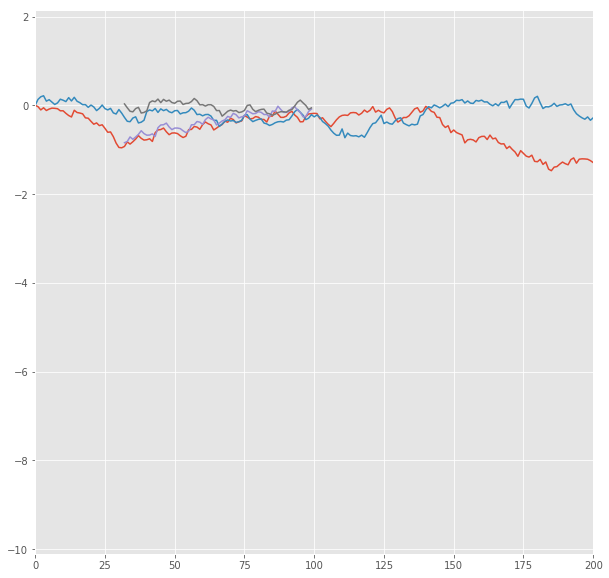

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.2840 RMSE
Predict Score for 1 -steps forecast: 0.3146 RMSE
Error Test Score for 1 -steps forecast: 0.1179 RMSE
RT Test Score for 1 -steps forecast: 0.1749 RMSE
Error Test Corr for 1 -steps forecast: 0.9580
RT Test Corr for 1 -steps forecast: 0.9240


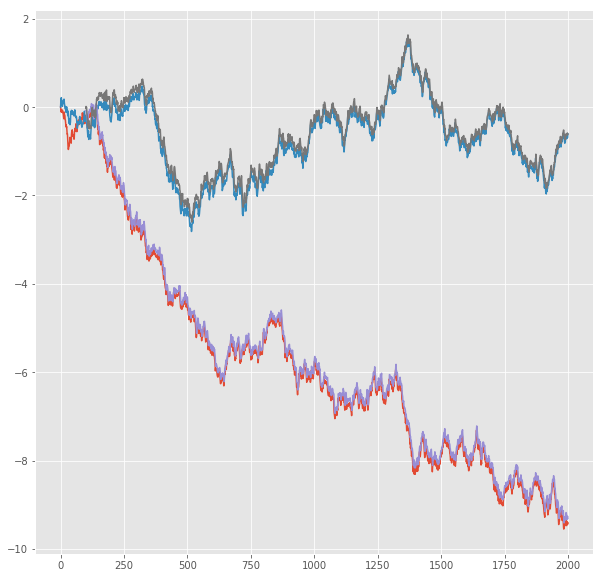

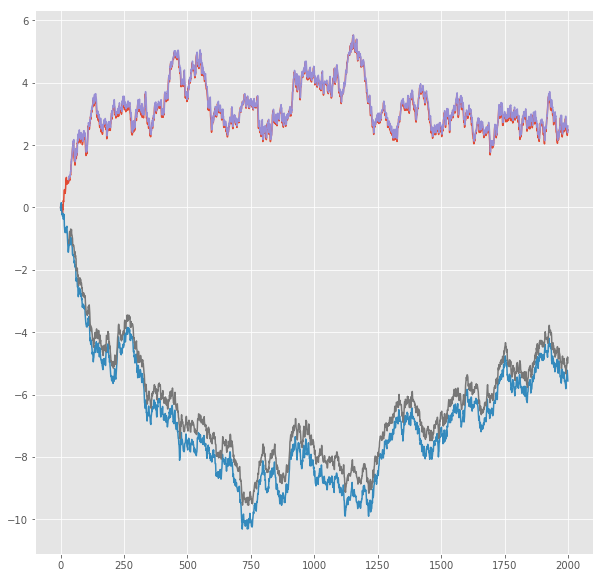

R^2 score for regression on Error: 0.9177
k = 0.9920


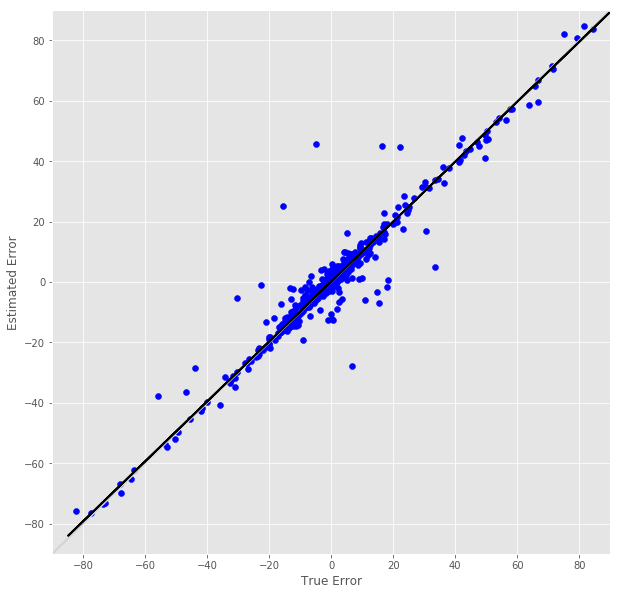

R^2 score for regression on RT: 0.8539
k = 0.9446


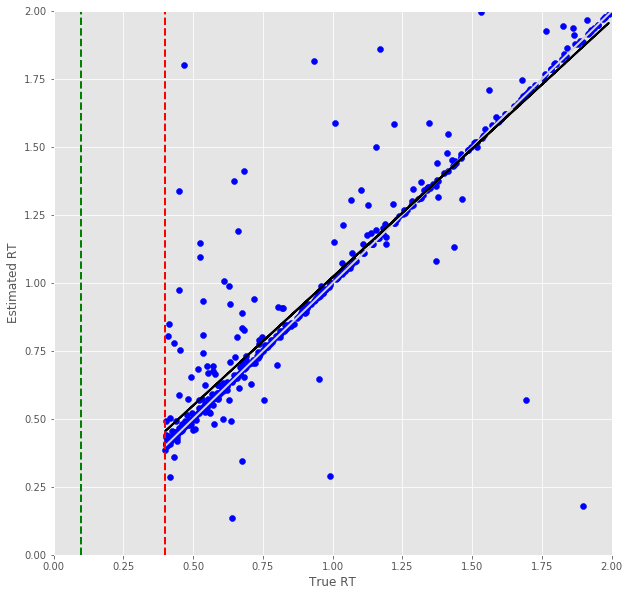

Error Prediction Score: 0.0922 RMSE
RT Prediction Score: 0.2143 RMSE
Error Prediction Corr: 0.9627
RT Prediction Corr: 0.8828
R^2 score for regression on Error: 0.9269
k = 0.9720


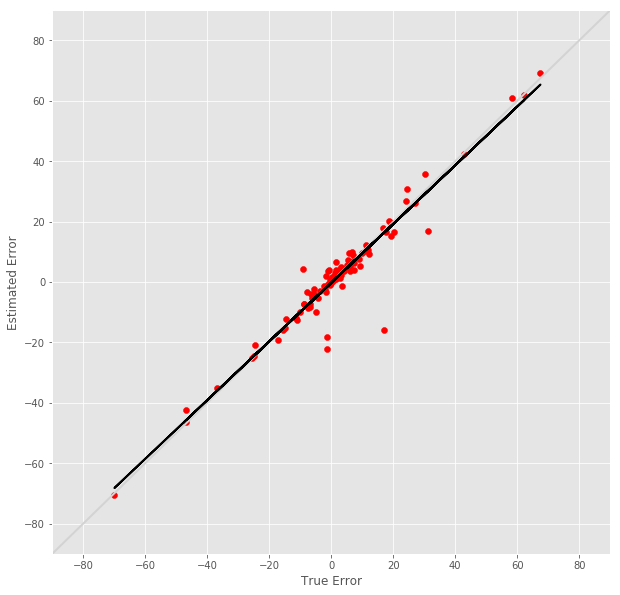

R^2 score for regression on RT: 0.7793
k = 0.8951


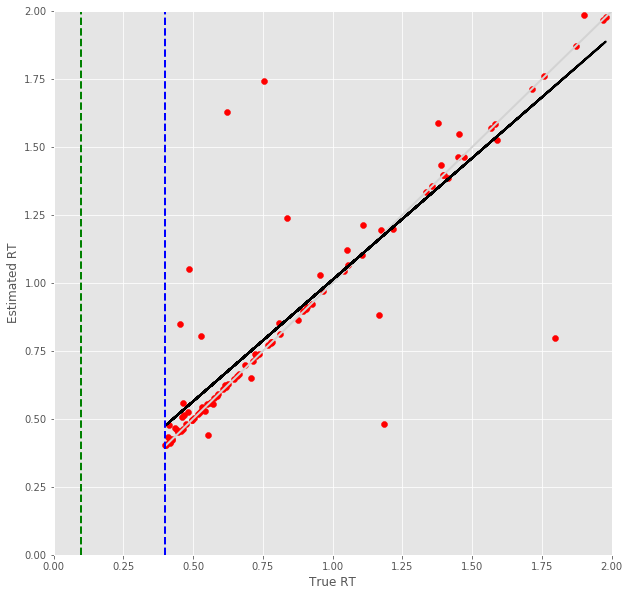

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.4895 RMSE
Predict Score for 2 -steps forecast: 0.5462 RMSE
Error Test Score for 2 -steps forecast: 0.1870 RMSE
RT Test Score for 2 -steps forecast: 0.2509 RMSE
Error Test Corr for 2 -steps forecast: 0.8999
RT Test Corr for 2 -steps forecast: 0.8452


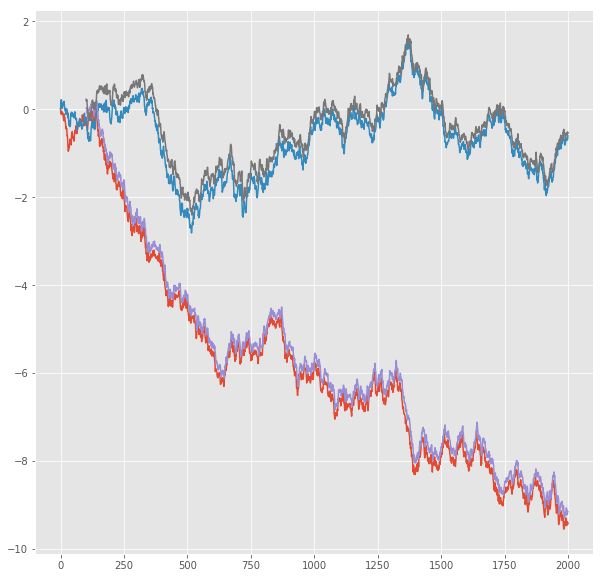

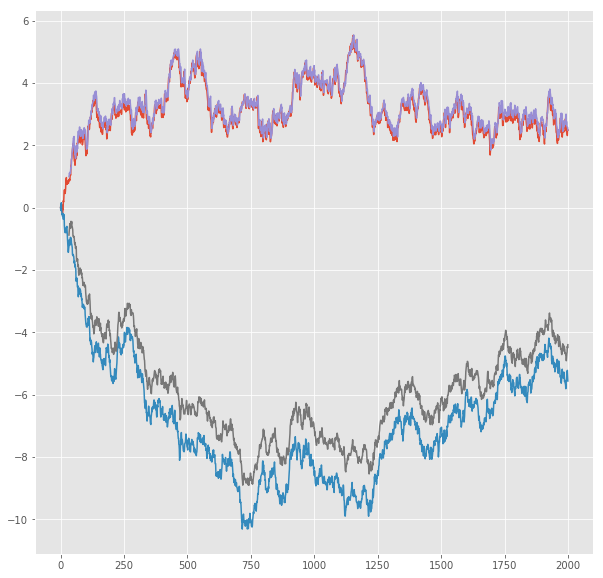

R^2 score for regression on Error: 0.8098
k = 0.9644


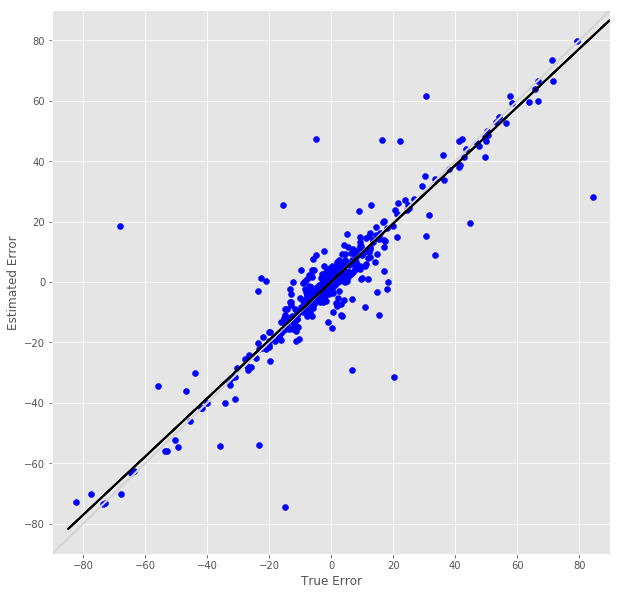

R^2 score for regression on RT: 0.7143
k = 0.9000


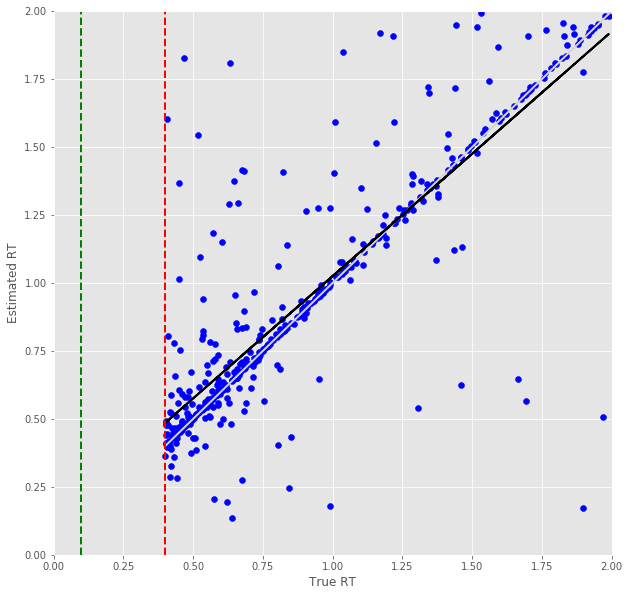

Error Prediction Score: 0.1164 RMSE
RT Prediction Score: 0.2076 RMSE
Error Prediction Corr: 0.9399
RT Prediction Corr: 0.8837
R^2 score for regression on Error: 0.8834
k = 0.9286


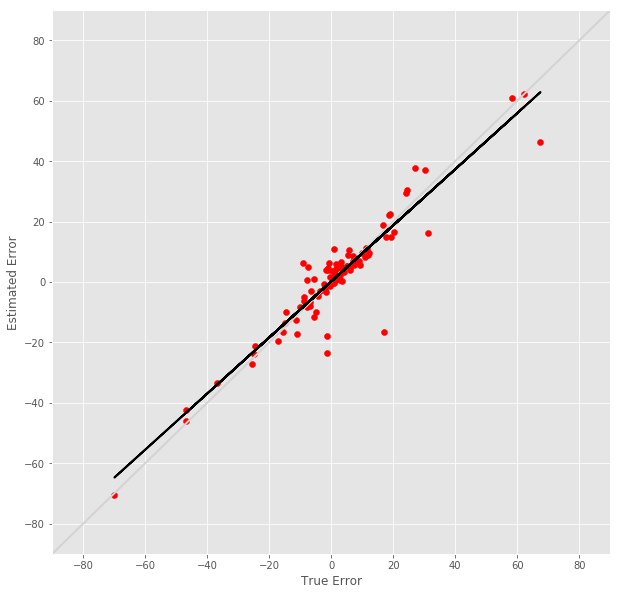

R^2 score for regression on RT: 0.7810
k = 0.8832


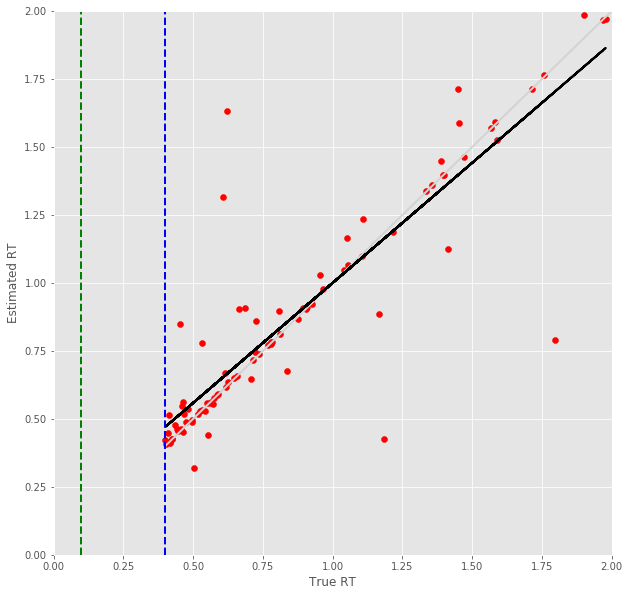

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.6815 RMSE
Predict Score for 3 -steps forecast: 0.7608 RMSE
Error Test Score for 3 -steps forecast: 0.2331 RMSE
RT Test Score for 3 -steps forecast: 0.2835 RMSE
Error Test Corr for 3 -steps forecast: 0.8552
RT Test Corr for 3 -steps forecast: 0.8107


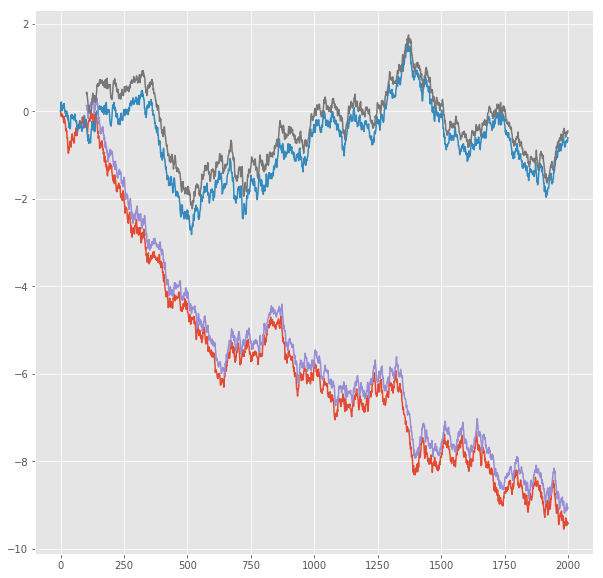

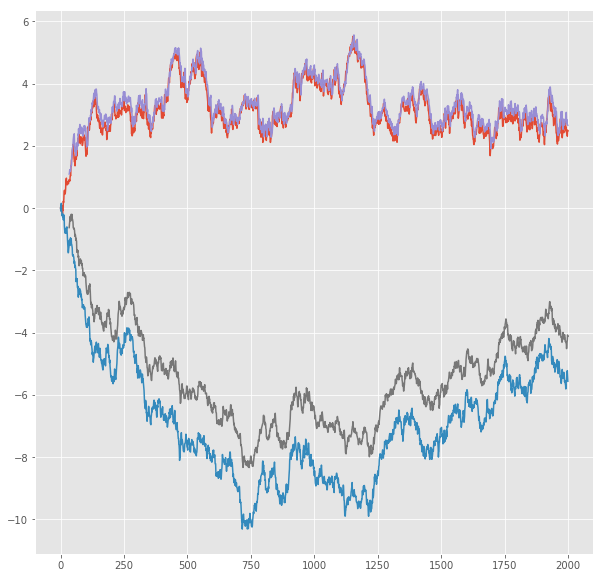

R^2 score for regression on Error: 0.7314
k = 0.9628


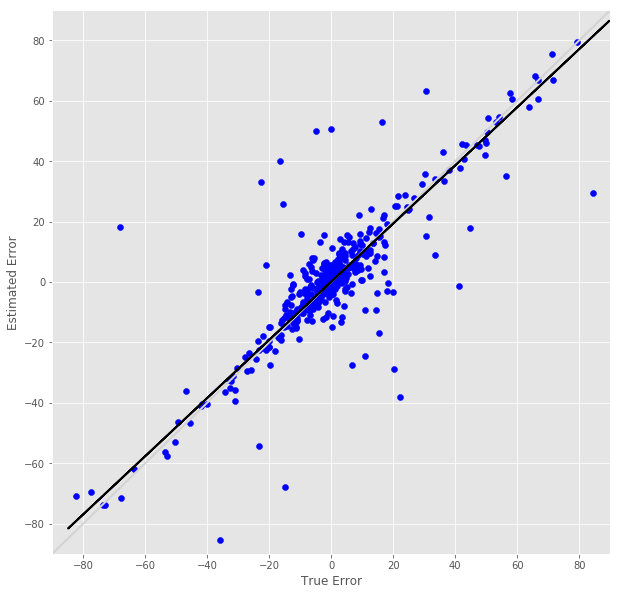

R^2 score for regression on RT: 0.6573
k = 0.8911


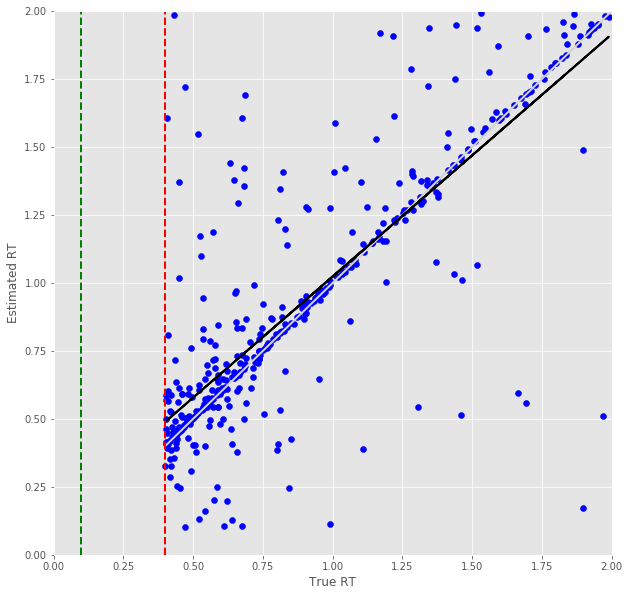

Error Prediction Score: 0.2075 RMSE
RT Prediction Score: 0.2473 RMSE
Error Prediction Corr: 0.8352
RT Prediction Corr: 0.8259
R^2 score for regression on Error: 0.6976
k = 0.9160


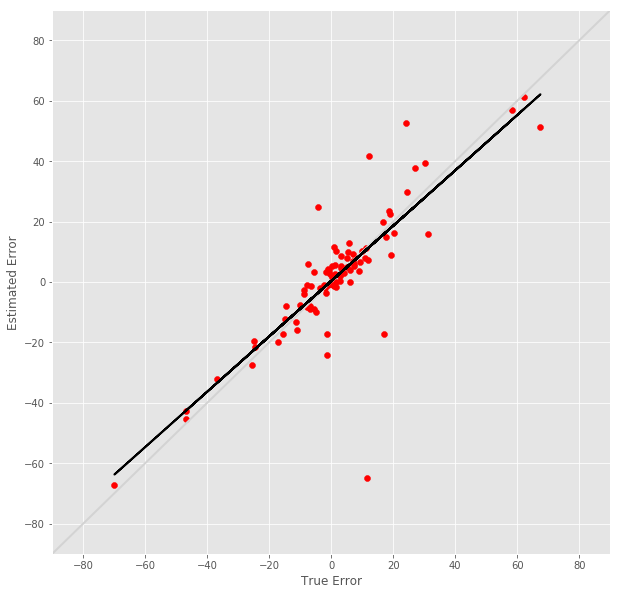

R^2 score for regression on RT: 0.6820
k = 0.7831


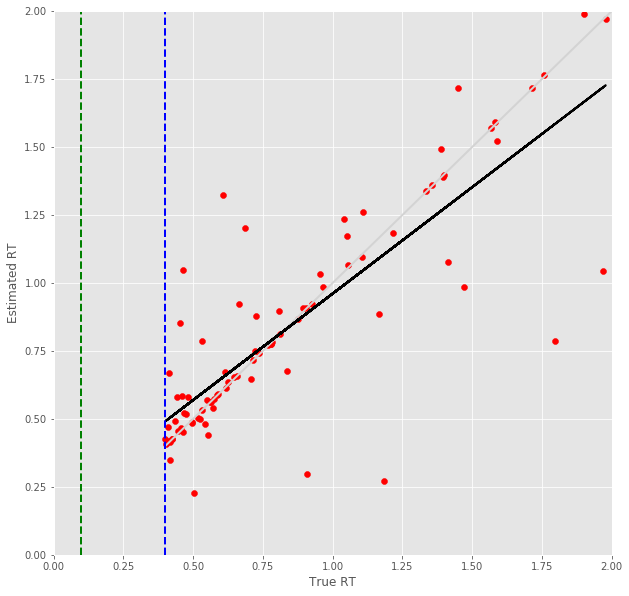

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.8647 RMSE
Predict Score for 4 -steps forecast: 0.9649 RMSE
Error Test Score for 4 -steps forecast: 0.2576 RMSE
RT Test Score for 4 -steps forecast: 0.3054 RMSE
Error Test Corr for 4 -steps forecast: 0.8307
RT Test Corr for 4 -steps forecast: 0.7836


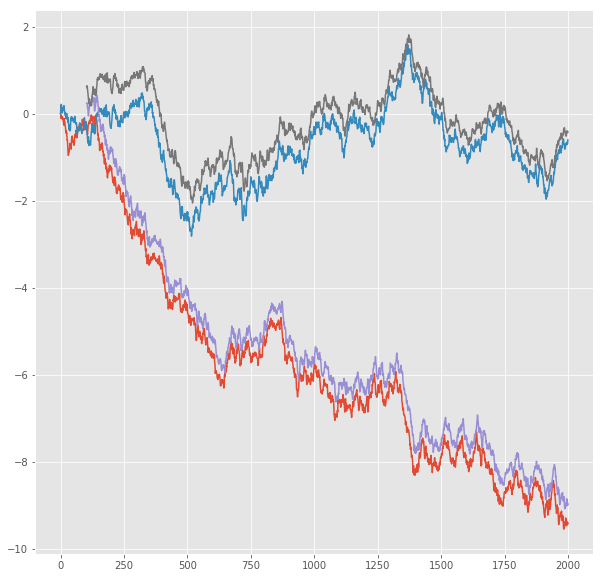

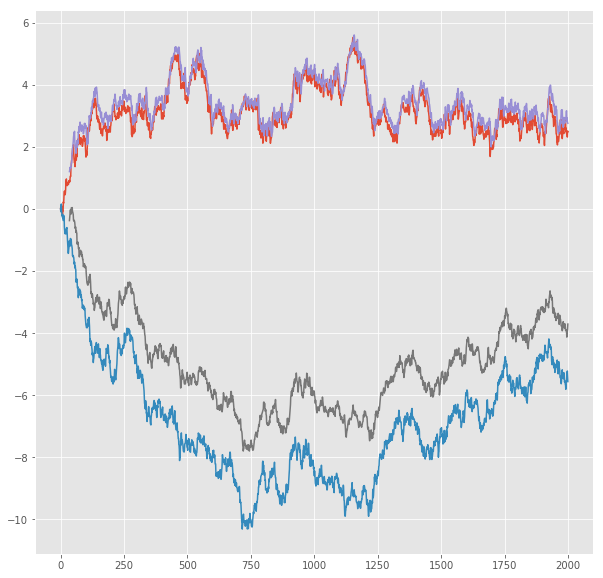

R^2 score for regression on Error: 0.6900
k = 0.9504


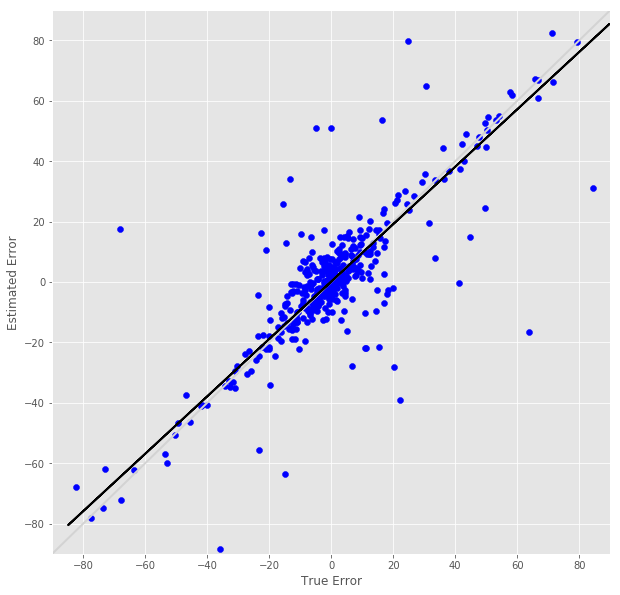

R^2 score for regression on RT: 0.6140
k = 0.8787


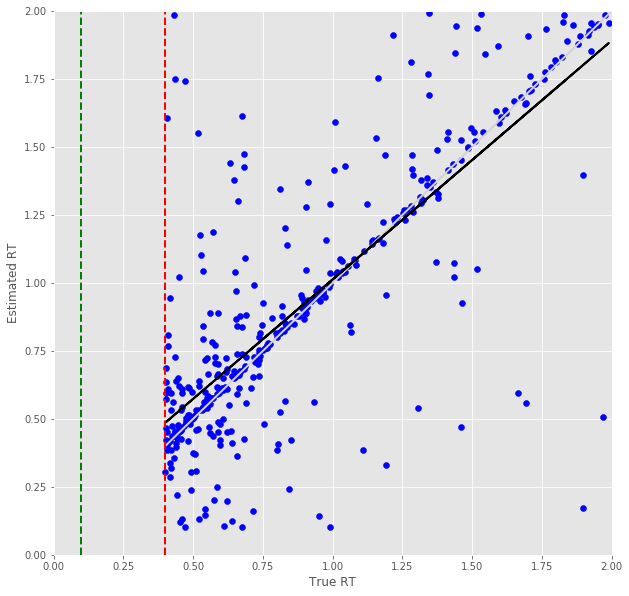

Error Prediction Score: 0.2139 RMSE
RT Prediction Score: 0.2866 RMSE
Error Prediction Corr: 0.8308
RT Prediction Corr: 0.7681
R^2 score for regression on Error: 0.6903
k = 0.9038


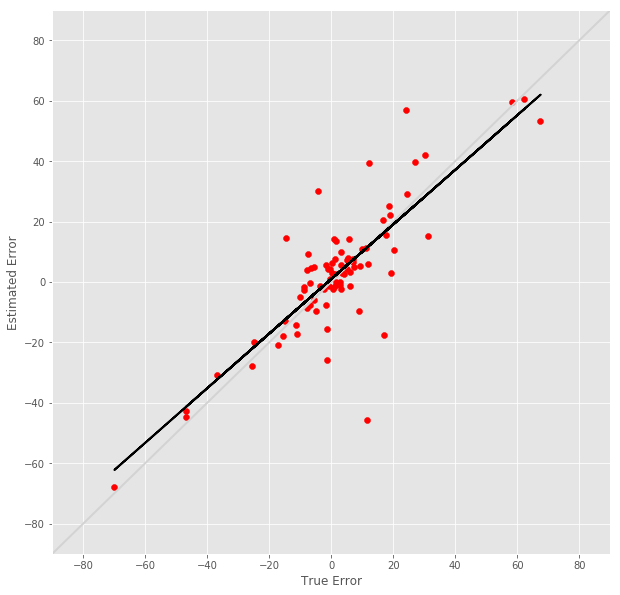

R^2 score for regression on RT: 0.5900
k = 0.7474


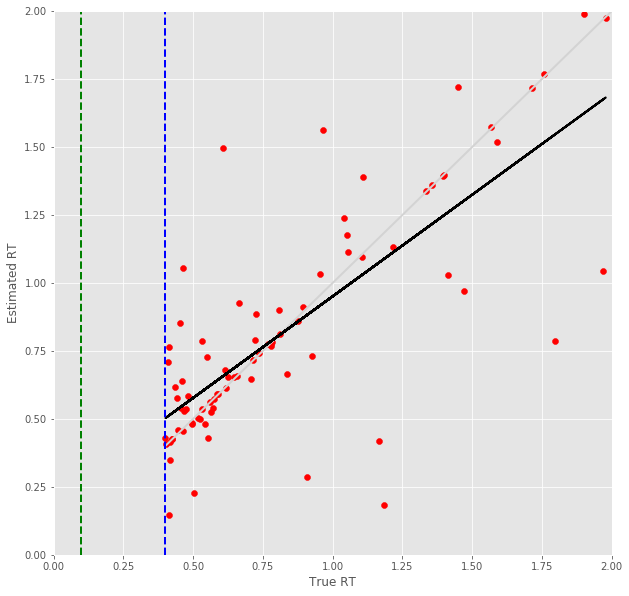

5 -step(s) forecast:
Test Score for 5 -steps forecast: 1.0420 RMSE
Predict Score for 5 -steps forecast: 1.1621 RMSE
Error Test Score for 5 -steps forecast: 0.3081 RMSE
RT Test Score for 5 -steps forecast: 0.3415 RMSE
Error Test Corr for 5 -steps forecast: 0.7899
RT Test Corr for 5 -steps forecast: 0.7286


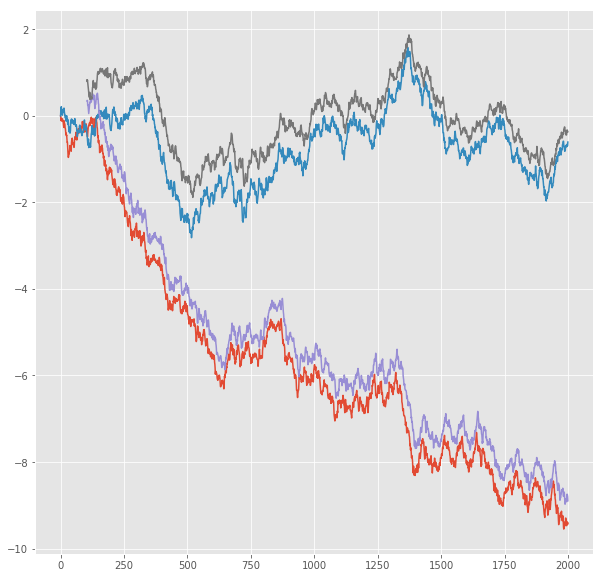

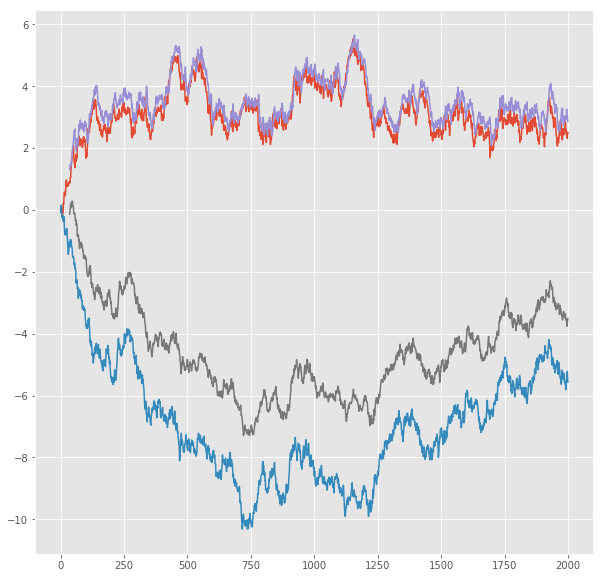

R^2 score for regression on Error: 0.6239
k = 0.9737


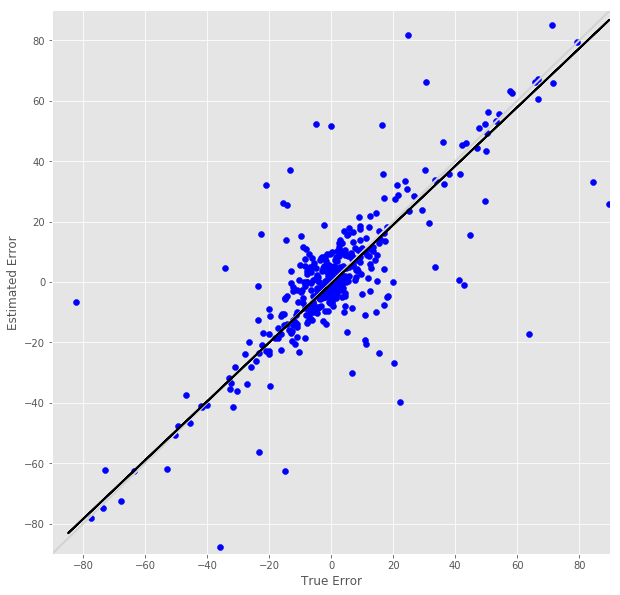

R^2 score for regression on RT: 0.5308
k = 0.8369


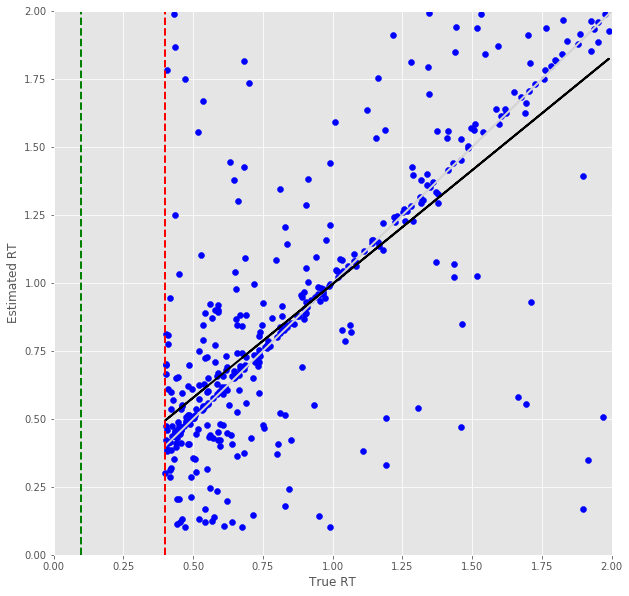

Error Prediction Score: 0.2170 RMSE
RT Prediction Score: 0.3319 RMSE
Error Prediction Corr: 0.8165
RT Prediction Corr: 0.6763
R^2 score for regression on Error: 0.6667
k = 0.8885


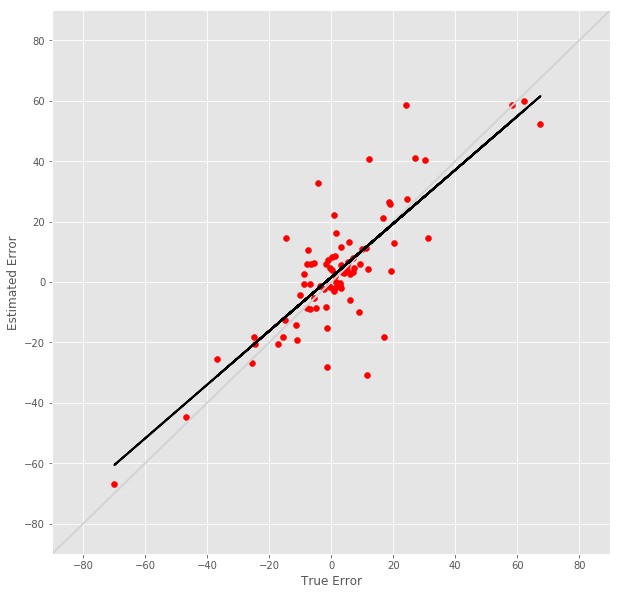

R^2 score for regression on RT: 0.4574
k = 0.6686


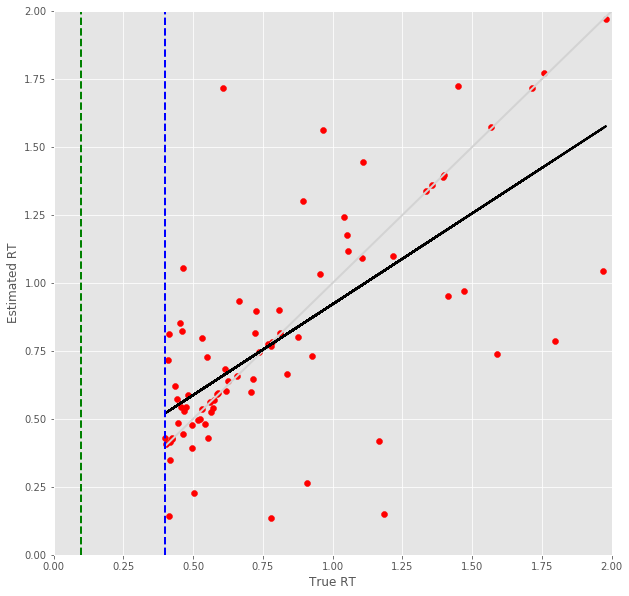

6 -step(s) forecast:
Test Score for 6 -steps forecast: 1.2146 RMSE
Predict Score for 6 -steps forecast: 1.3537 RMSE
Error Test Score for 6 -steps forecast: 0.3523 RMSE
RT Test Score for 6 -steps forecast: 0.3788 RMSE
Error Test Corr for 6 -steps forecast: 0.7836
RT Test Corr for 6 -steps forecast: 0.6551


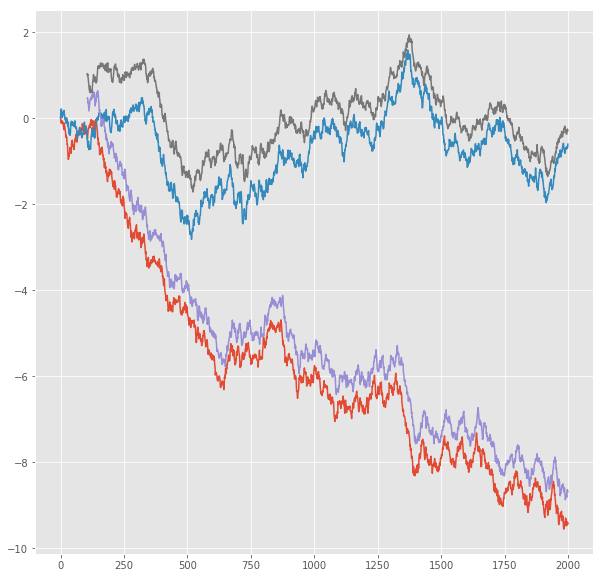

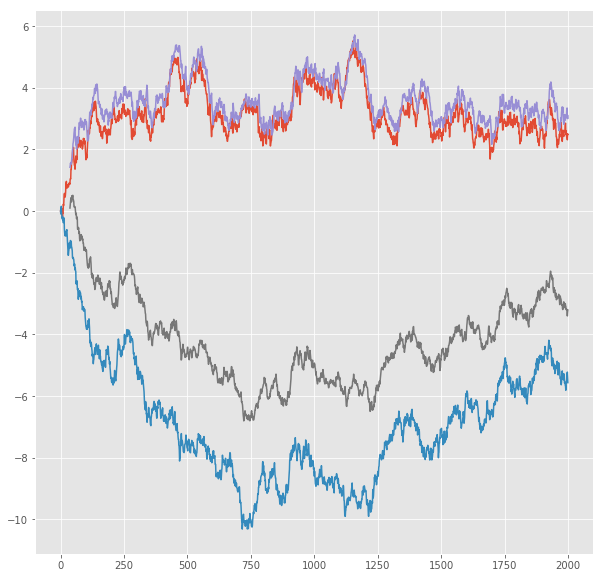

R^2 score for regression on Error: 0.6140
k = 1.0802


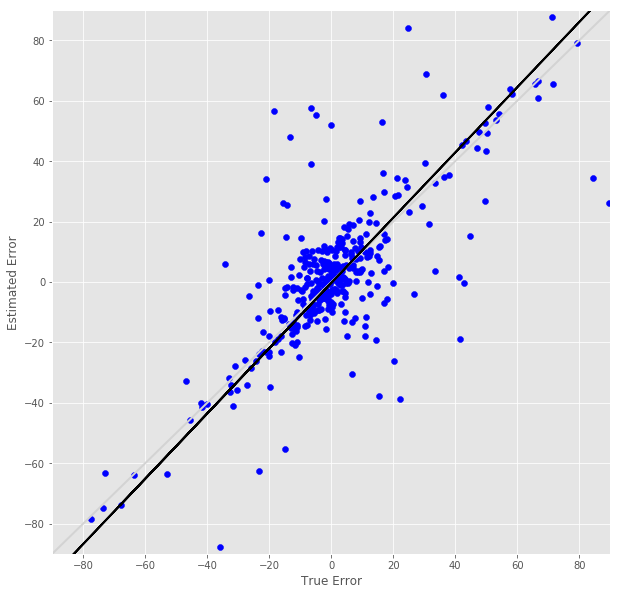

R^2 score for regression on RT: 0.4291
k = 0.7512


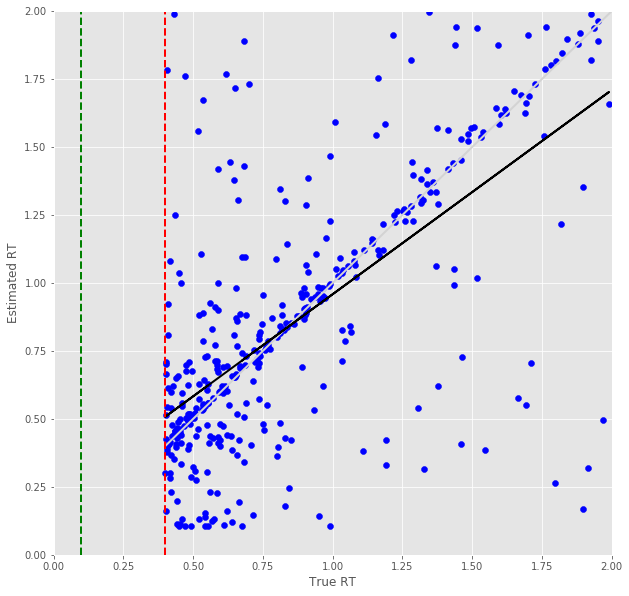

Error Prediction Score: 0.2675 RMSE
RT Prediction Score: 0.3971 RMSE
Error Prediction Corr: 0.7297
RT Prediction Corr: 0.5559
R^2 score for regression on Error: 0.5324
k = 0.7975


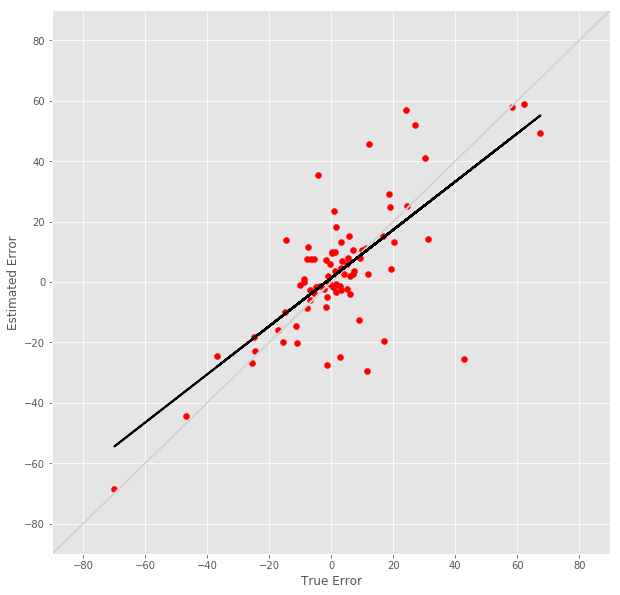

R^2 score for regression on RT: 0.3091
k = 0.5355


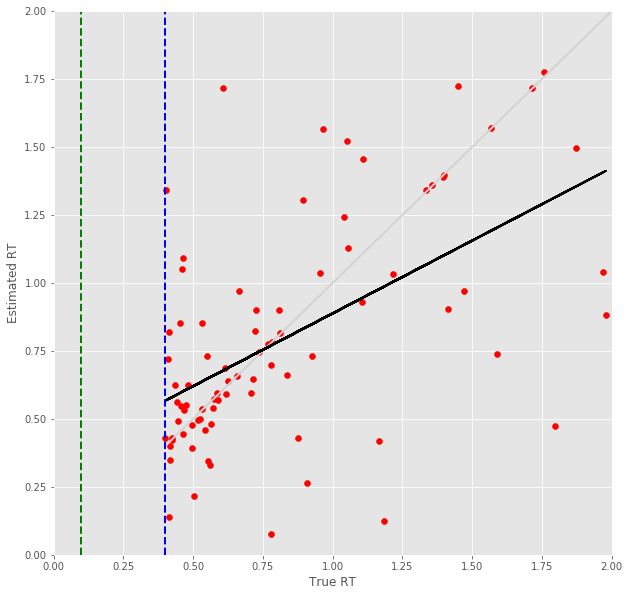

7 -step(s) forecast:
Test Score for 7 -steps forecast: 1.3830 RMSE
Predict Score for 7 -steps forecast: 1.5402 RMSE
Error Test Score for 7 -steps forecast: 0.4022 RMSE
RT Test Score for 7 -steps forecast: 0.4184 RMSE
Error Test Corr for 7 -steps forecast: 0.7181
RT Test Corr for 7 -steps forecast: 0.5838


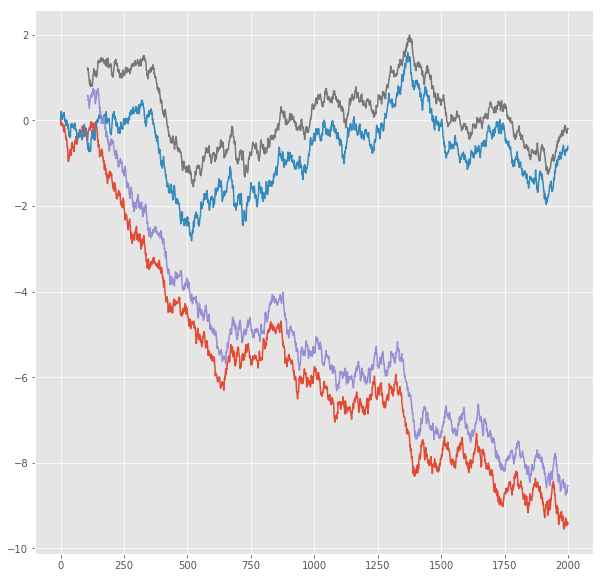

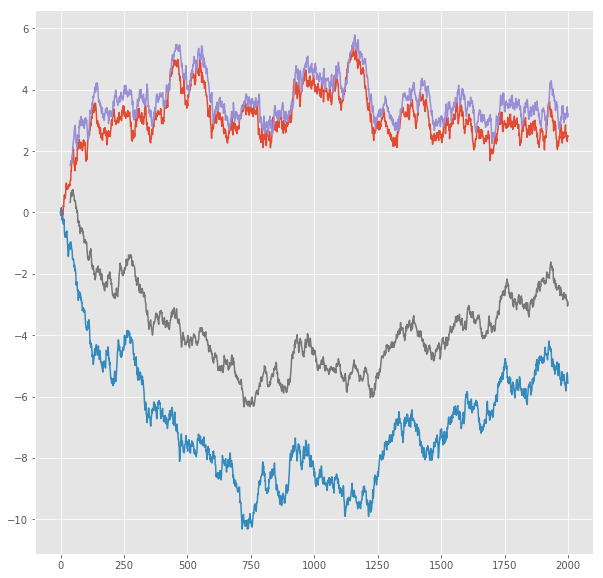

R^2 score for regression on Error: 0.5157
k = 1.0012


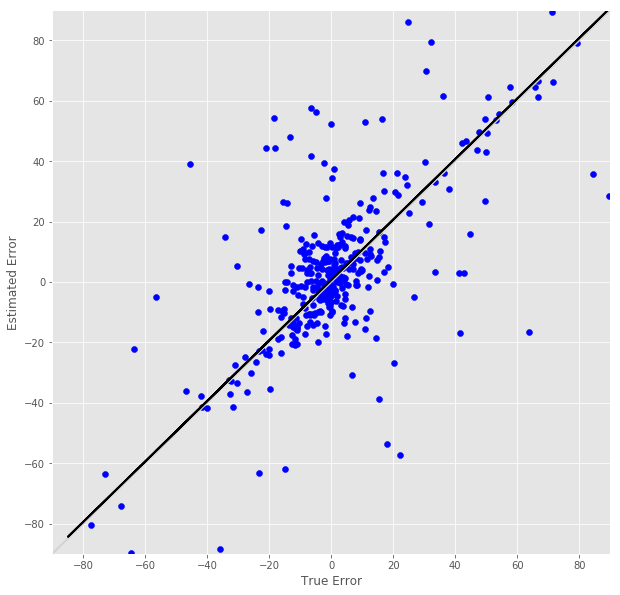

R^2 score for regression on RT: 0.3408
k = 0.6809


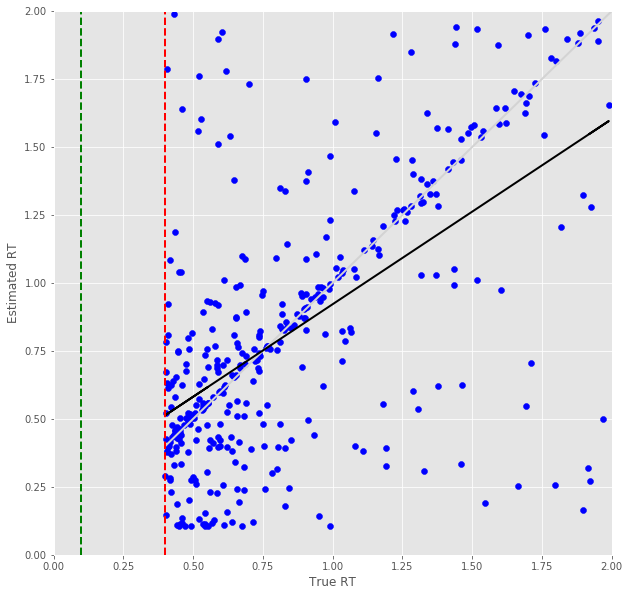

Error Prediction Score: 0.2852 RMSE
RT Prediction Score: 0.4707 RMSE
Error Prediction Corr: 0.7101
RT Prediction Corr: 0.4059
R^2 score for regression on Error: 0.5043
k = 0.8099


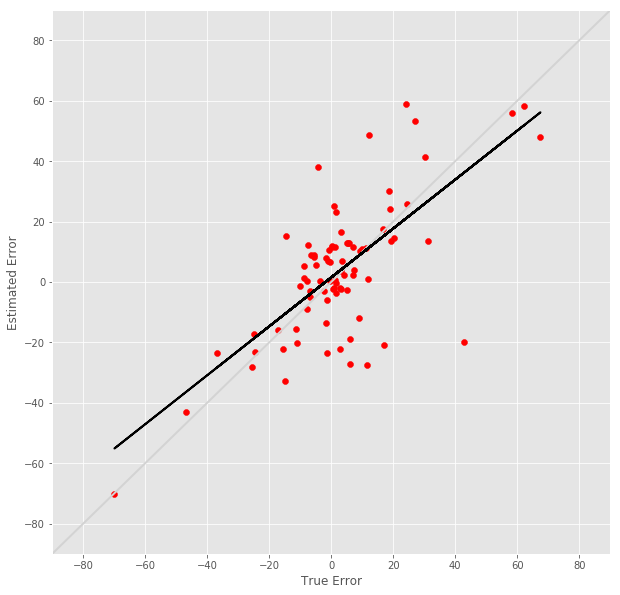

R^2 score for regression on RT: 0.1648
k = 0.4087


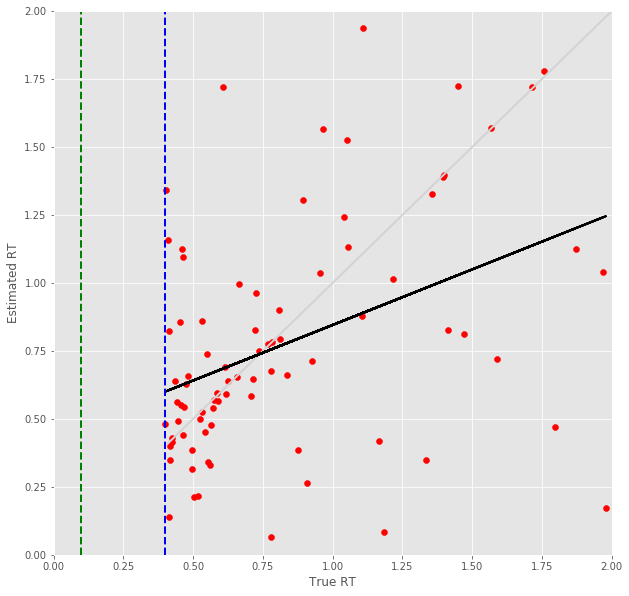

8 -step(s) forecast:
Test Score for 8 -steps forecast: 1.5475 RMSE
Predict Score for 8 -steps forecast: 1.7217 RMSE
Error Test Score for 8 -steps forecast: 0.4293 RMSE
RT Test Score for 8 -steps forecast: 0.4661 RMSE
Error Test Corr for 8 -steps forecast: 0.7064
RT Test Corr for 8 -steps forecast: 0.4926


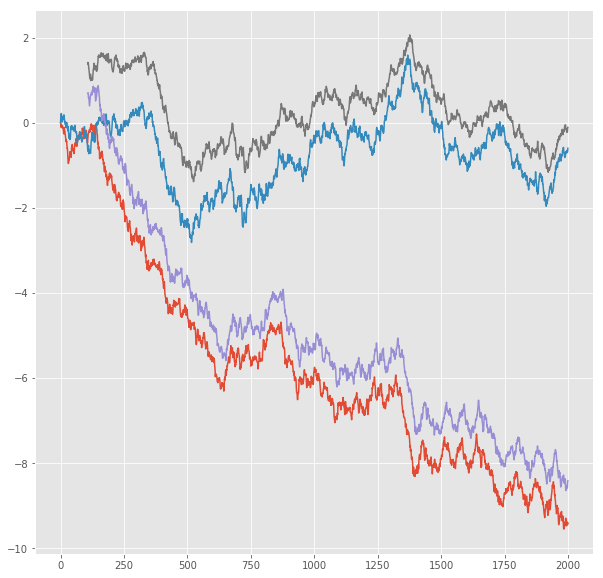

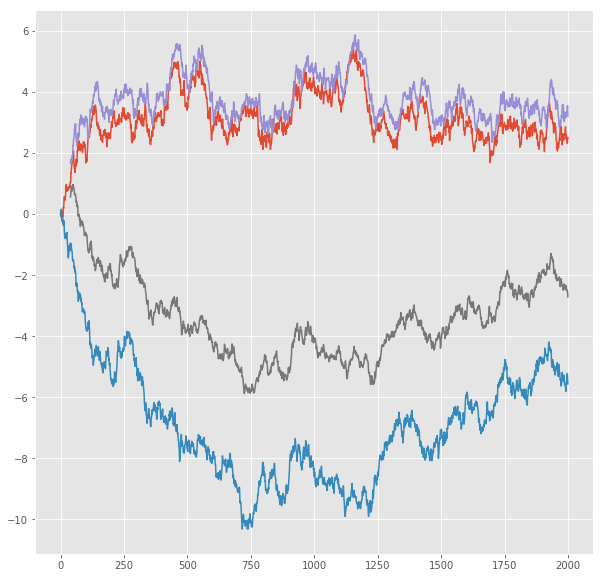

R^2 score for regression on Error: 0.4990
k = 1.0399


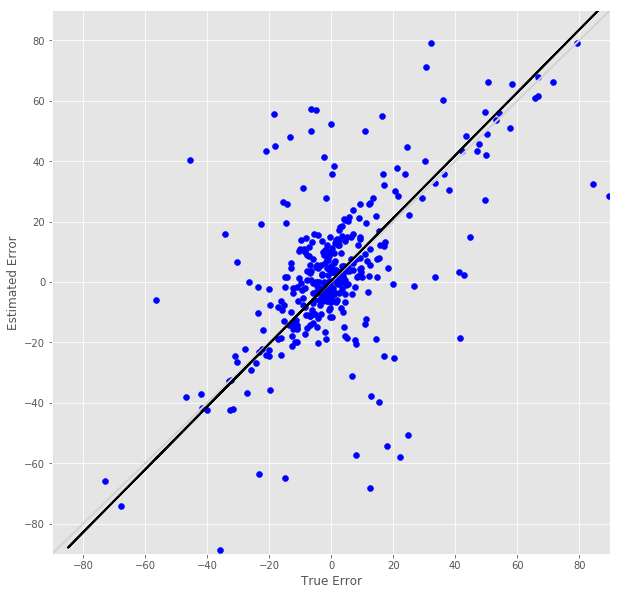

R^2 score for regression on RT: 0.2427
k = 0.5793


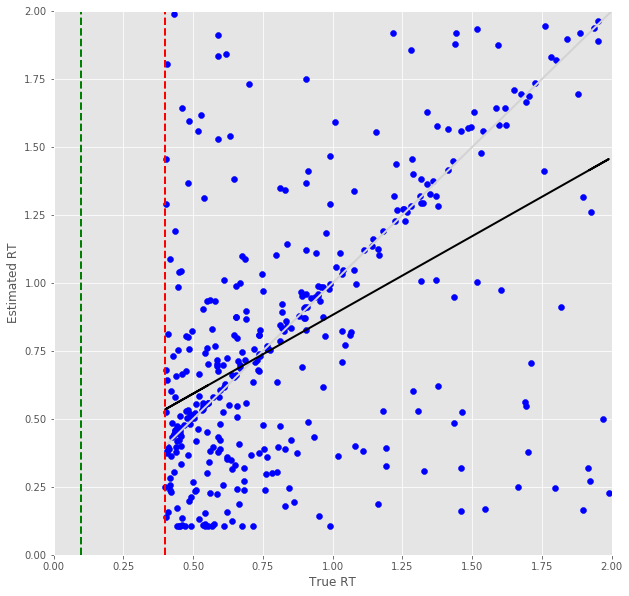

Error Prediction Score: 0.3392 RMSE
RT Prediction Score: 0.5158 RMSE
Error Prediction Corr: 0.6362
RT Prediction Corr: 0.3067
R^2 score for regression on Error: 0.4047
k = 0.7798


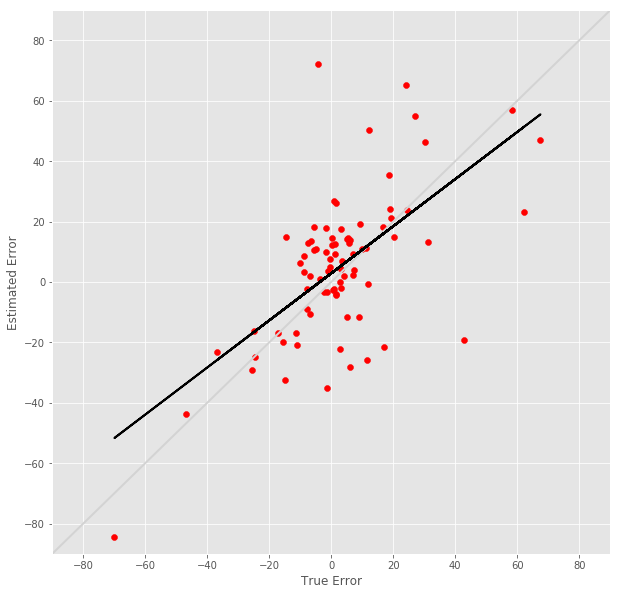

R^2 score for regression on RT: 0.0941
k = 0.3114


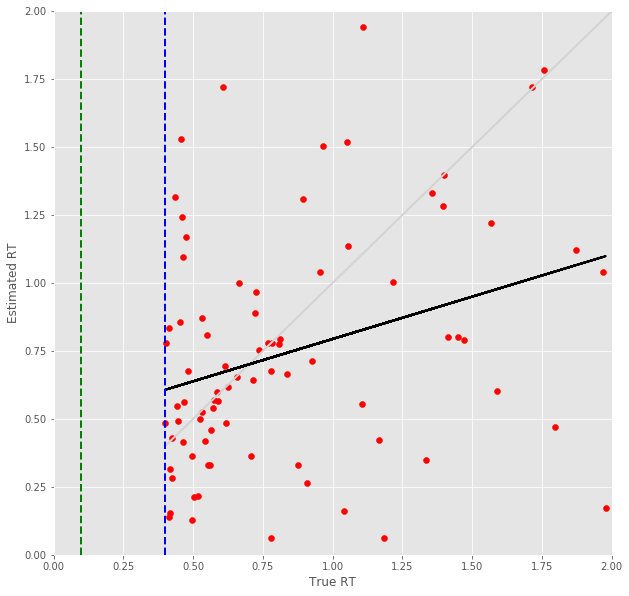

9 -step(s) forecast:
Test Score for 9 -steps forecast: 1.7082 RMSE
Predict Score for 9 -steps forecast: 1.8988 RMSE
Error Test Score for 9 -steps forecast: 0.4421 RMSE
RT Test Score for 9 -steps forecast: 0.4891 RMSE
Error Test Corr for 9 -steps forecast: 0.7051
RT Test Corr for 9 -steps forecast: 0.4638


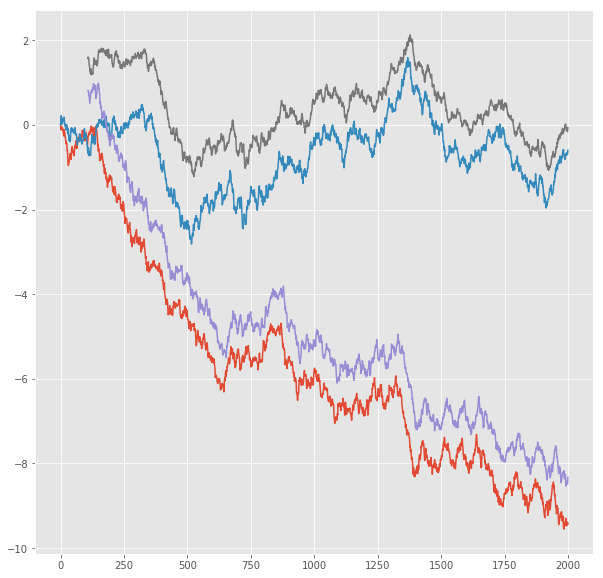

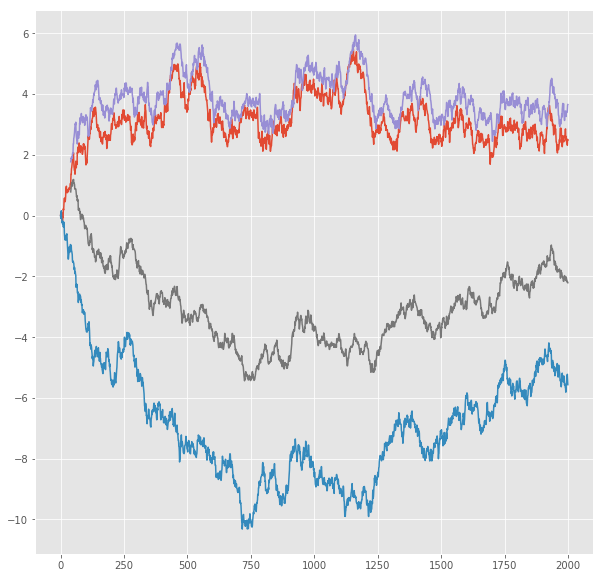

R^2 score for regression on Error: 0.4971
k = 1.0634


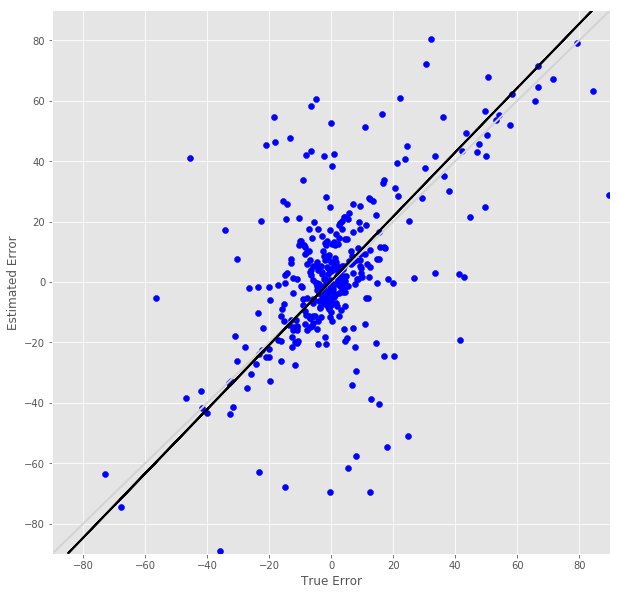

R^2 score for regression on RT: 0.2151
k = 0.5584


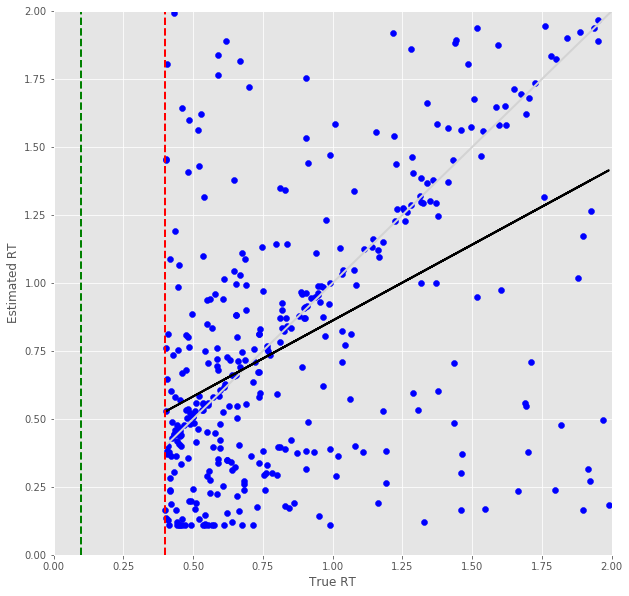

Error Prediction Score: 0.4106 RMSE
RT Prediction Score: 0.5519 RMSE
Error Prediction Corr: 0.5230
RT Prediction Corr: 0.2510
R^2 score for regression on Error: 0.2735
k = 0.6969


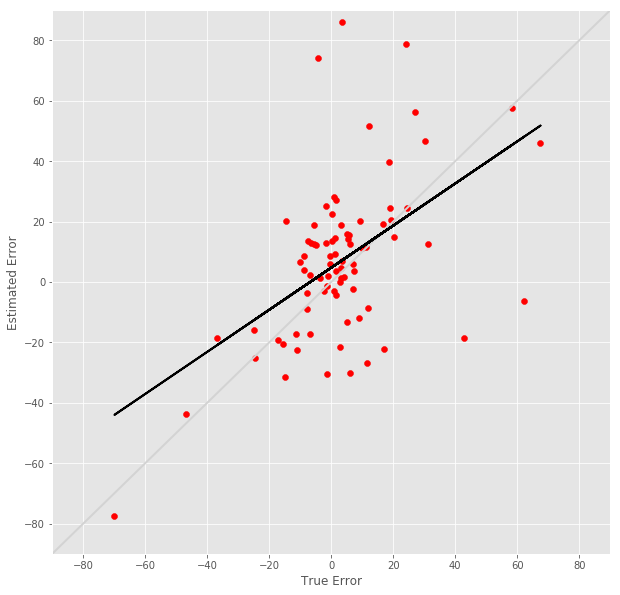

R^2 score for regression on RT: 0.0630
k = 0.2662


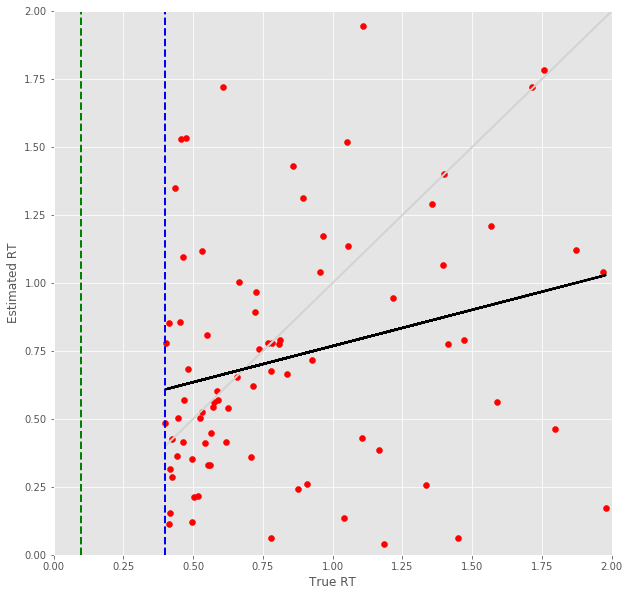

10 -step(s) forecast:
Test Score for 10 -steps forecast: 1.8654 RMSE
Predict Score for 10 -steps forecast: 2.0715 RMSE
Error Test Score for 10 -steps forecast: 0.4709 RMSE
RT Test Score for 10 -steps forecast: 0.5092 RMSE
Error Test Corr for 10 -steps forecast: 0.6675
RT Test Corr for 10 -steps forecast: 0.4424


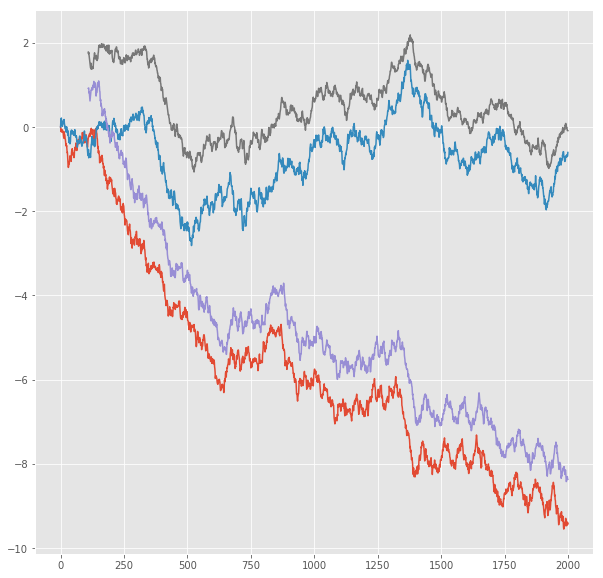

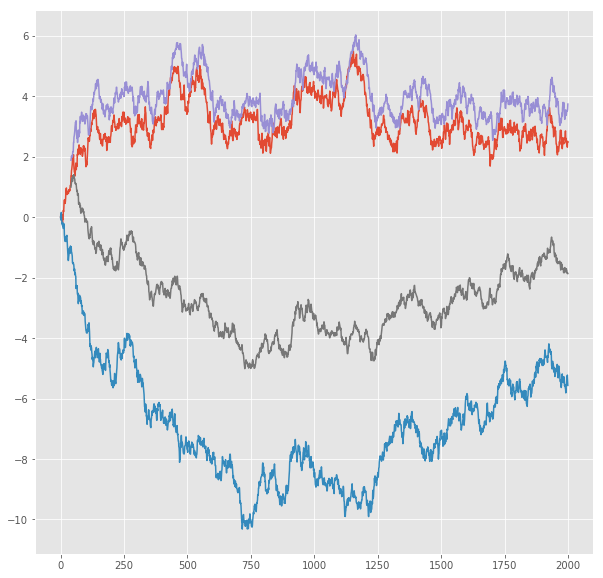

R^2 score for regression on Error: 0.4455
k = 1.0083


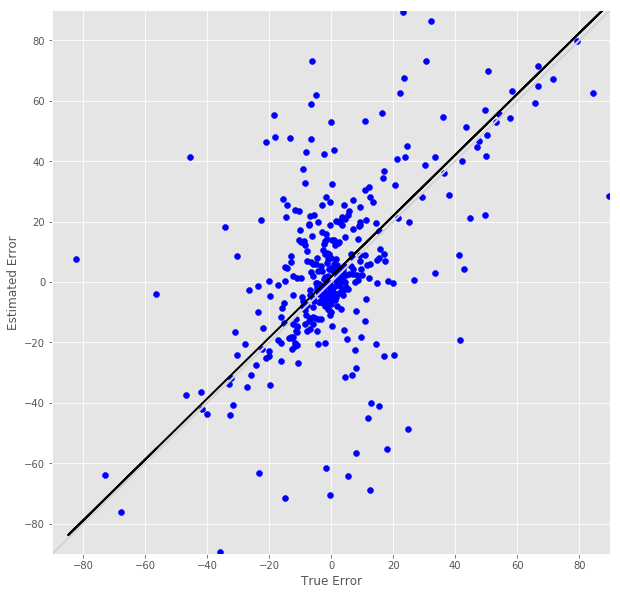

R^2 score for regression on RT: 0.1957
k = 0.5351


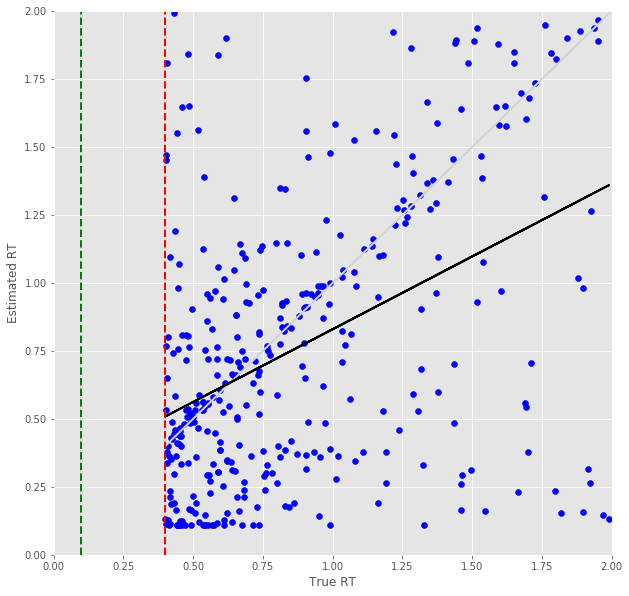

Error Prediction Score: 0.4211 RMSE
RT Prediction Score: 0.5720 RMSE
Error Prediction Corr: 0.5654
RT Prediction Corr: 0.3208
R^2 score for regression on Error: 0.3197
k = 0.7278


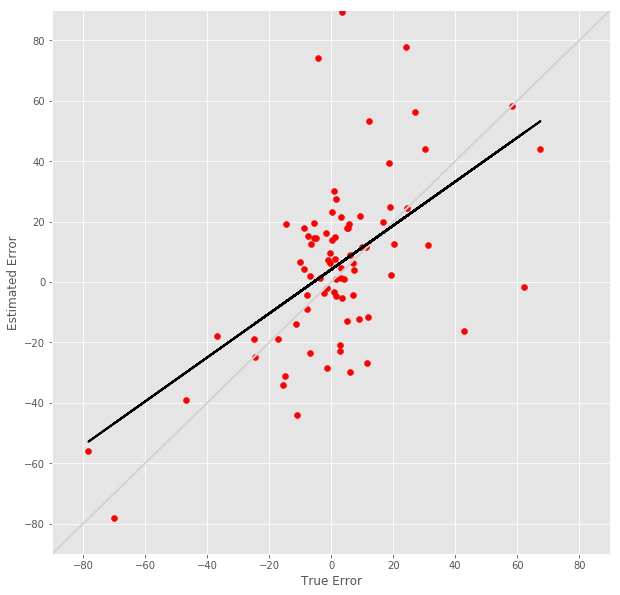

R^2 score for regression on RT: 0.1029
k = 0.3581


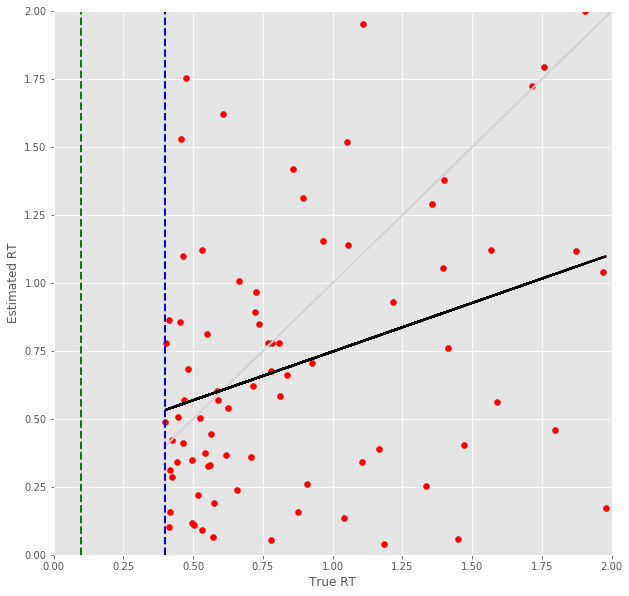

11 -step(s) forecast:
Test Score for 11 -steps forecast: 2.0193 RMSE
Predict Score for 11 -steps forecast: 2.2401 RMSE
Error Test Score for 11 -steps forecast: 0.4913 RMSE
RT Test Score for 11 -steps forecast: 0.5261 RMSE
Error Test Corr for 11 -steps forecast: 0.6312
RT Test Corr for 11 -steps forecast: 0.4334


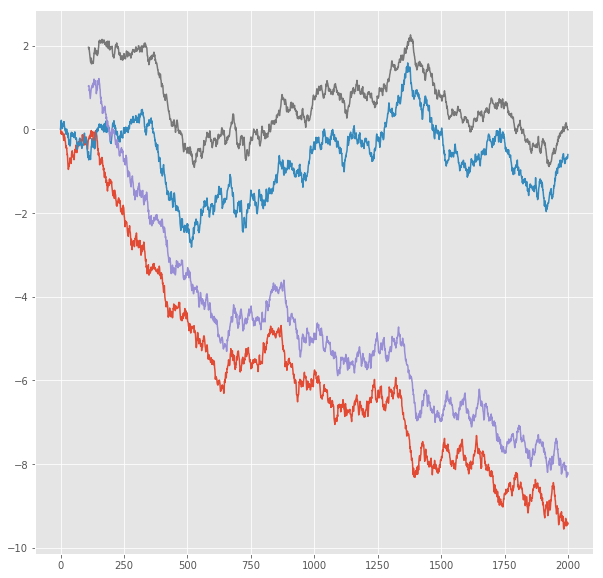

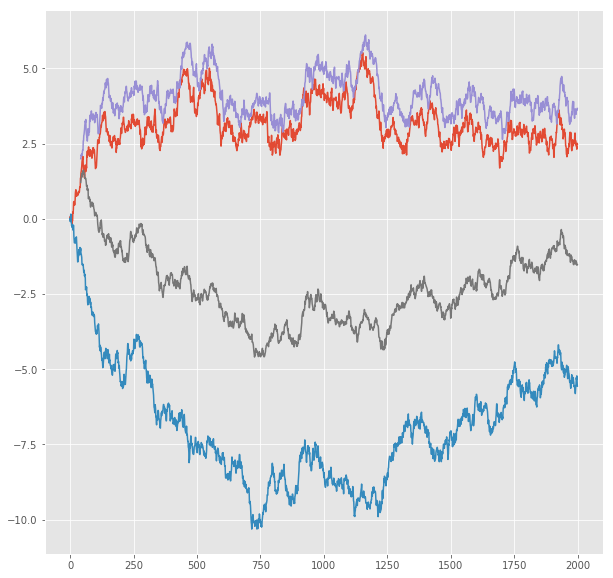

R^2 score for regression on Error: 0.3985
k = 0.9375


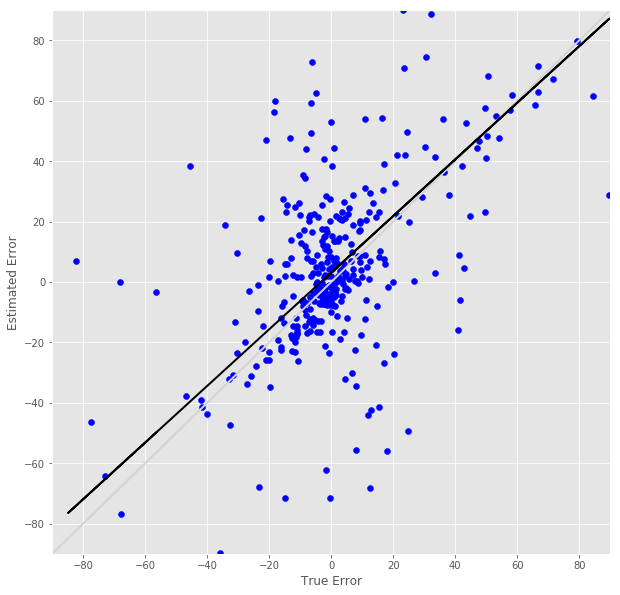

R^2 score for regression on RT: 0.1878
k = 0.5288


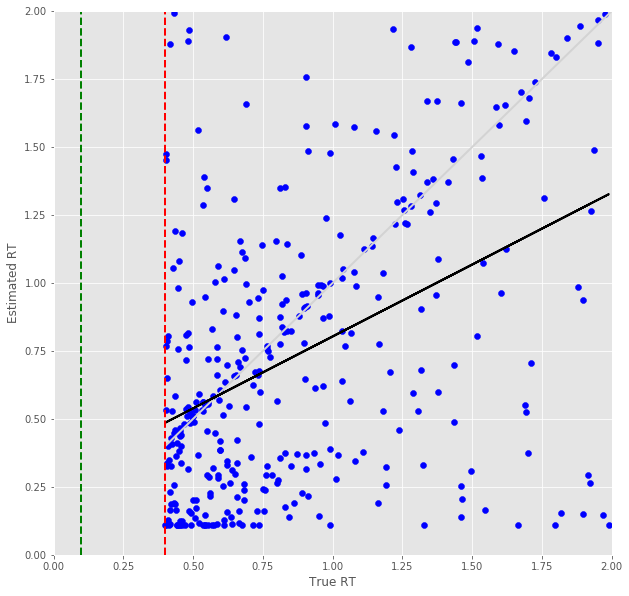

Error Prediction Score: 0.4605 RMSE
RT Prediction Score: 0.6220 RMSE
Error Prediction Corr: 0.5155
RT Prediction Corr: 0.2306
R^2 score for regression on Error: 0.2658
k = 0.7035


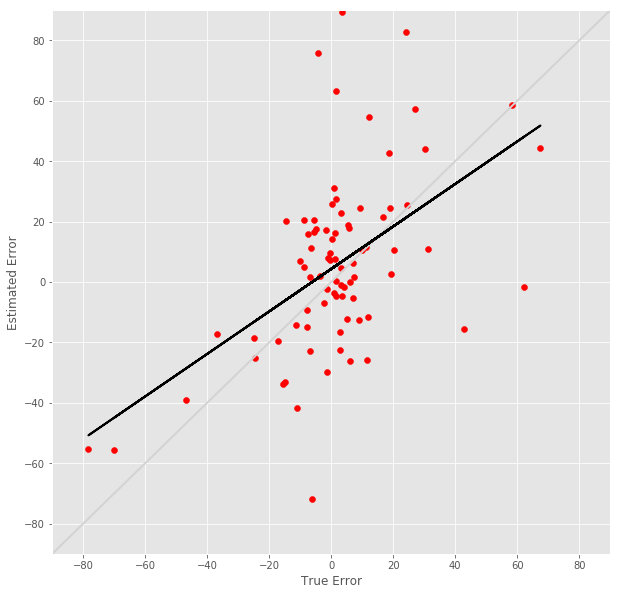

R^2 score for regression on RT: 0.0532
k = 0.2616


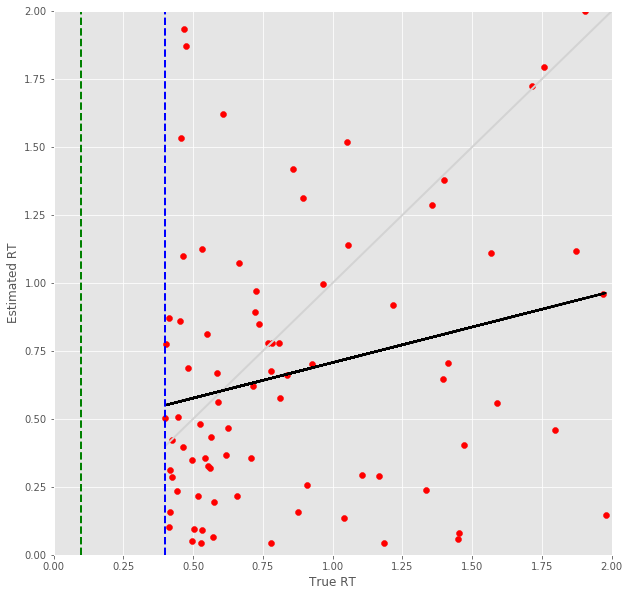

12 -step(s) forecast:
Test Score for 12 -steps forecast: 2.1703 RMSE
Predict Score for 12 -steps forecast: 2.4049 RMSE
Error Test Score for 12 -steps forecast: 0.5067 RMSE
RT Test Score for 12 -steps forecast: 0.5451 RMSE
Error Test Corr for 12 -steps forecast: 0.5982
RT Test Corr for 12 -steps forecast: 0.4043


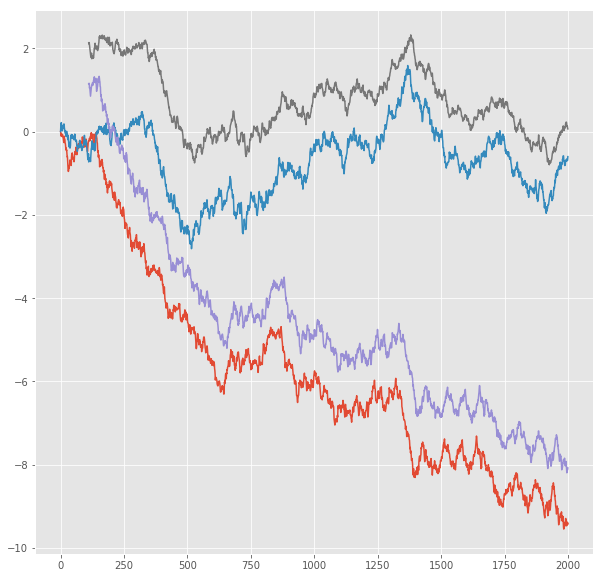

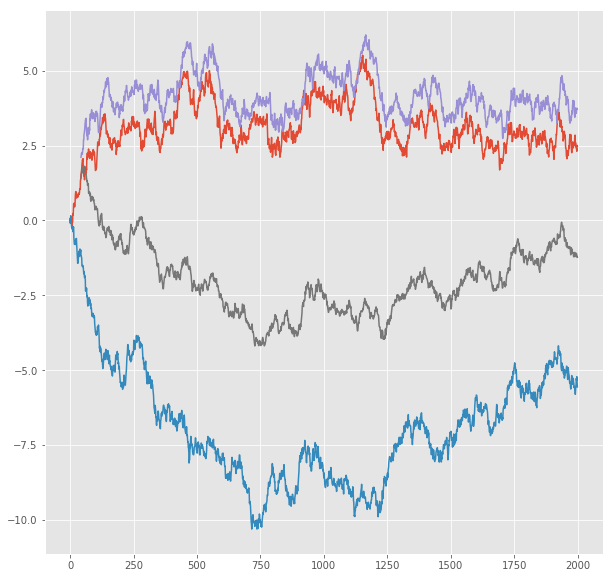

R^2 score for regression on Error: 0.3579
k = 0.8751


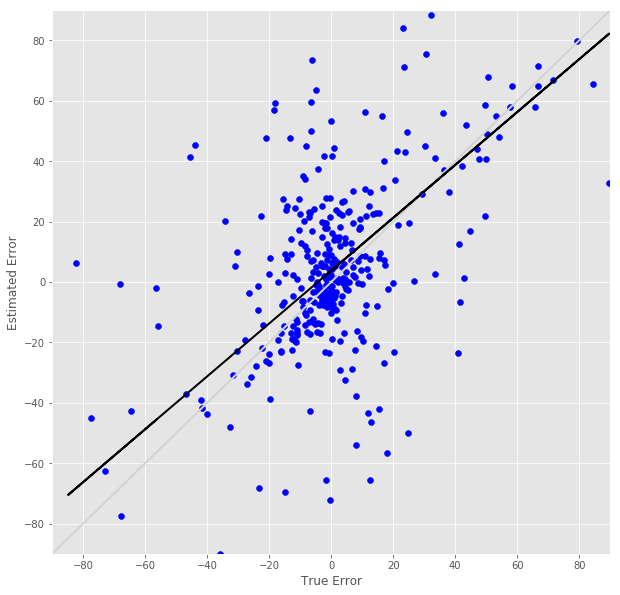

R^2 score for regression on RT: 0.1635
k = 0.4973


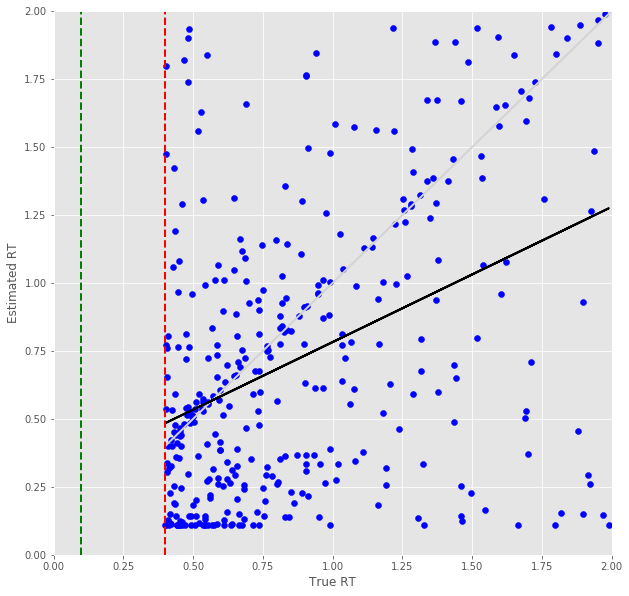

Error Prediction Score: 0.4797 RMSE
RT Prediction Score: 0.6055 RMSE
Error Prediction Corr: 0.5043
RT Prediction Corr: 0.2992
R^2 score for regression on Error: 0.2543
k = 0.6964


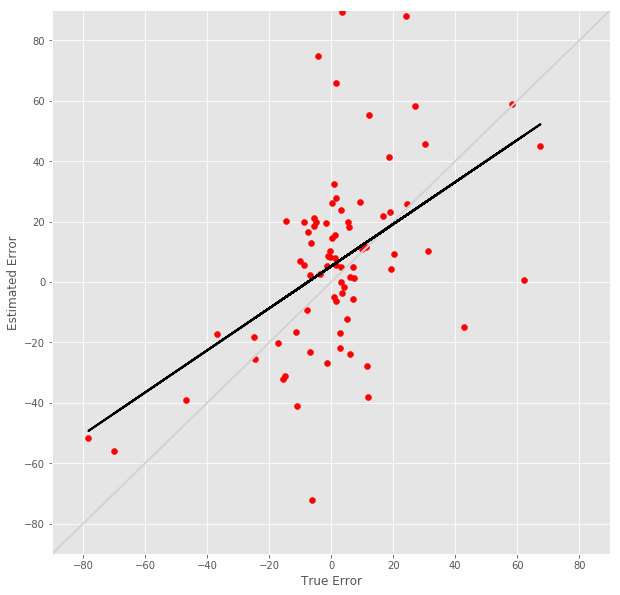

R^2 score for regression on RT: 0.0895
k = 0.3167


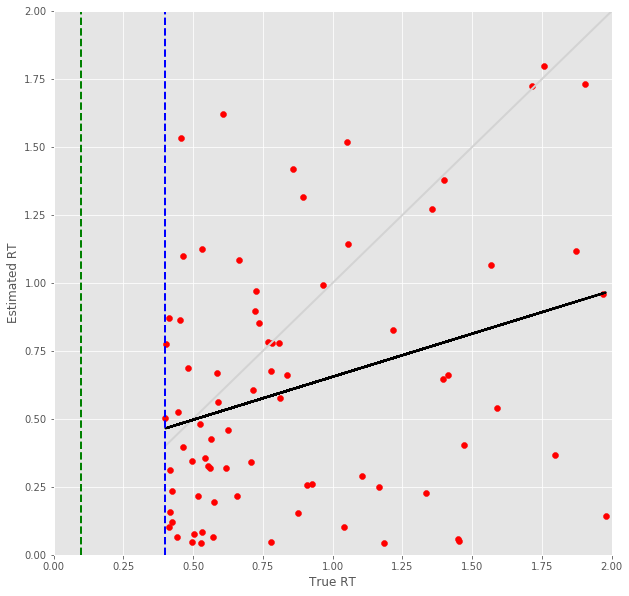

13 -step(s) forecast:
Test Score for 13 -steps forecast: 2.3183 RMSE
Predict Score for 13 -steps forecast: 2.5661 RMSE
Error Test Score for 13 -steps forecast: 0.5149 RMSE
RT Test Score for 13 -steps forecast: 0.5640 RMSE
Error Test Corr for 13 -steps forecast: 0.6027
RT Test Corr for 13 -steps forecast: 0.3636


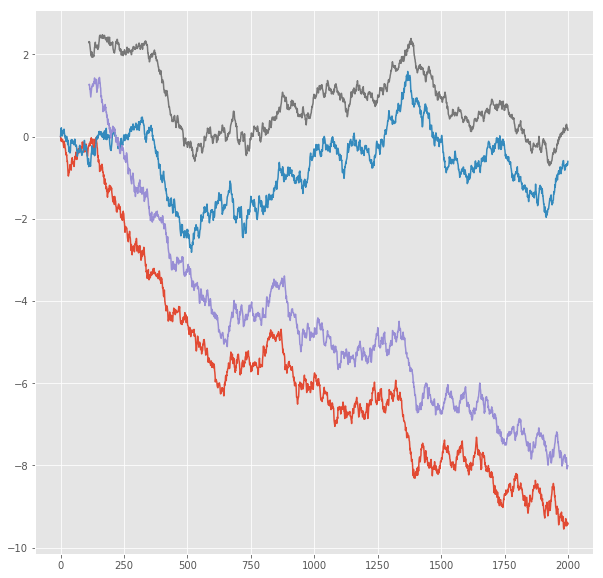

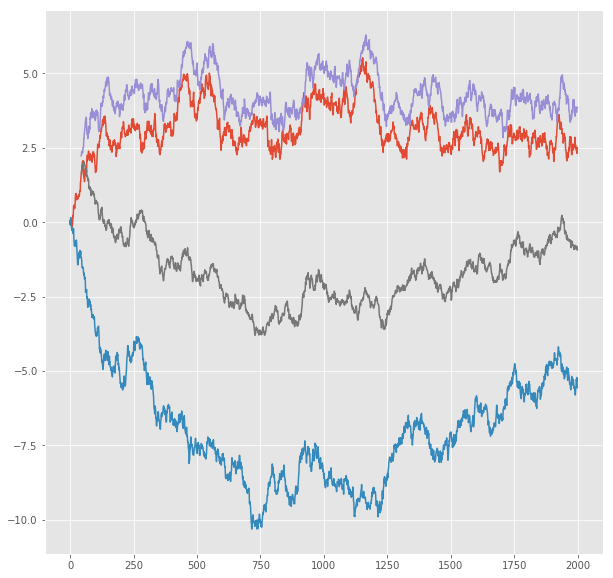

R^2 score for regression on Error: 0.3632
k = 0.9144


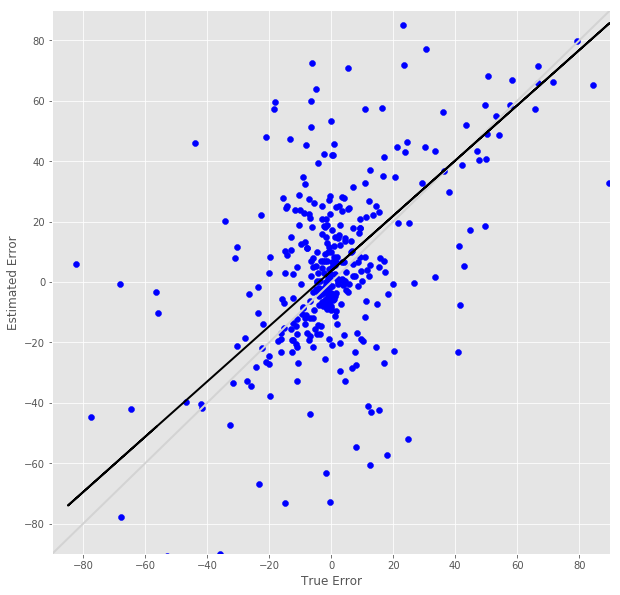

R^2 score for regression on RT: 0.1322
k = 0.4485


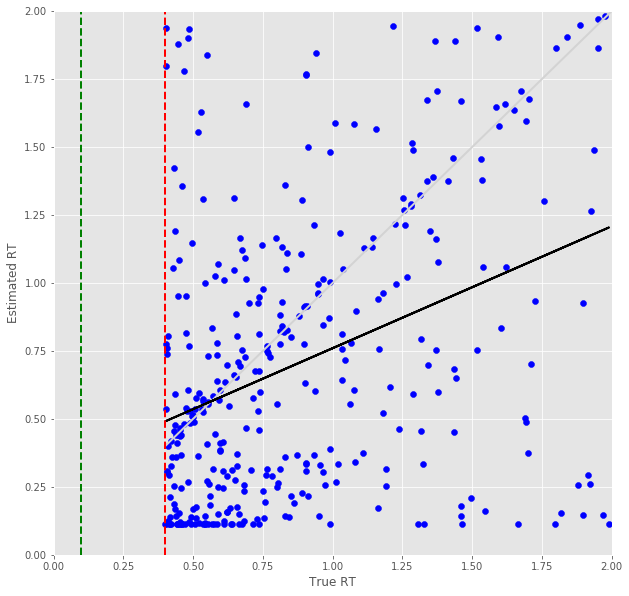

Error Prediction Score: 0.4859 RMSE
RT Prediction Score: 0.6148 RMSE
Error Prediction Corr: 0.4929
RT Prediction Corr: 0.2989
R^2 score for regression on Error: 0.2430
k = 0.6783


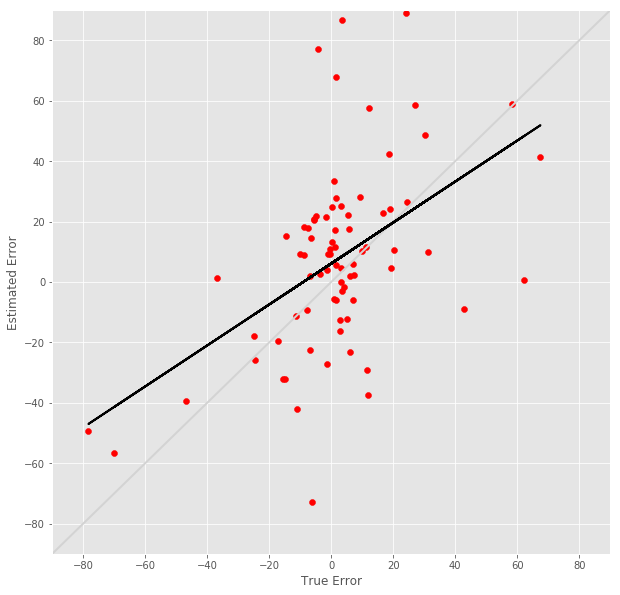

R^2 score for regression on RT: 0.0894
k = 0.3193


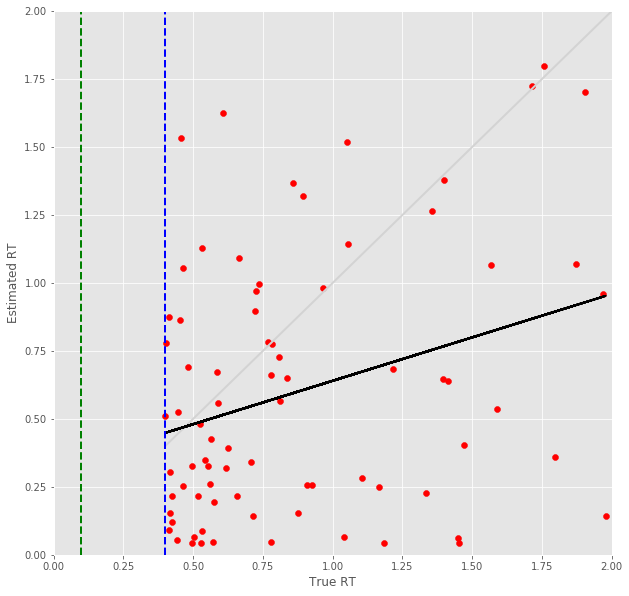

14 -step(s) forecast:
Test Score for 14 -steps forecast: 2.4636 RMSE
Predict Score for 14 -steps forecast: 2.7238 RMSE
Error Test Score for 14 -steps forecast: 0.5309 RMSE
RT Test Score for 14 -steps forecast: 0.5725 RMSE
Error Test Corr for 14 -steps forecast: 0.5895
RT Test Corr for 14 -steps forecast: 0.3569


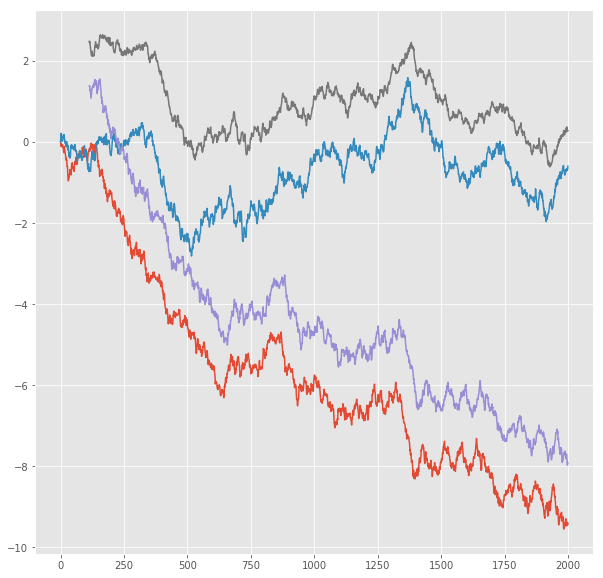

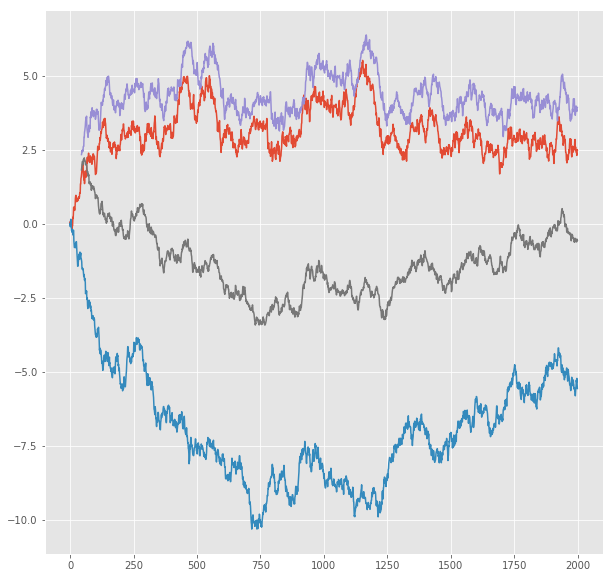

R^2 score for regression on Error: 0.3475
k = 0.9023


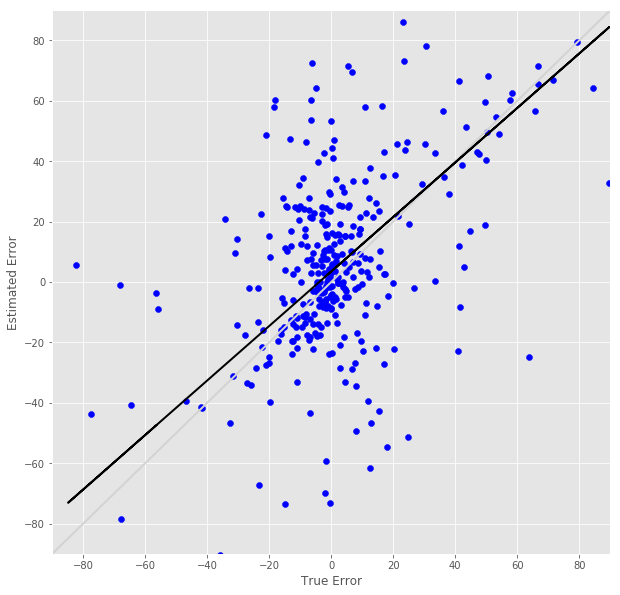

R^2 score for regression on RT: 0.1274
k = 0.4365


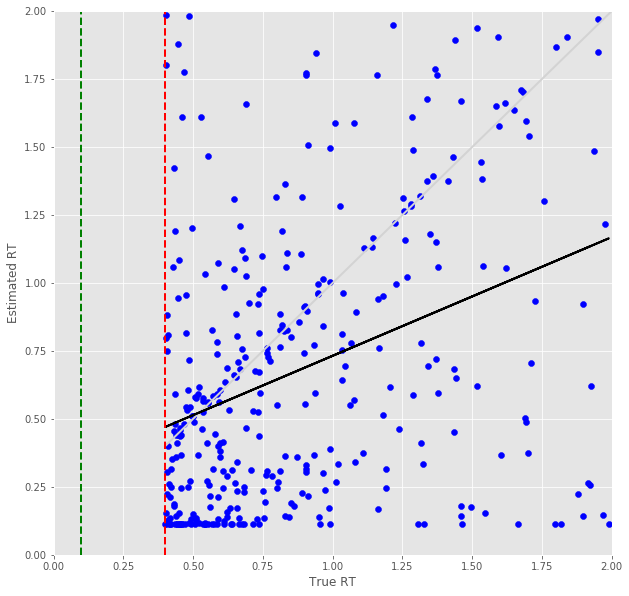

Error Prediction Score: 0.4980 RMSE
RT Prediction Score: 0.6435 RMSE
Error Prediction Corr: 0.4877
RT Prediction Corr: 0.2264
R^2 score for regression on Error: 0.2378
k = 0.6896


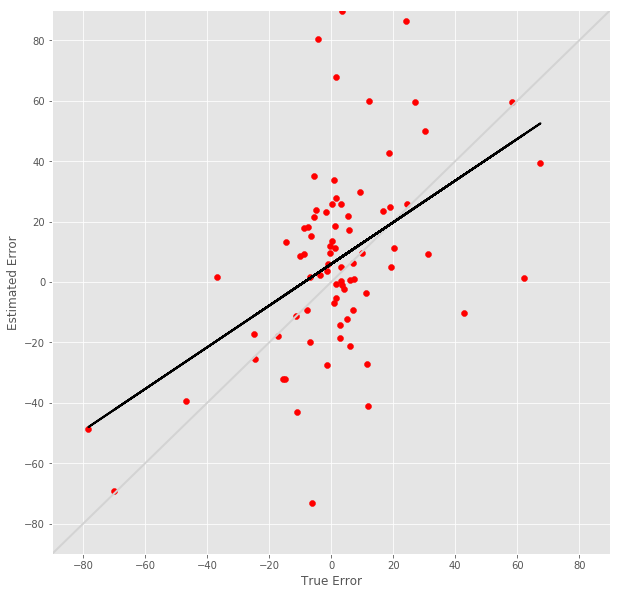

R^2 score for regression on RT: 0.0513
k = 0.2326


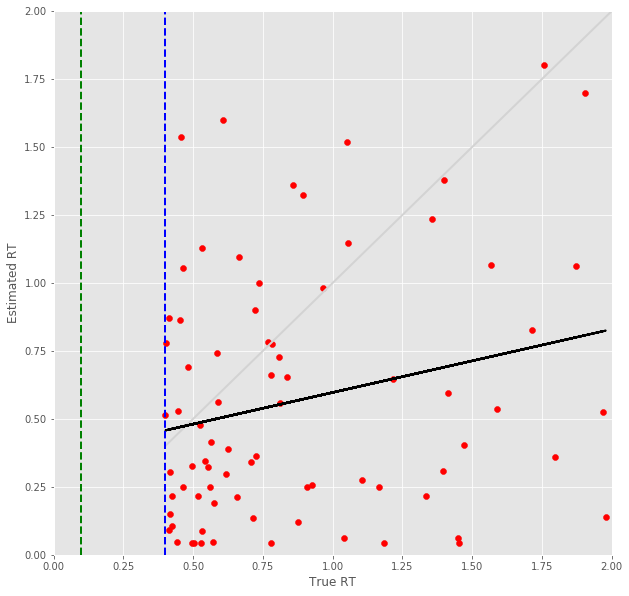

15 -step(s) forecast:
Test Score for 15 -steps forecast: 2.6062 RMSE
Predict Score for 15 -steps forecast: 2.8781 RMSE
Error Test Score for 15 -steps forecast: 0.5557 RMSE
RT Test Score for 15 -steps forecast: 0.5912 RMSE
Error Test Corr for 15 -steps forecast: 0.5939
RT Test Corr for 15 -steps forecast: 0.3451


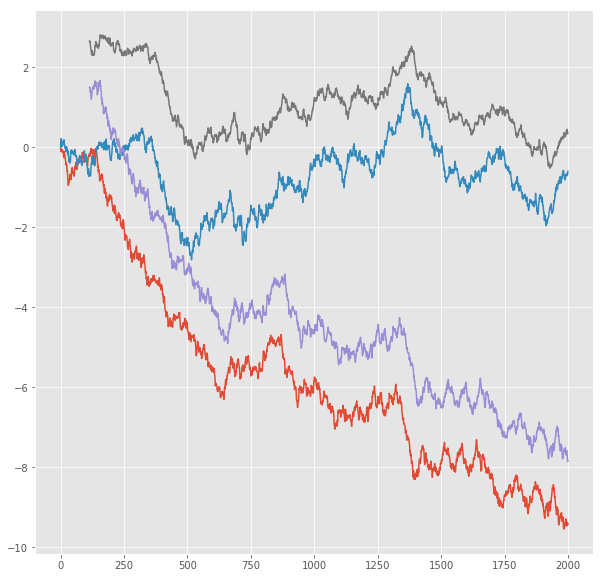

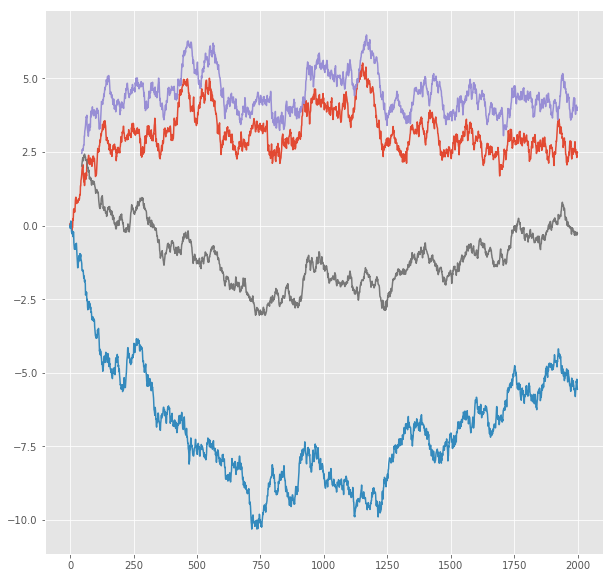

R^2 score for regression on Error: 0.3527
k = 0.9586


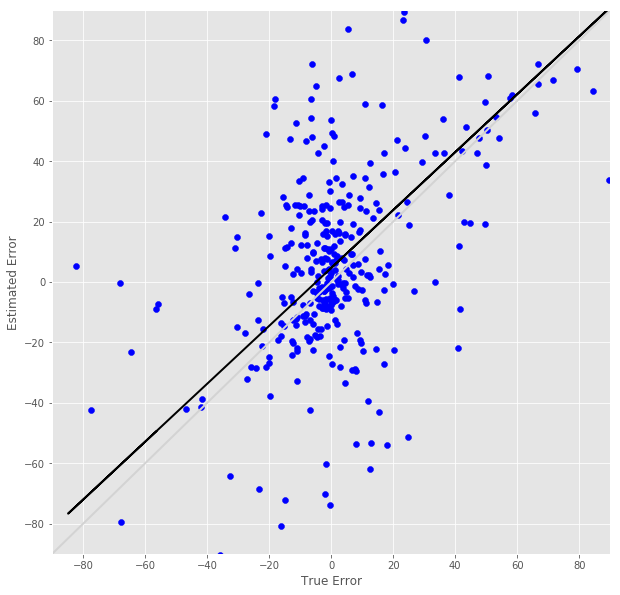

R^2 score for regression on RT: 0.1191
k = 0.4245


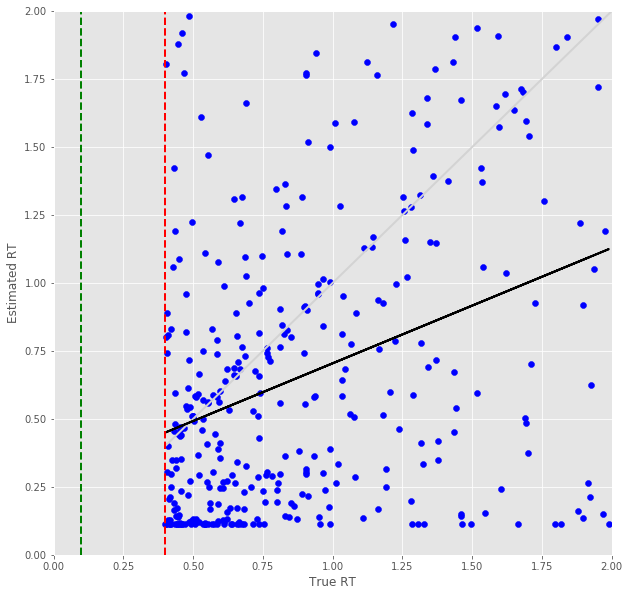

Error Prediction Score: 0.5167 RMSE
RT Prediction Score: 0.6578 RMSE
Error Prediction Corr: 0.4912
RT Prediction Corr: 0.2013
R^2 score for regression on Error: 0.2413
k = 0.7294


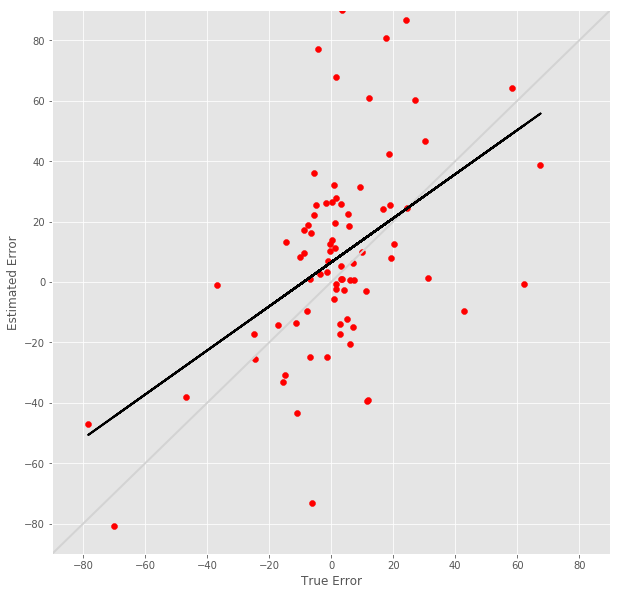

R^2 score for regression on RT: 0.0405
k = 0.2110


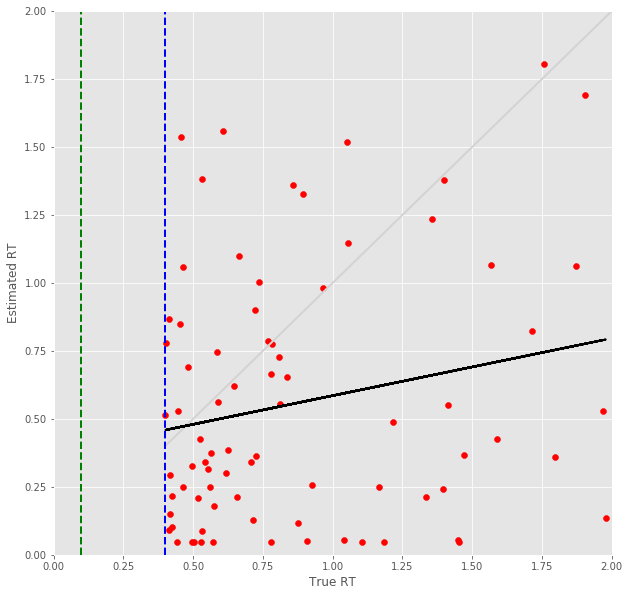

16 -step(s) forecast:
Test Score for 16 -steps forecast: 2.7463 RMSE
Predict Score for 16 -steps forecast: 3.0291 RMSE
Error Test Score for 16 -steps forecast: 0.5827 RMSE
RT Test Score for 16 -steps forecast: 0.6155 RMSE
Error Test Corr for 16 -steps forecast: 0.5384
RT Test Corr for 16 -steps forecast: 0.2935


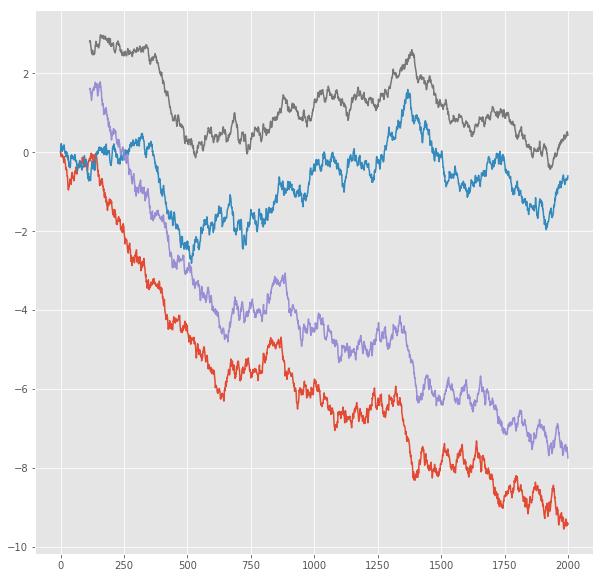

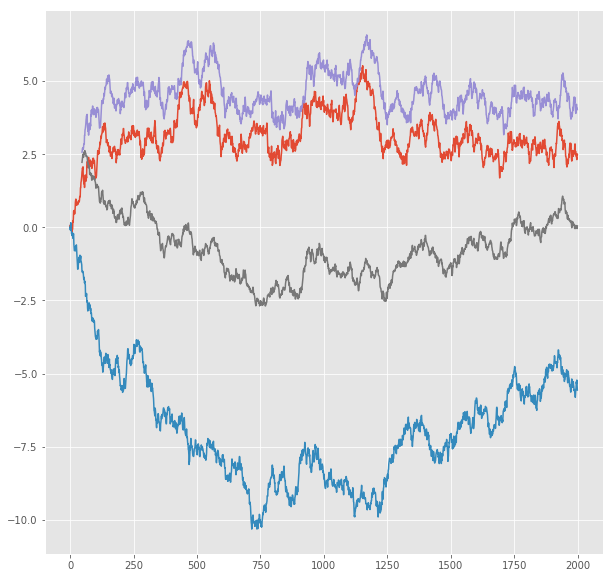

R^2 score for regression on Error: 0.2898
k = 0.8788


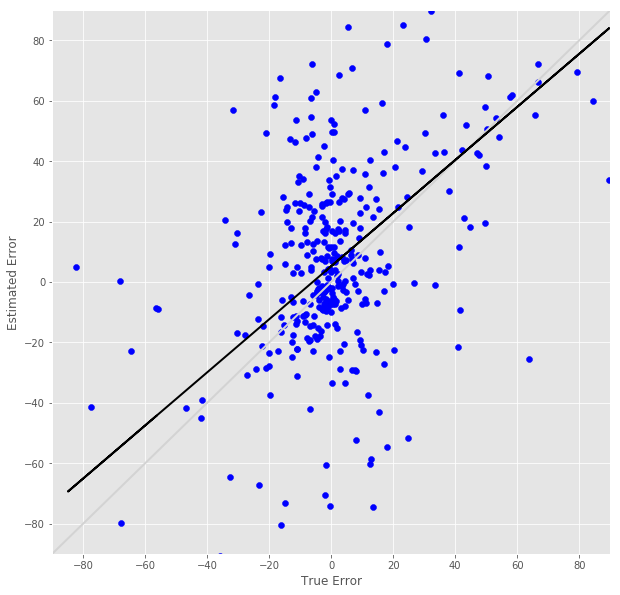

R^2 score for regression on RT: 0.0862
k = 0.3548


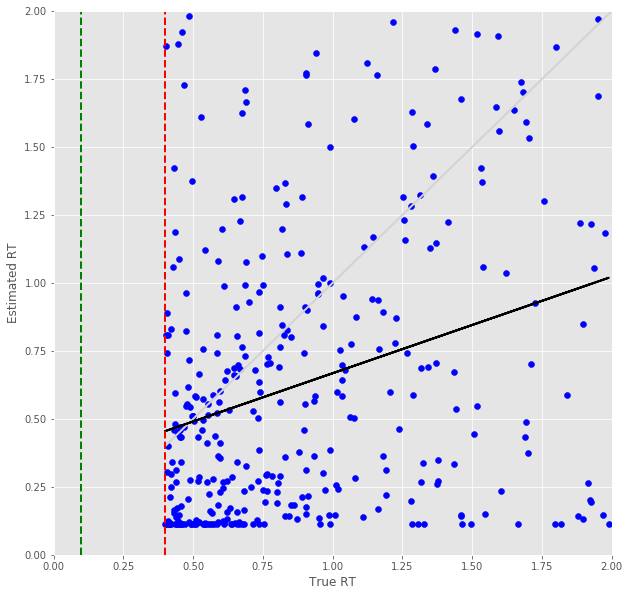

Error Prediction Score: 0.5119 RMSE
RT Prediction Score: 0.6643 RMSE
Error Prediction Corr: 0.4941
RT Prediction Corr: 0.2146
R^2 score for regression on Error: 0.2441
k = 0.7318


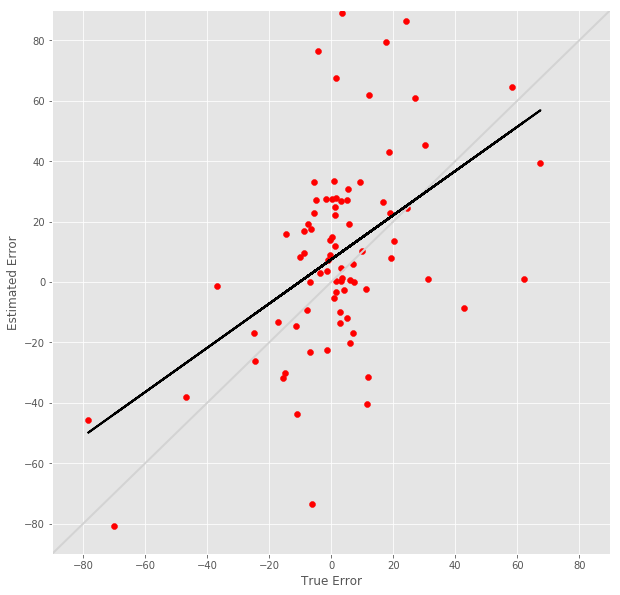

R^2 score for regression on RT: 0.0460
k = 0.2386


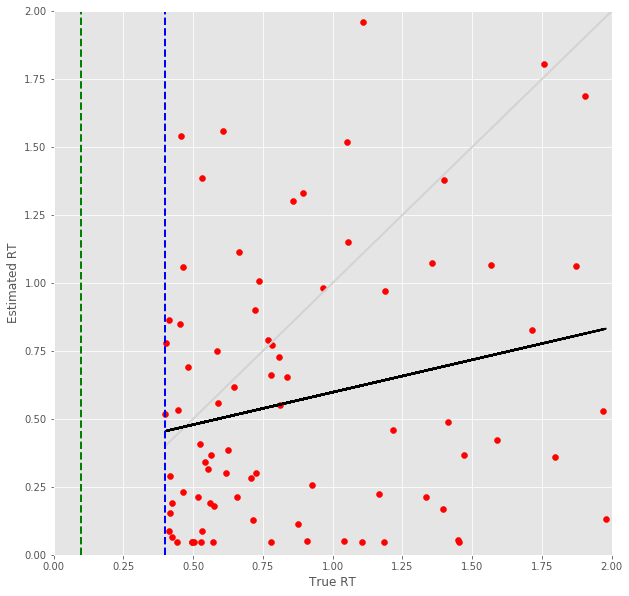

17 -step(s) forecast:
Test Score for 17 -steps forecast: 2.8838 RMSE
Predict Score for 17 -steps forecast: 3.1768 RMSE
Error Test Score for 17 -steps forecast: 0.5985 RMSE
RT Test Score for 17 -steps forecast: 0.6450 RMSE
Error Test Corr for 17 -steps forecast: 0.5090
RT Test Corr for 17 -steps forecast: 0.2470


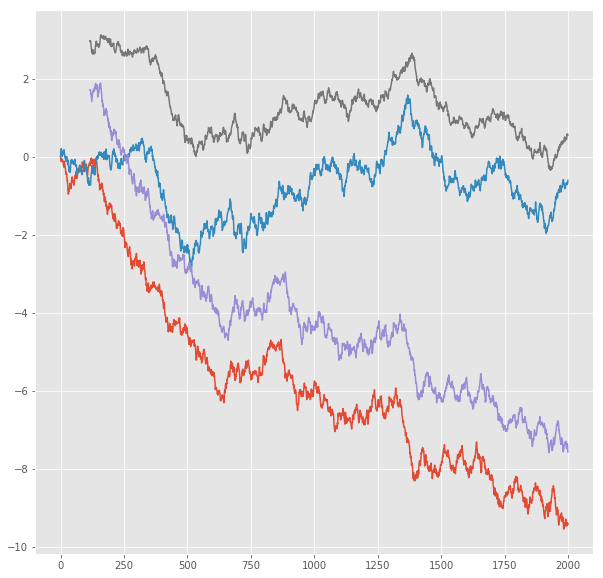

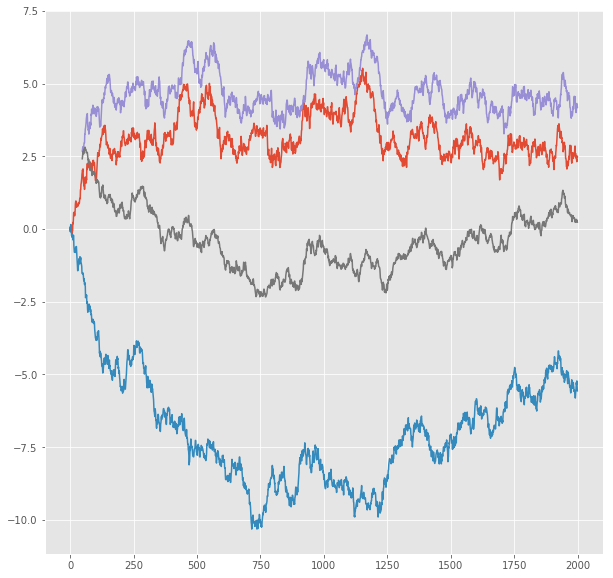

R^2 score for regression on Error: 0.2591
k = 0.8311


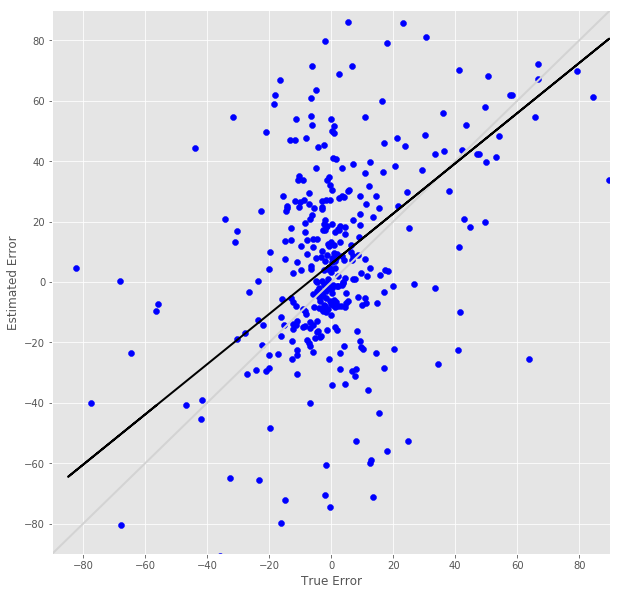

R^2 score for regression on RT: 0.0610
k = 0.2974


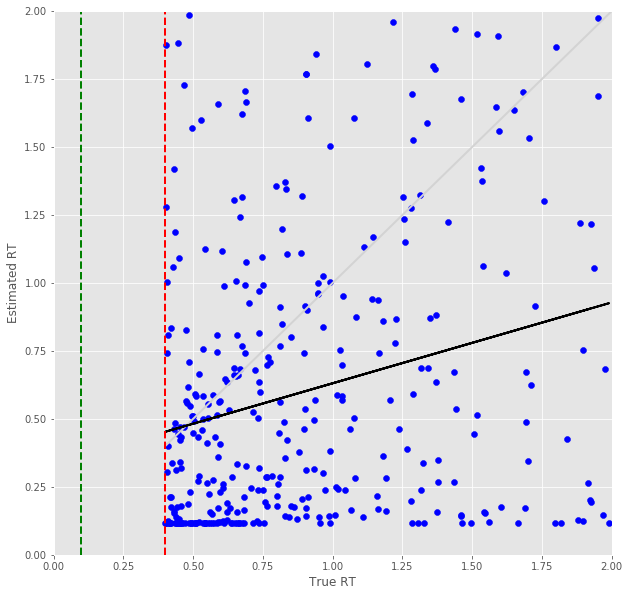

Error Prediction Score: 0.5186 RMSE
RT Prediction Score: 0.6866 RMSE
Error Prediction Corr: 0.4931
RT Prediction Corr: 0.1873
R^2 score for regression on Error: 0.2431
k = 0.7430


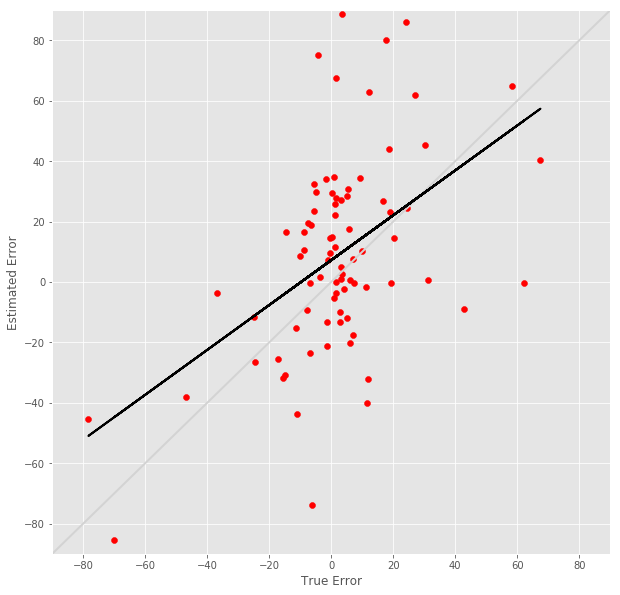

R^2 score for regression on RT: 0.0351
k = 0.2089


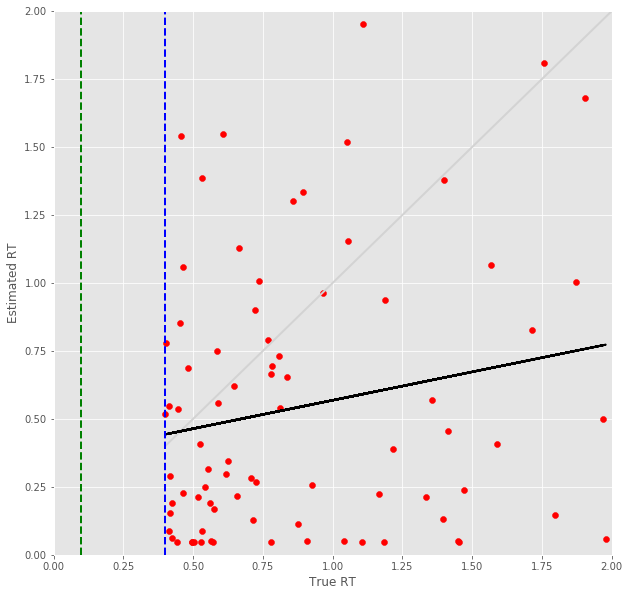

18 -step(s) forecast:
Test Score for 18 -steps forecast: 3.0188 RMSE
Predict Score for 18 -steps forecast: 3.3213 RMSE
Error Test Score for 18 -steps forecast: 0.6226 RMSE
RT Test Score for 18 -steps forecast: 0.6625 RMSE
Error Test Corr for 18 -steps forecast: 0.5091
RT Test Corr for 18 -steps forecast: 0.2217


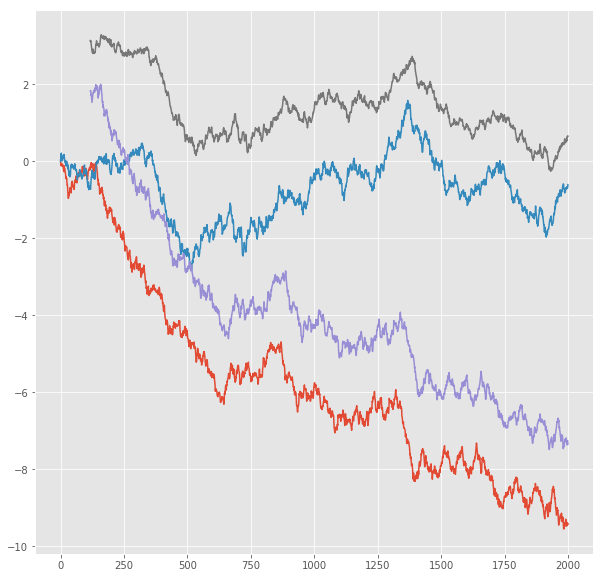

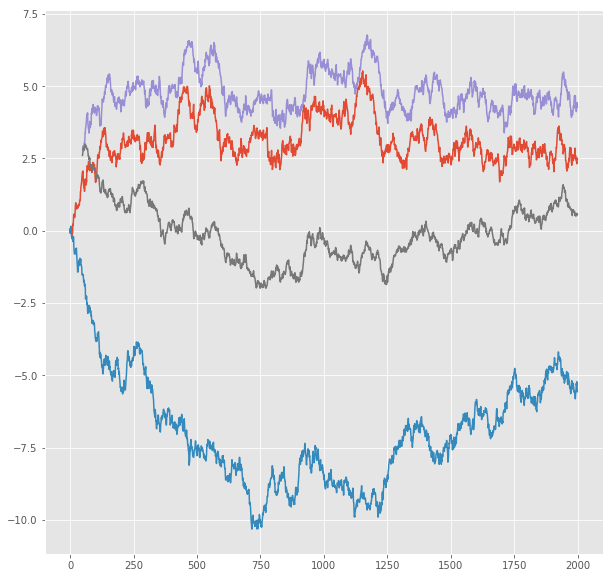

R^2 score for regression on Error: 0.2592
k = 0.8623


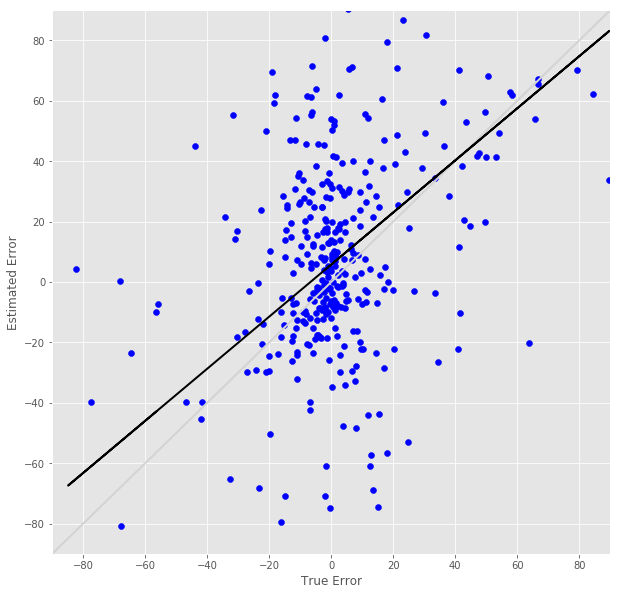

R^2 score for regression on RT: 0.0491
k = 0.2695


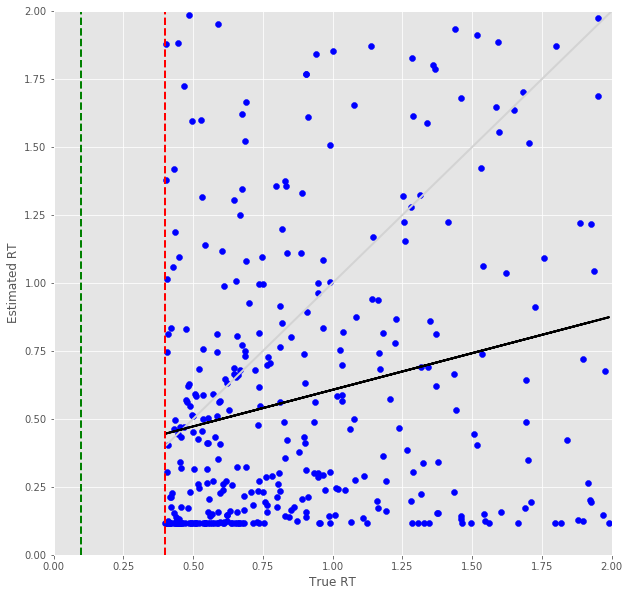

Error Prediction Score: 0.5414 RMSE
RT Prediction Score: 0.7139 RMSE
Error Prediction Corr: 0.4548
RT Prediction Corr: 0.2014
R^2 score for regression on Error: 0.2069
k = 0.6869


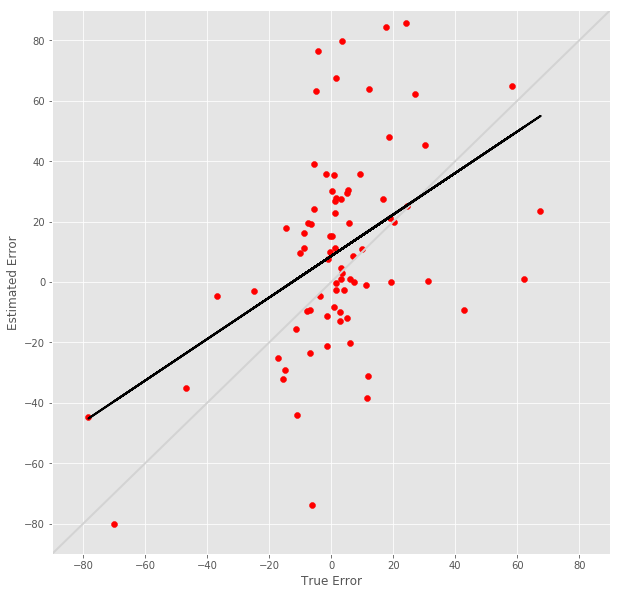

R^2 score for regression on RT: 0.0406
k = 0.2268


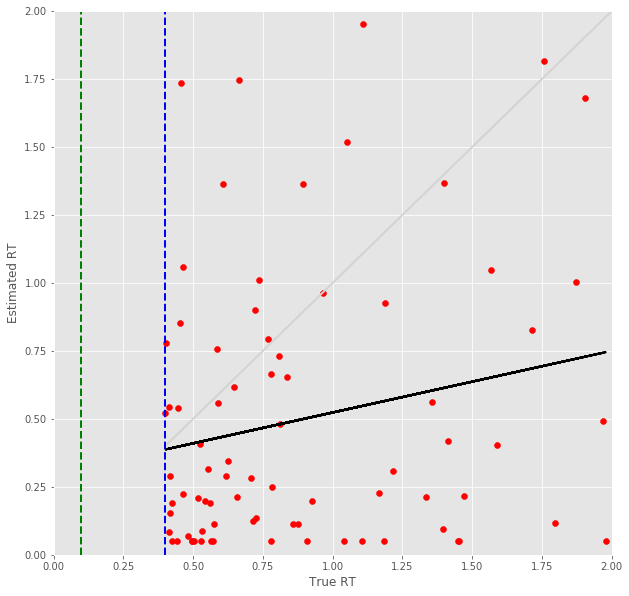

19 -step(s) forecast:
Test Score for 19 -steps forecast: 3.1513 RMSE
Predict Score for 19 -steps forecast: 3.4628 RMSE
Error Test Score for 19 -steps forecast: 0.6341 RMSE
RT Test Score for 19 -steps forecast: 0.6683 RMSE
Error Test Corr for 19 -steps forecast: 0.5021
RT Test Corr for 19 -steps forecast: 0.2171


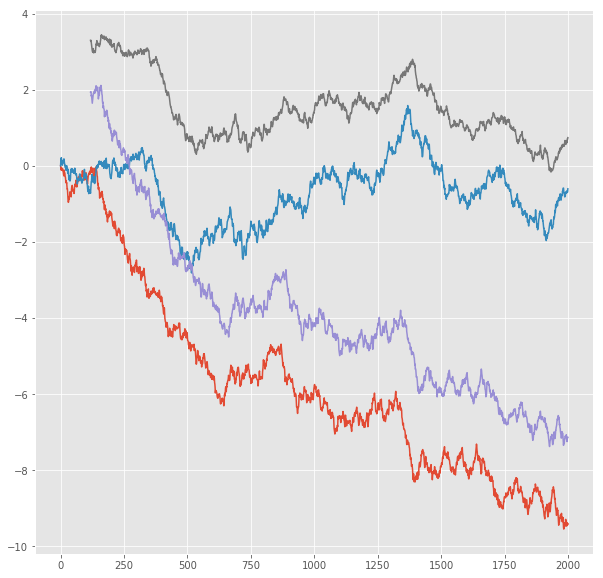

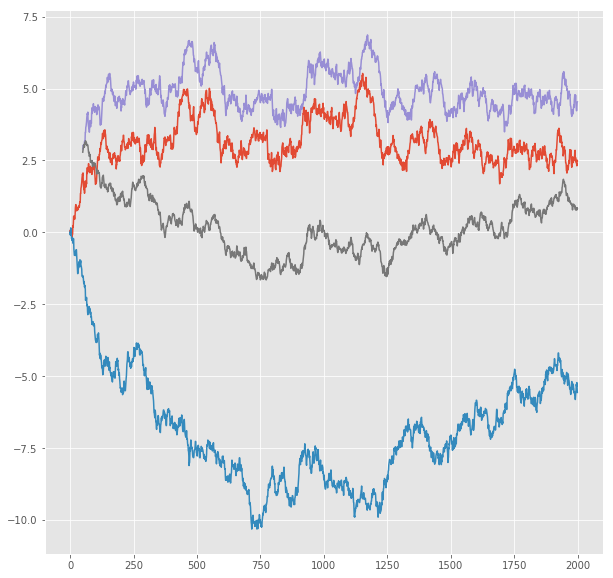

R^2 score for regression on Error: 0.2521
k = 0.8596


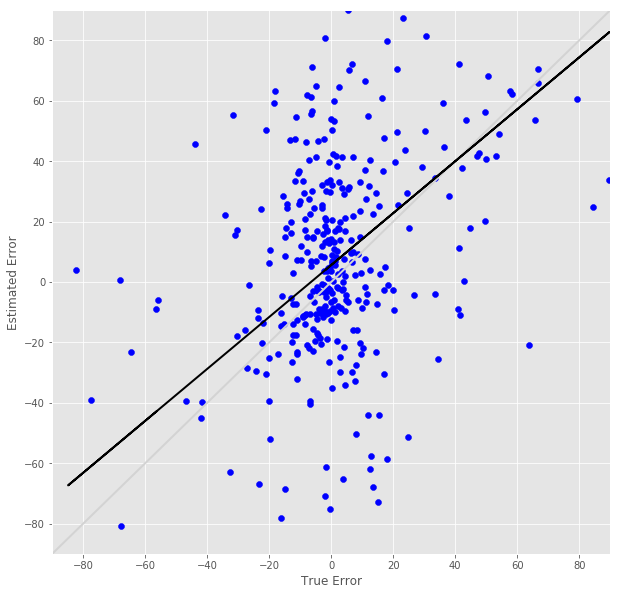

R^2 score for regression on RT: 0.0471
k = 0.2560


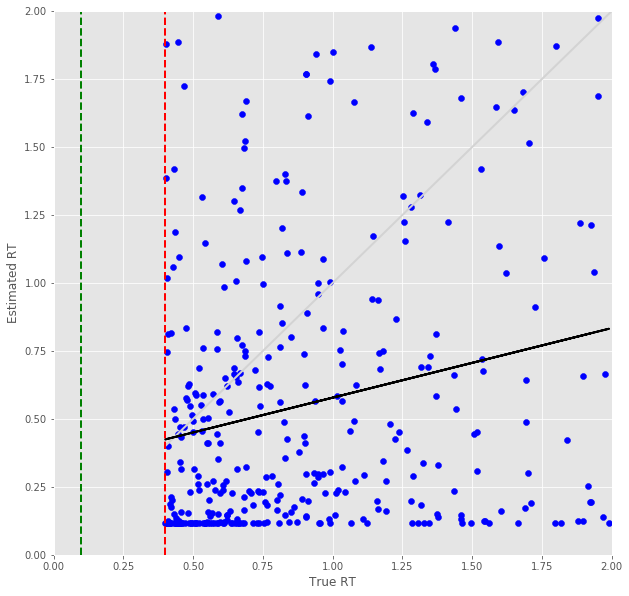

Error Prediction Score: 0.5524 RMSE
RT Prediction Score: 0.7213 RMSE
Error Prediction Corr: 0.5224
RT Prediction Corr: 0.2391
R^2 score for regression on Error: 0.2729
k = 0.8467


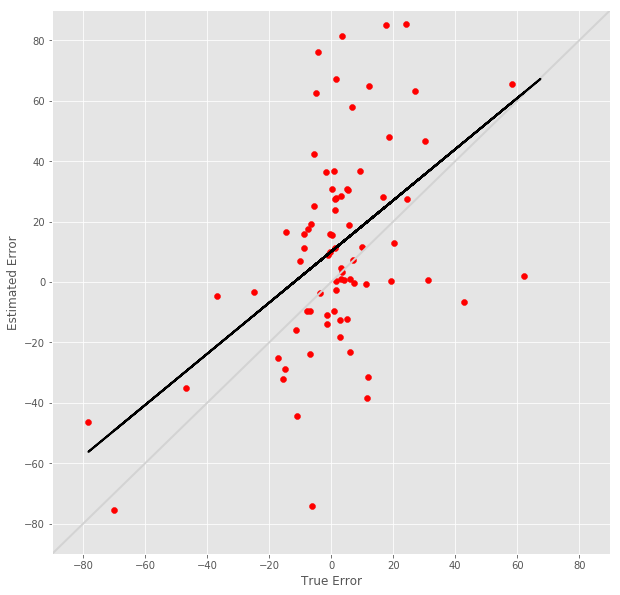

R^2 score for regression on RT: 0.0572
k = 0.2553


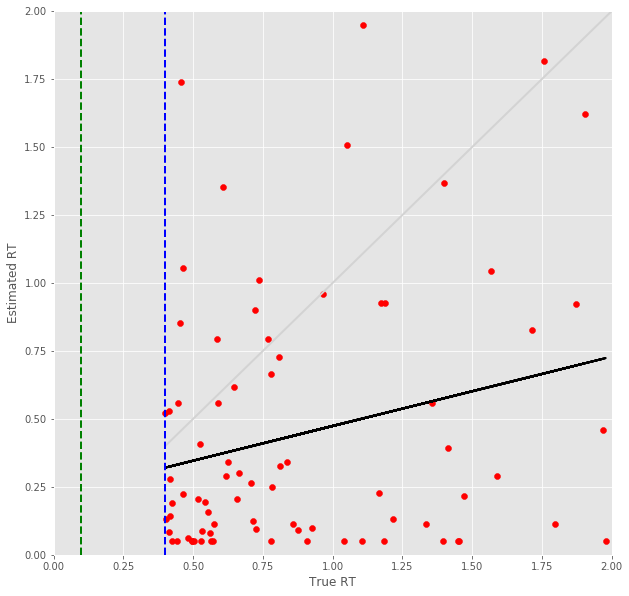

20 -step(s) forecast:
Test Score for 20 -steps forecast: 3.2813 RMSE
Predict Score for 20 -steps forecast: 3.6010 RMSE
Error Test Score for 20 -steps forecast: 0.6497 RMSE
RT Test Score for 20 -steps forecast: 0.6837 RMSE
Error Test Corr for 20 -steps forecast: 0.5100
RT Test Corr for 20 -steps forecast: 0.1916


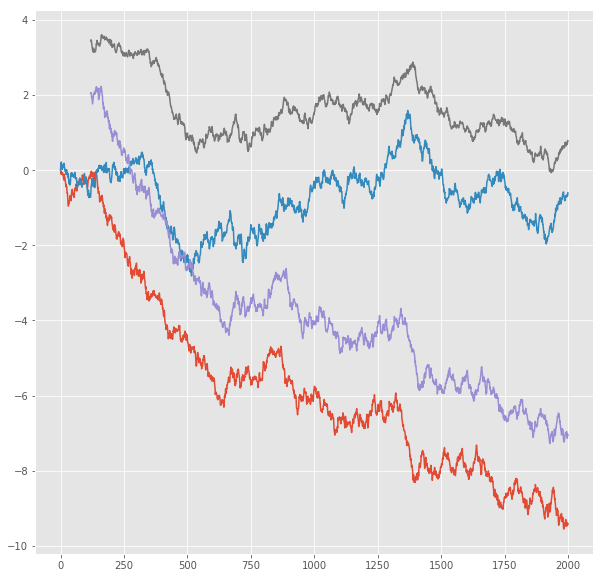

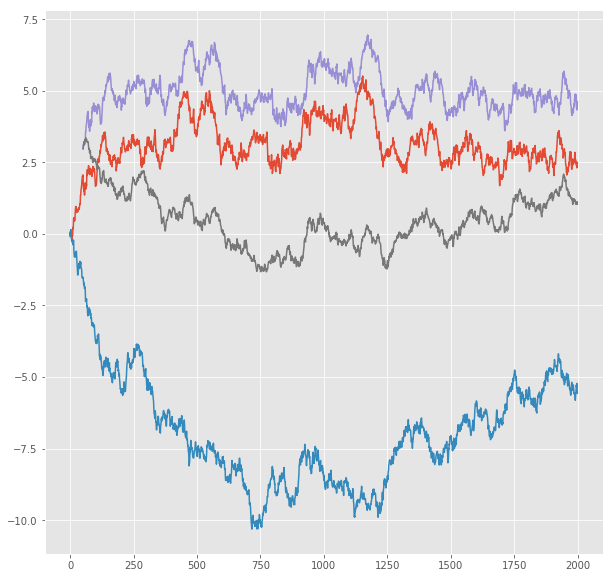

R^2 score for regression on Error: 0.2601
k = 0.9046


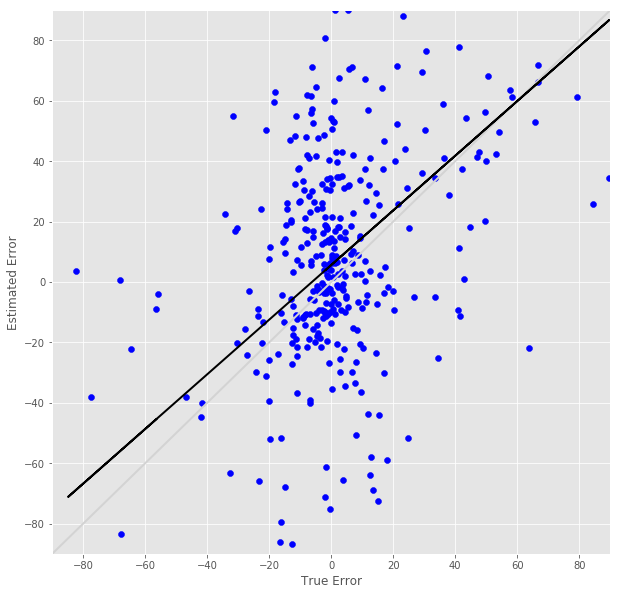

R^2 score for regression on RT: 0.0367
k = 0.2215


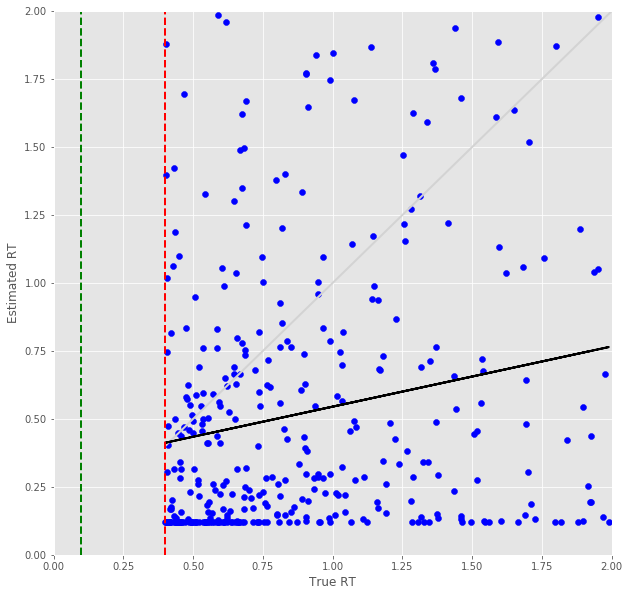

Error Prediction Score: 0.5638 RMSE
RT Prediction Score: 0.7284 RMSE
Error Prediction Corr: 0.5090
RT Prediction Corr: 0.1461
R^2 score for regression on Error: 0.2591
k = 0.8277


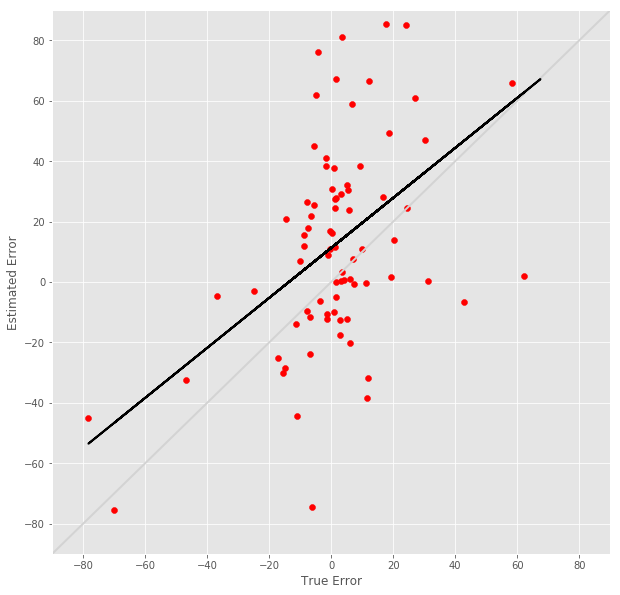

R^2 score for regression on RT: 0.0214
k = 0.1512


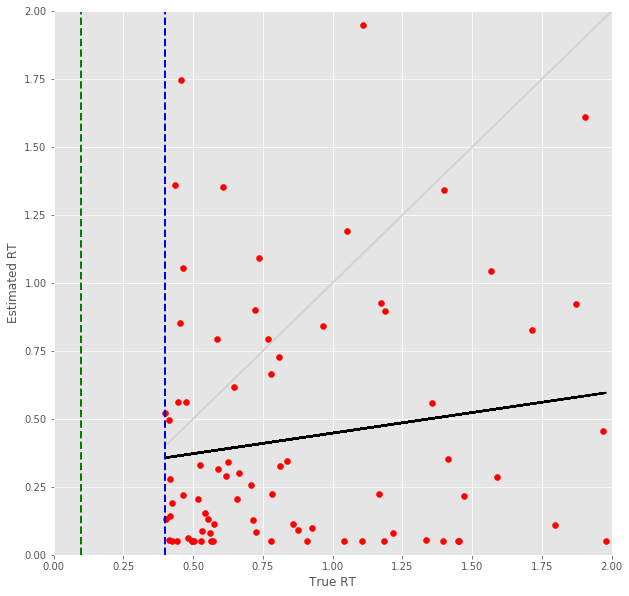

21 -step(s) forecast:
Test Score for 21 -steps forecast: 3.4089 RMSE
Predict Score for 21 -steps forecast: 3.7363 RMSE
Error Test Score for 21 -steps forecast: 0.6605 RMSE
RT Test Score for 21 -steps forecast: 0.6944 RMSE
Error Test Corr for 21 -steps forecast: 0.5076
RT Test Corr for 21 -steps forecast: 0.1826


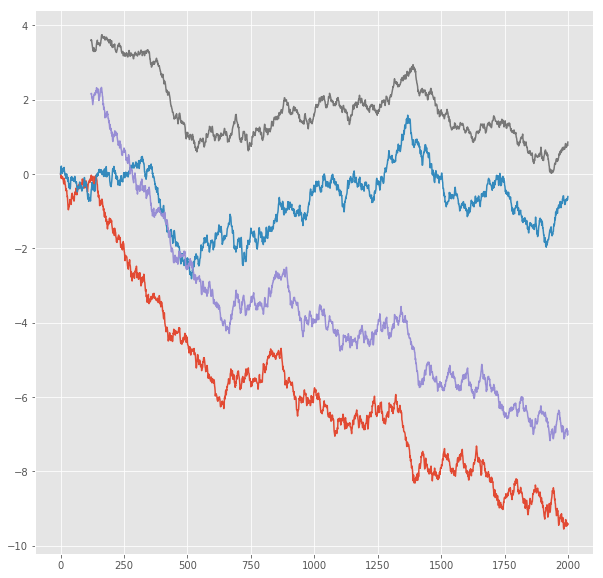

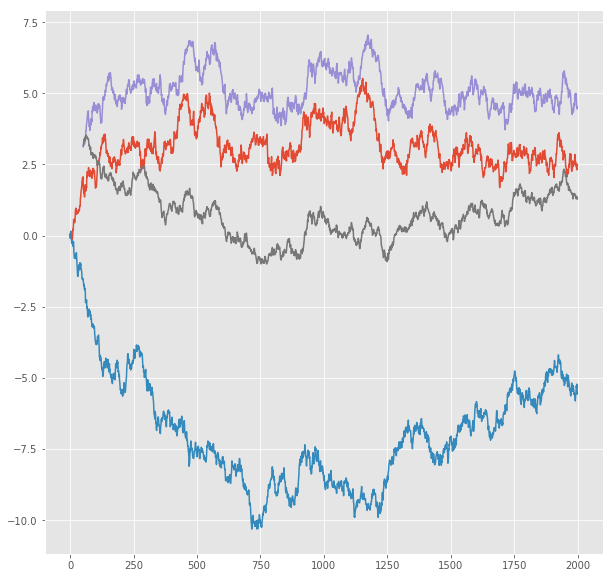

R^2 score for regression on Error: 0.2576
k = 0.9050


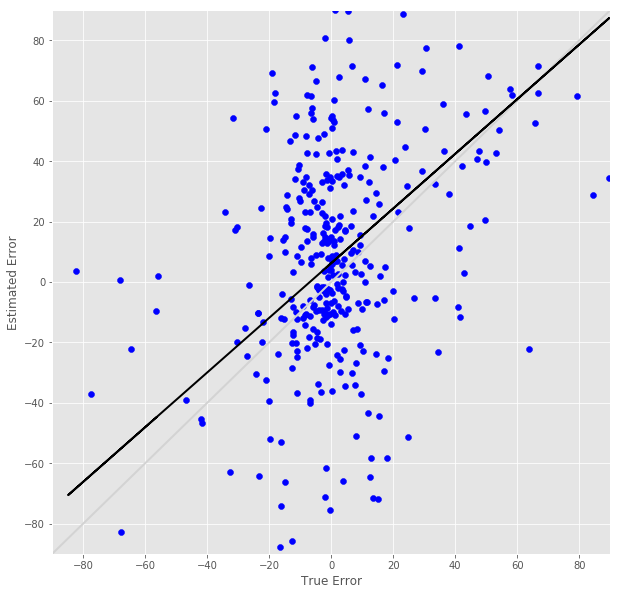

R^2 score for regression on RT: 0.0333
k = 0.2125


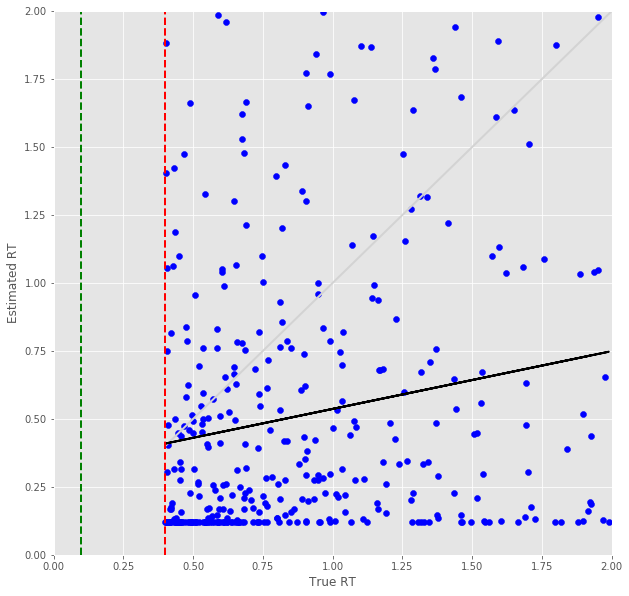

Error Prediction Score: 0.5851 RMSE
RT Prediction Score: 0.7417 RMSE
Error Prediction Corr: 0.4775
RT Prediction Corr: 0.1096
R^2 score for regression on Error: 0.2280
k = 0.8032


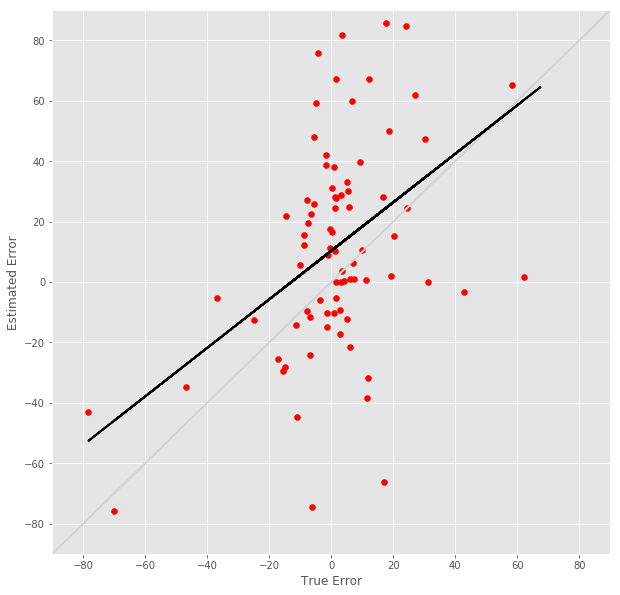

R^2 score for regression on RT: 0.0120
k = 0.1189


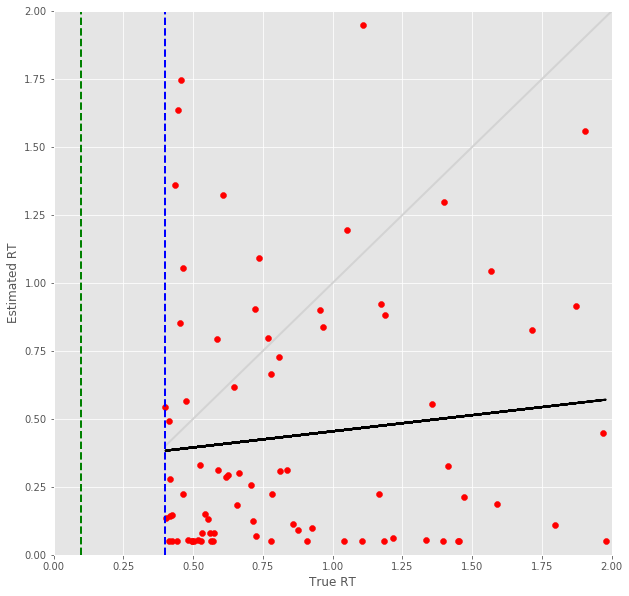

22 -step(s) forecast:
Test Score for 22 -steps forecast: 3.5340 RMSE
Predict Score for 22 -steps forecast: 3.8684 RMSE
Error Test Score for 22 -steps forecast: 0.6724 RMSE
RT Test Score for 22 -steps forecast: 0.7097 RMSE
Error Test Corr for 22 -steps forecast: 0.4991
RT Test Corr for 22 -steps forecast: 0.1501


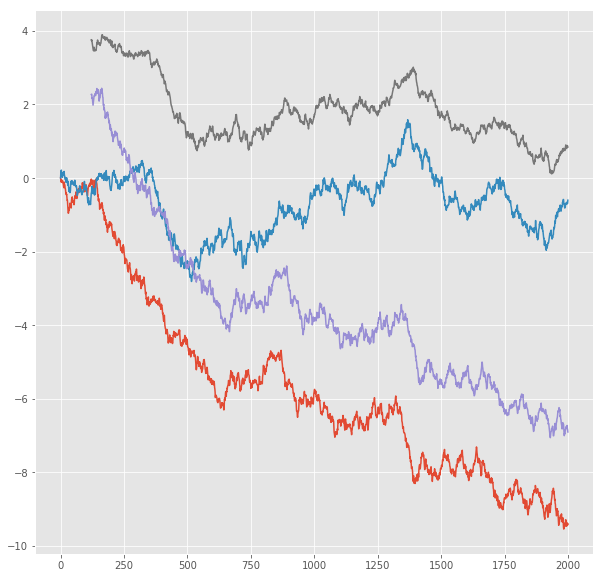

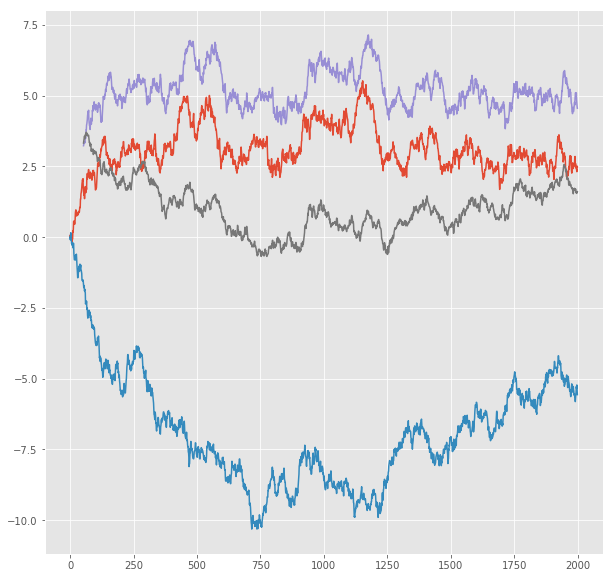

R^2 score for regression on Error: 0.2491
k = 0.9006


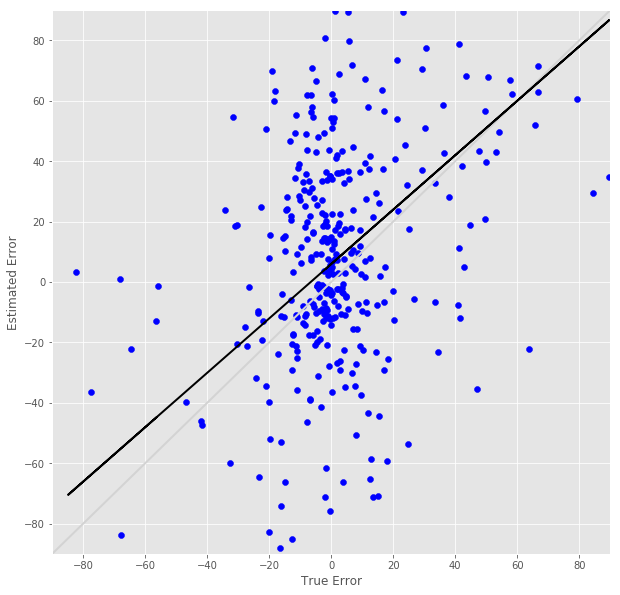

R^2 score for regression on RT: 0.0225
k = 0.1697


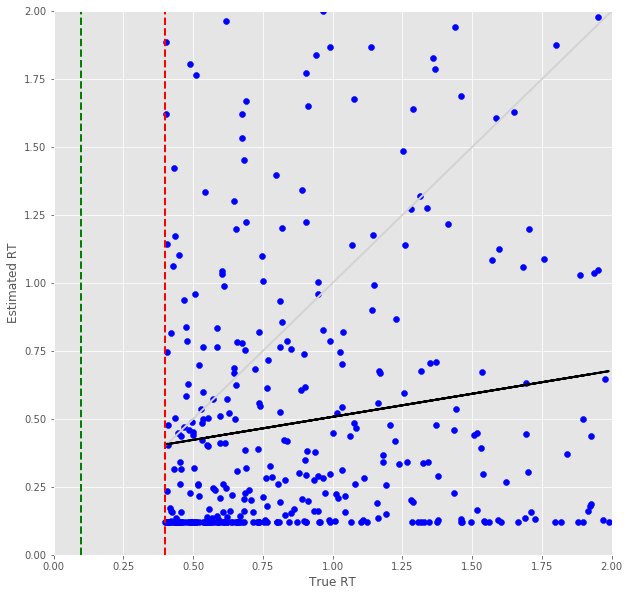

Error Prediction Score: 0.5893 RMSE
RT Prediction Score: 0.7405 RMSE
Error Prediction Corr: 0.4770
RT Prediction Corr: 0.1127
R^2 score for regression on Error: 0.2275
k = 0.8074


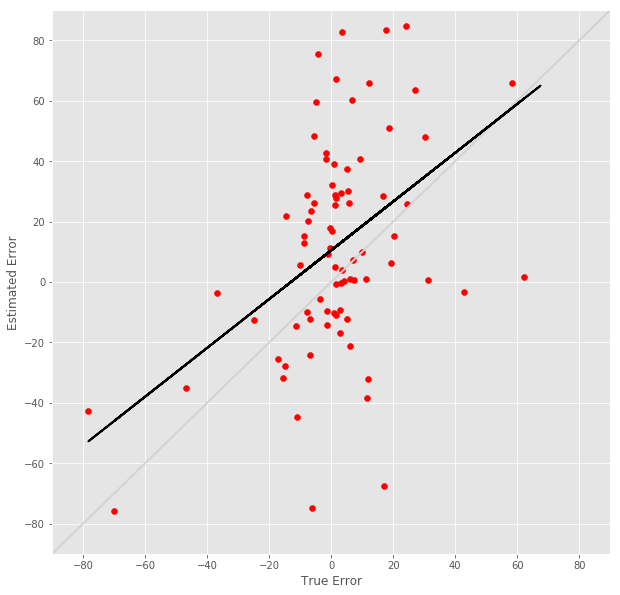

R^2 score for regression on RT: 0.0127
k = 0.1156


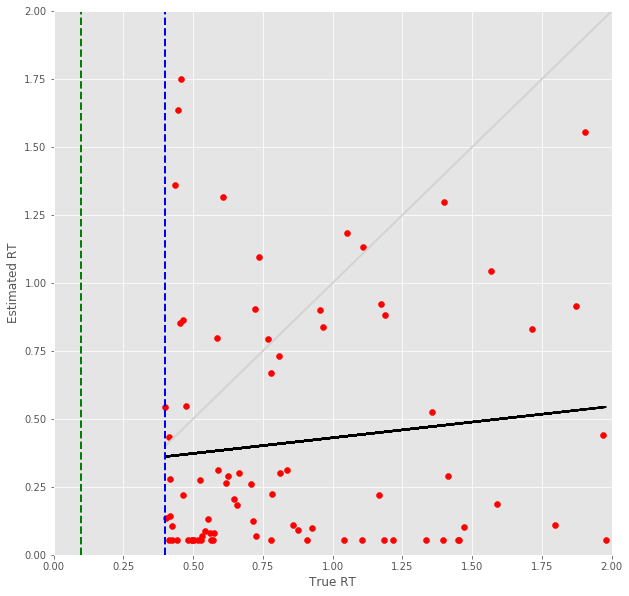

23 -step(s) forecast:
Test Score for 23 -steps forecast: 3.6568 RMSE
Predict Score for 23 -steps forecast: 3.9975 RMSE
Error Test Score for 23 -steps forecast: 0.6825 RMSE
RT Test Score for 23 -steps forecast: 0.7248 RMSE
Error Test Corr for 23 -steps forecast: 0.4727
RT Test Corr for 23 -steps forecast: 0.1293


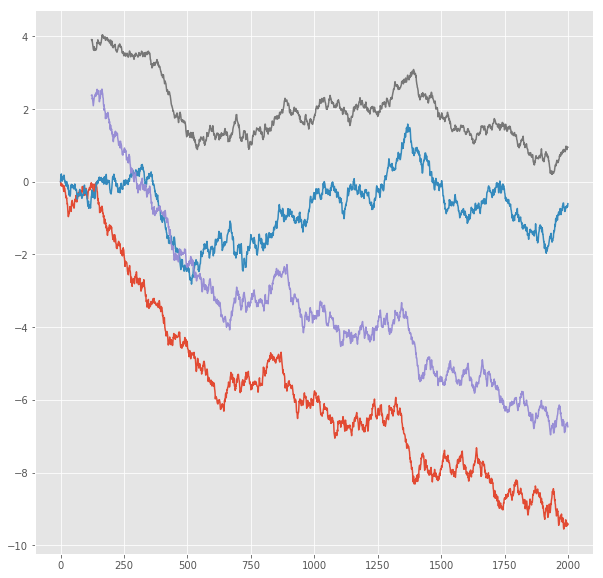

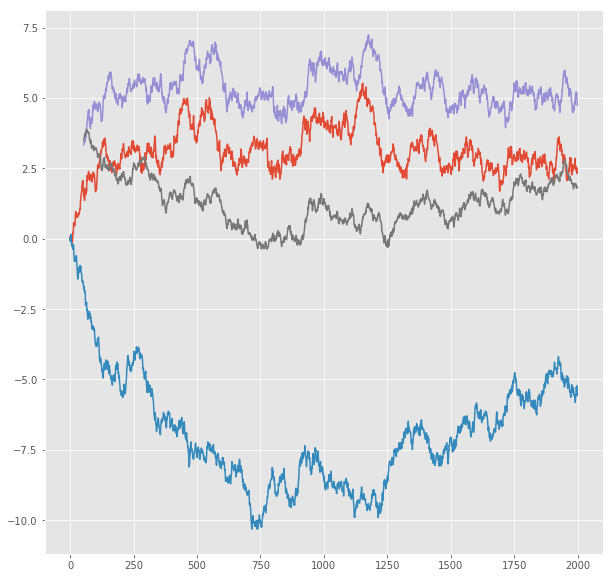

R^2 score for regression on Error: 0.2235
k = 0.8483


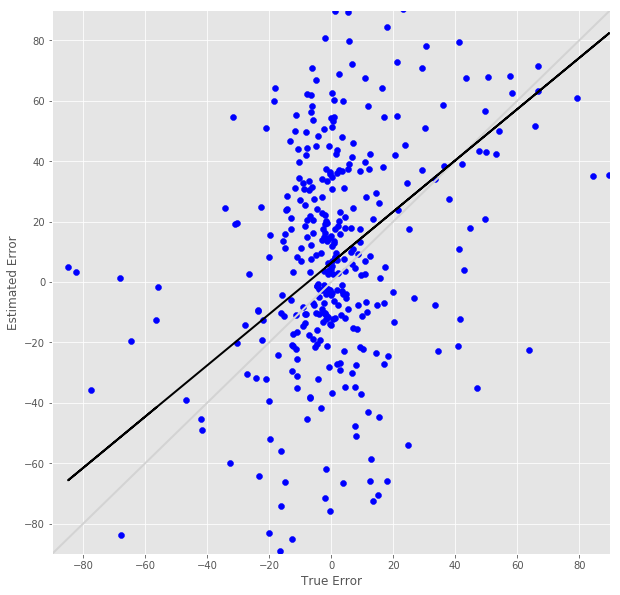

R^2 score for regression on RT: 0.0167
k = 0.1423


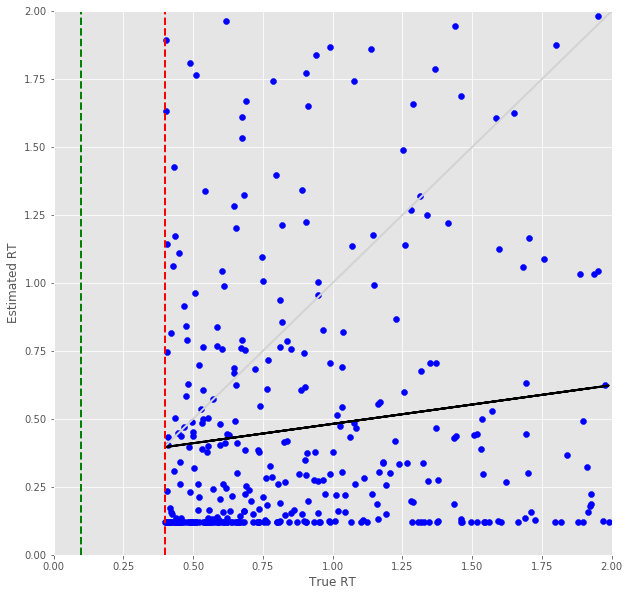

Error Prediction Score: 0.6056 RMSE
RT Prediction Score: 0.7363 RMSE
Error Prediction Corr: 0.4766
RT Prediction Corr: 0.1855
R^2 score for regression on Error: 0.2271
k = 0.8269


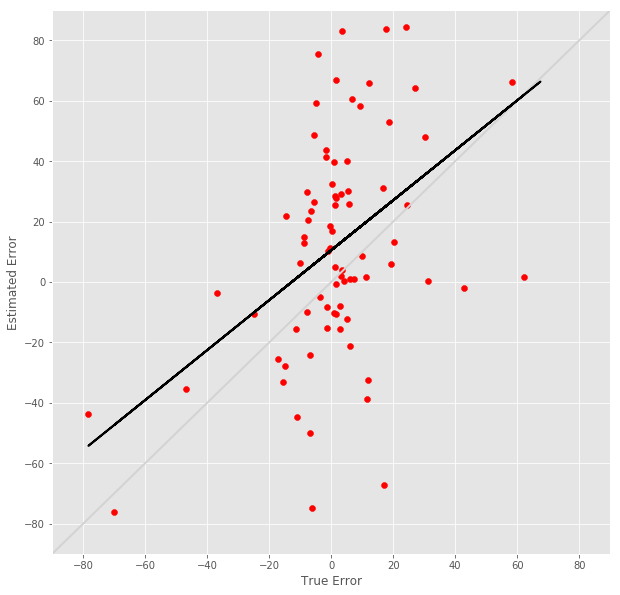

R^2 score for regression on RT: 0.0344
k = 0.1638


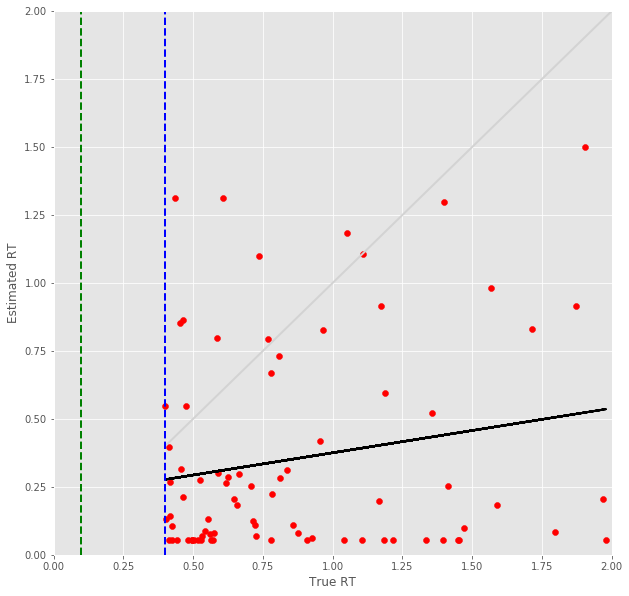

24 -step(s) forecast:
Test Score for 24 -steps forecast: 3.7771 RMSE
Predict Score for 24 -steps forecast: 4.1237 RMSE
Error Test Score for 24 -steps forecast: 0.6906 RMSE
RT Test Score for 24 -steps forecast: 0.7392 RMSE
Error Test Corr for 24 -steps forecast: 0.4692
RT Test Corr for 24 -steps forecast: 0.1074


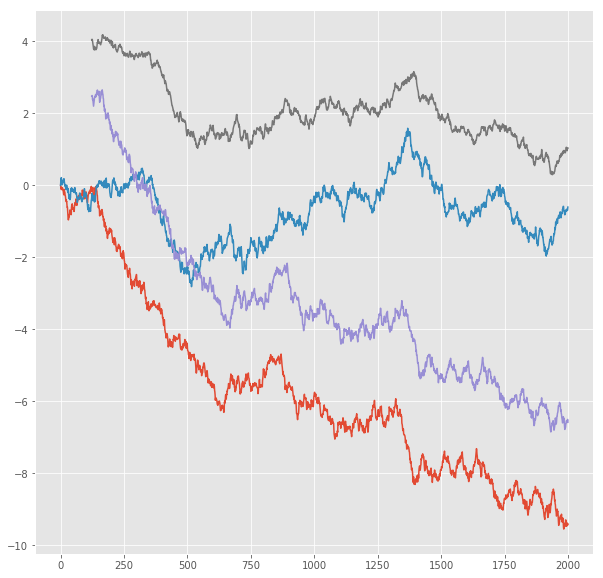

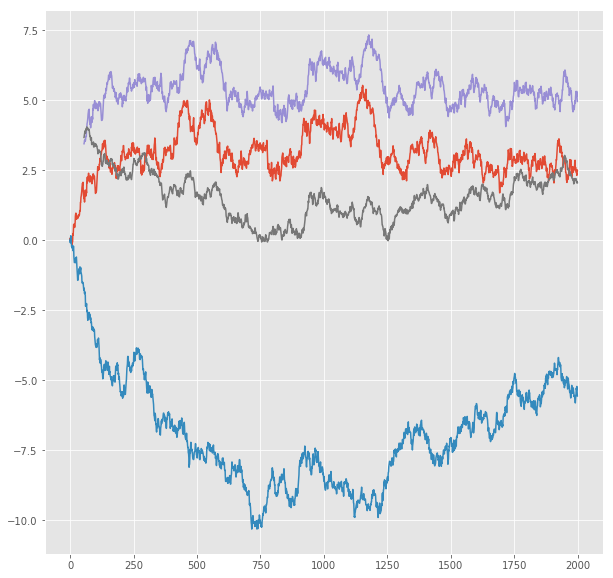

R^2 score for regression on Error: 0.2201
k = 0.8494


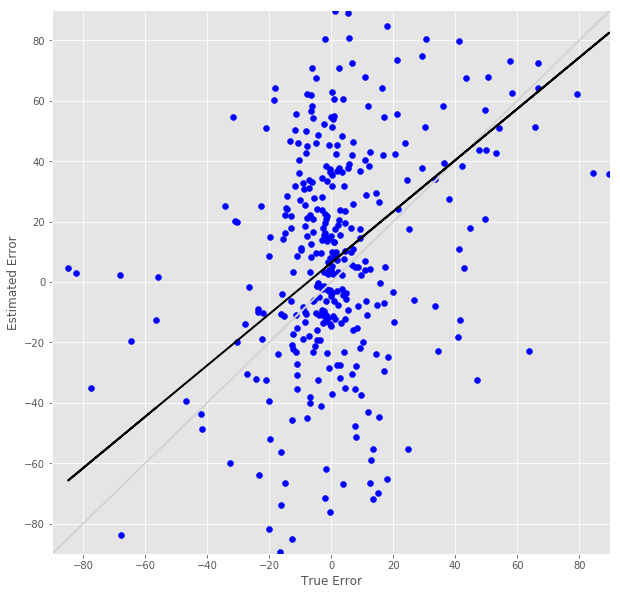

R^2 score for regression on RT: 0.0115
k = 0.1150


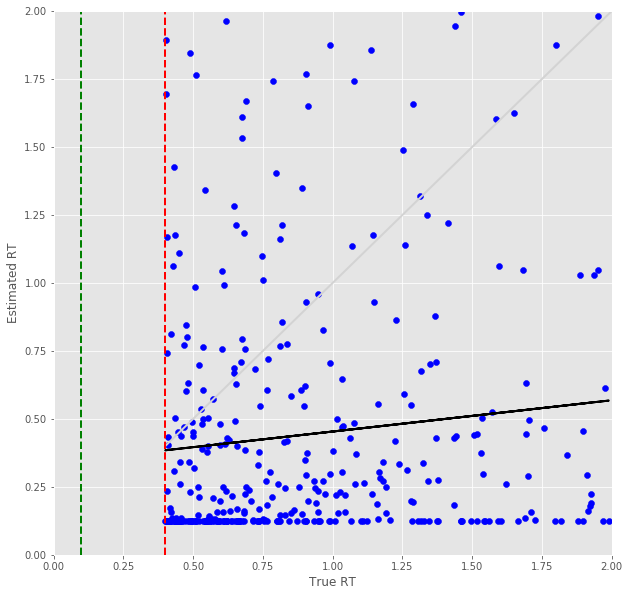

Error Prediction Score: 0.6165 RMSE
RT Prediction Score: 0.7676 RMSE
Error Prediction Corr: 0.4736
RT Prediction Corr: 0.1619
R^2 score for regression on Error: 0.2243
k = 0.8334


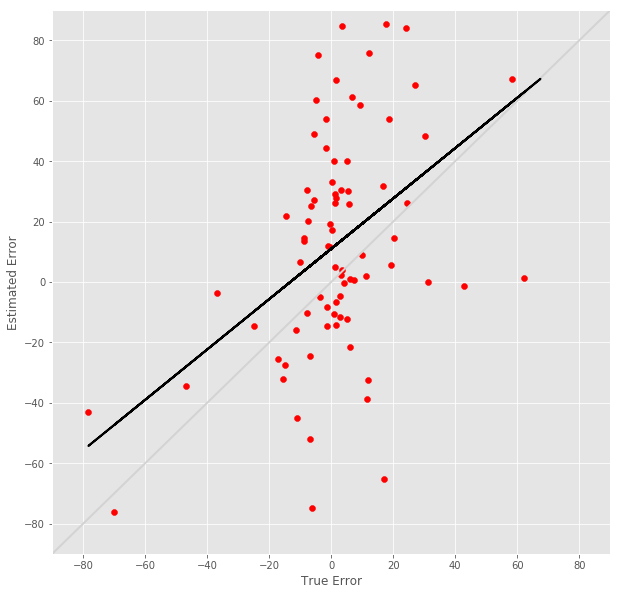

R^2 score for regression on RT: 0.0262
k = 0.1403


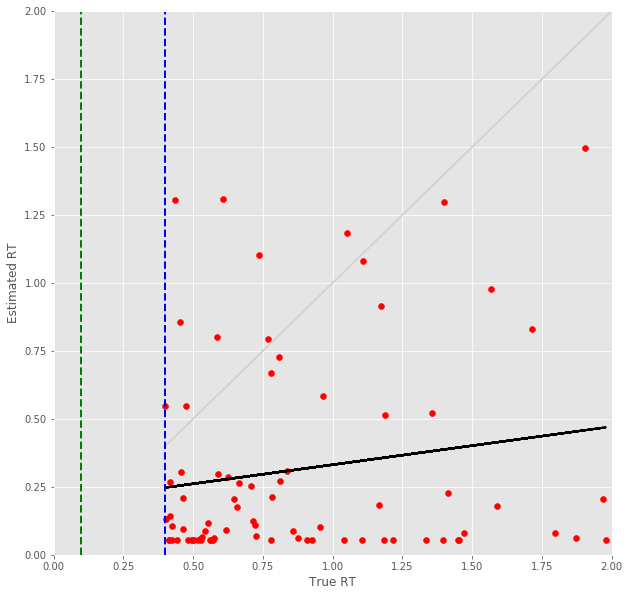

25 -step(s) forecast:
Test Score for 25 -steps forecast: 3.8951 RMSE
Predict Score for 25 -steps forecast: 4.2468 RMSE
Error Test Score for 25 -steps forecast: 0.7081 RMSE
RT Test Score for 25 -steps forecast: 0.7528 RMSE
Error Test Corr for 25 -steps forecast: 0.4852
RT Test Corr for 25 -steps forecast: 0.0823


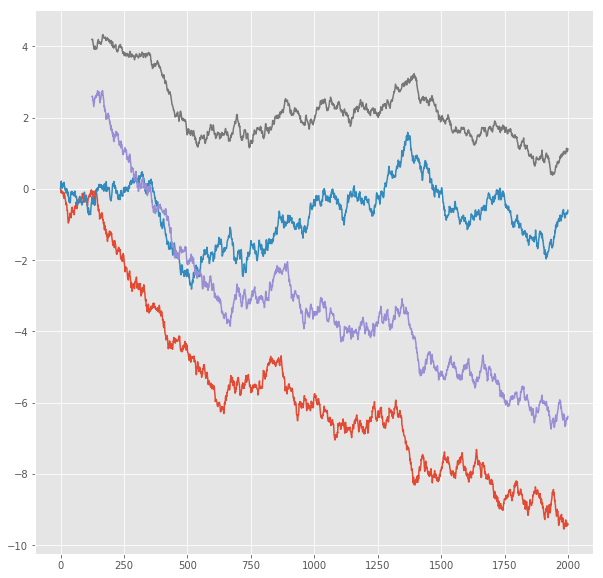

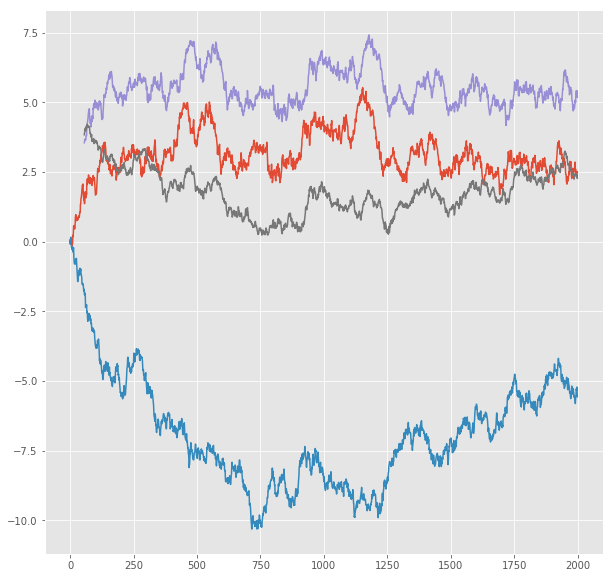

R^2 score for regression on Error: 0.2354
k = 0.9092


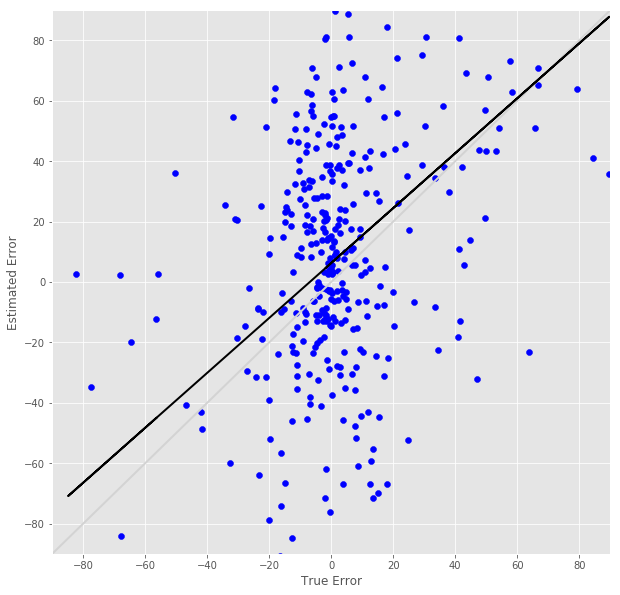

R^2 score for regression on RT: 0.0068
k = 0.0873


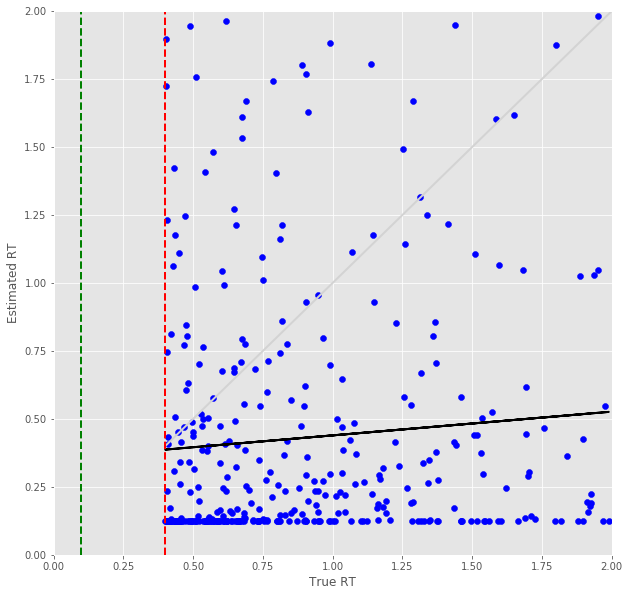

Error Prediction Score: 0.6369 RMSE
RT Prediction Score: 0.7705 RMSE
Error Prediction Corr: 0.4501
RT Prediction Corr: 0.1239
R^2 score for regression on Error: 0.2026
k = 0.8004


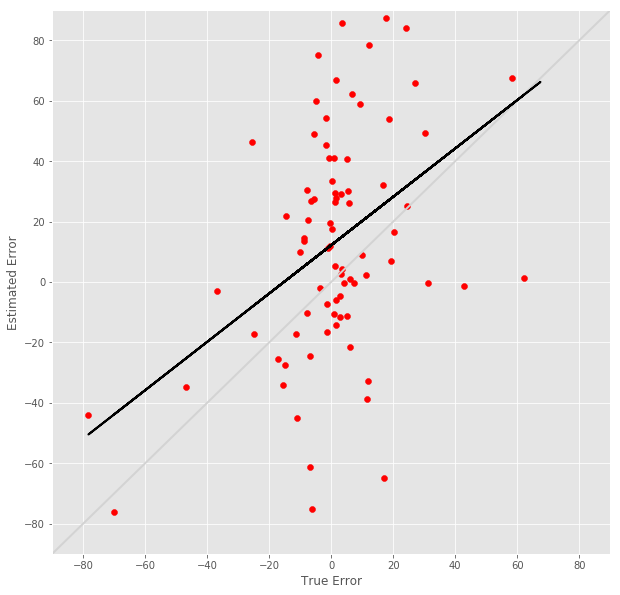

R^2 score for regression on RT: 0.0154
k = 0.1149


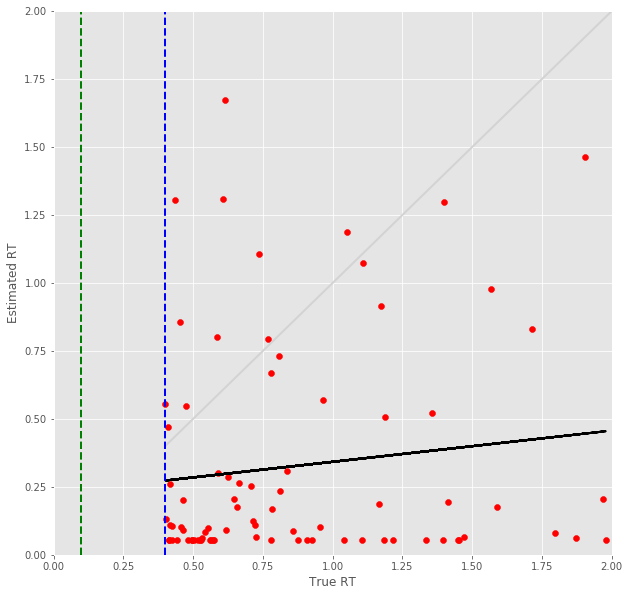

26 -step(s) forecast:
Test Score for 26 -steps forecast: 4.0107 RMSE
Predict Score for 26 -steps forecast: 4.3670 RMSE
Error Test Score for 26 -steps forecast: 0.7169 RMSE
RT Test Score for 26 -steps forecast: 0.7593 RMSE
Error Test Corr for 26 -steps forecast: 0.4736
RT Test Corr for 26 -steps forecast: 0.0780


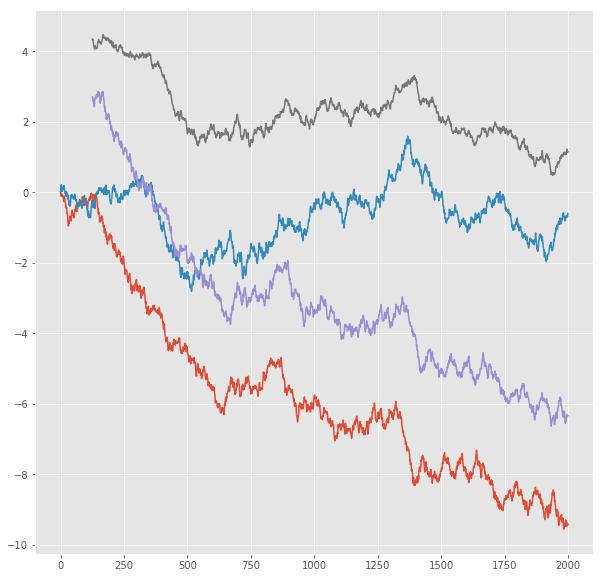

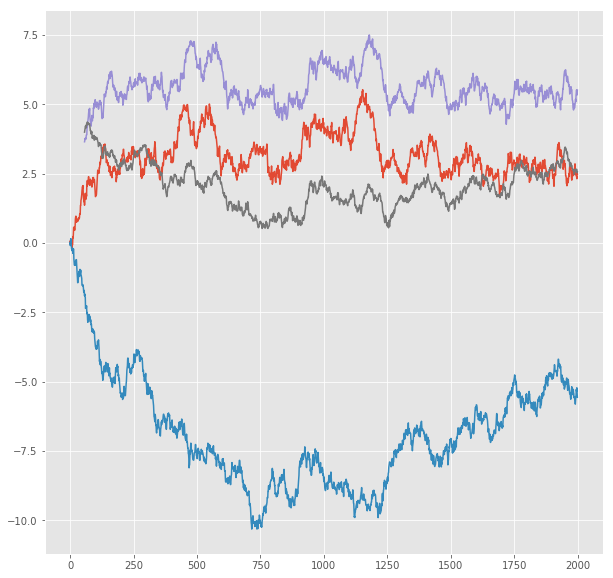

R^2 score for regression on Error: 0.2243
k = 0.8855


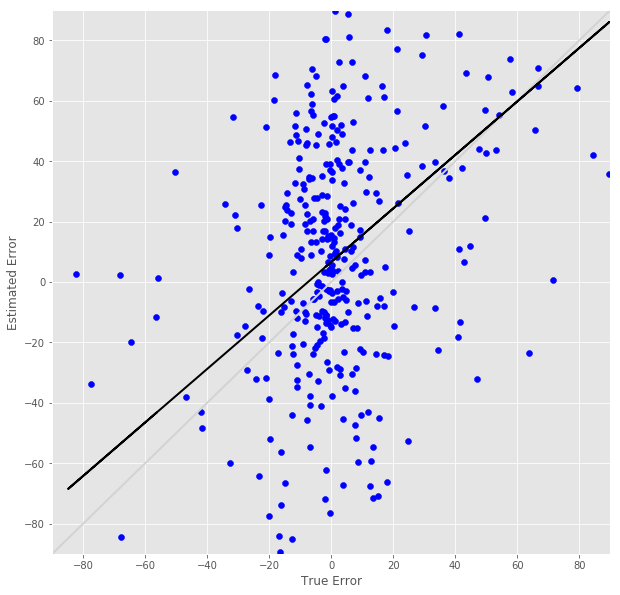

R^2 score for regression on RT: 0.0061
k = 0.0808


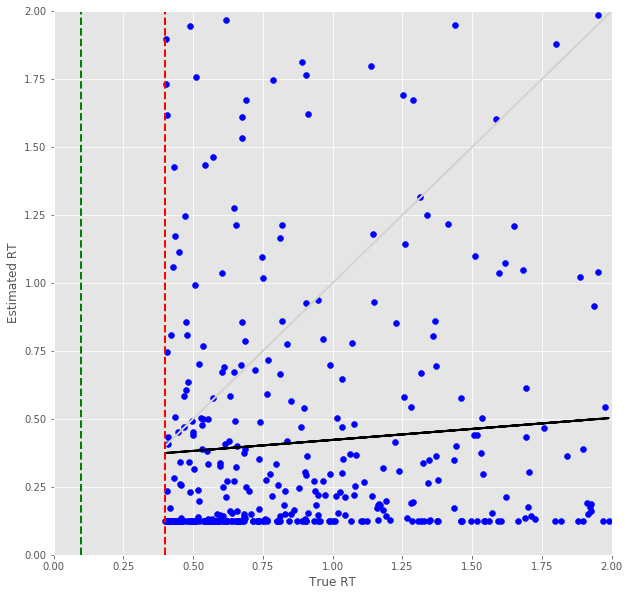

Error Prediction Score: 0.6432 RMSE
RT Prediction Score: 0.7880 RMSE
Error Prediction Corr: 0.4901
RT Prediction Corr: 0.1140
R^2 score for regression on Error: 0.2402
k = 0.8884


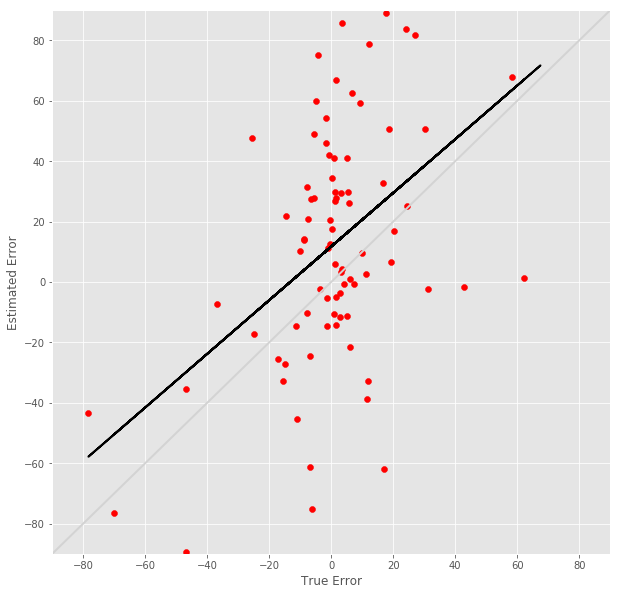

R^2 score for regression on RT: 0.0130
k = 0.0979


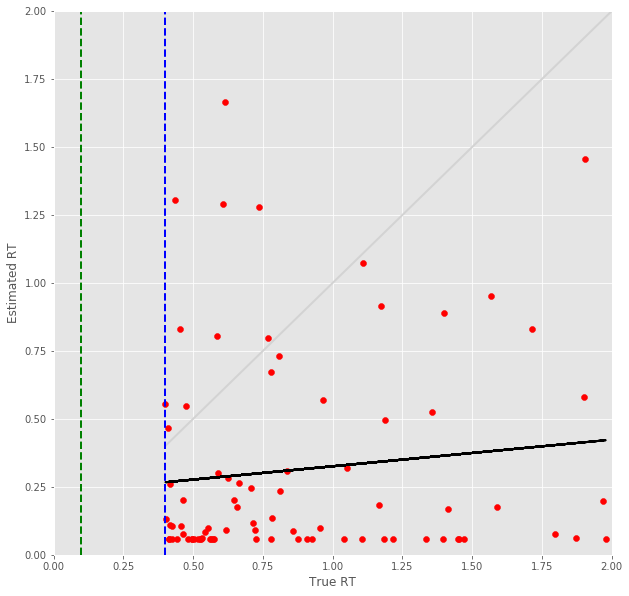

27 -step(s) forecast:
Test Score for 27 -steps forecast: 4.1239 RMSE
Predict Score for 27 -steps forecast: 4.4842 RMSE
Error Test Score for 27 -steps forecast: 0.7259 RMSE
RT Test Score for 27 -steps forecast: 0.7763 RMSE
Error Test Corr for 27 -steps forecast: 0.4665
RT Test Corr for 27 -steps forecast: 0.0370


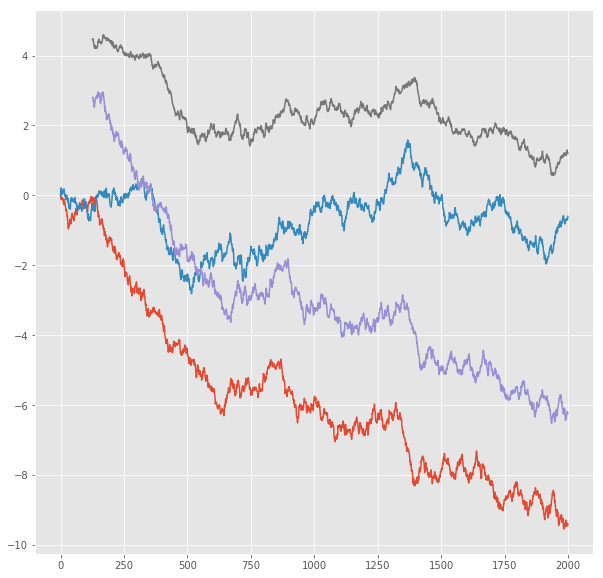

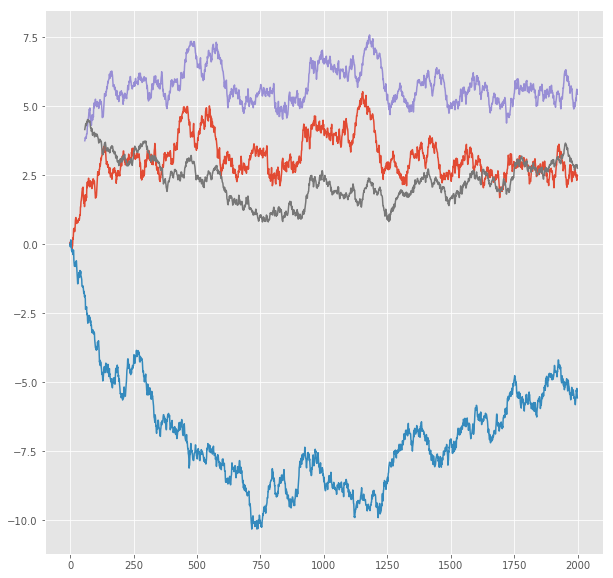

R^2 score for regression on Error: 0.2176
k = 0.8803


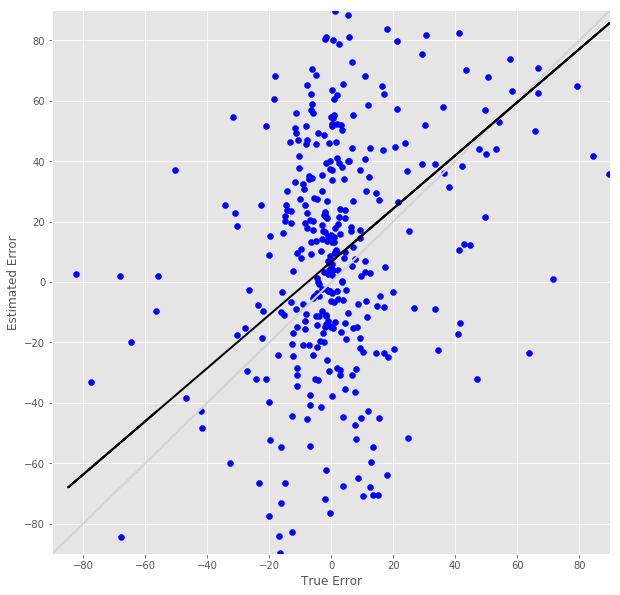

R^2 score for regression on RT: 0.0014
k = 0.0371


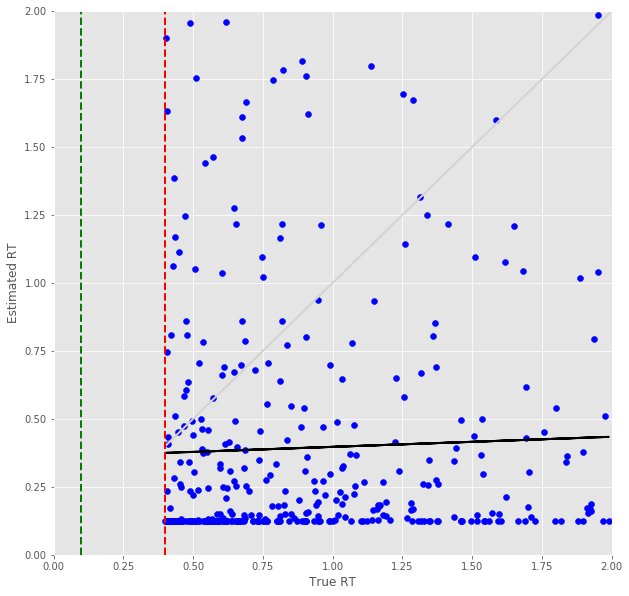

Error Prediction Score: 0.6538 RMSE
RT Prediction Score: 0.8074 RMSE
Error Prediction Corr: 0.4743
RT Prediction Corr: 0.0274
R^2 score for regression on Error: 0.2249
k = 0.8637


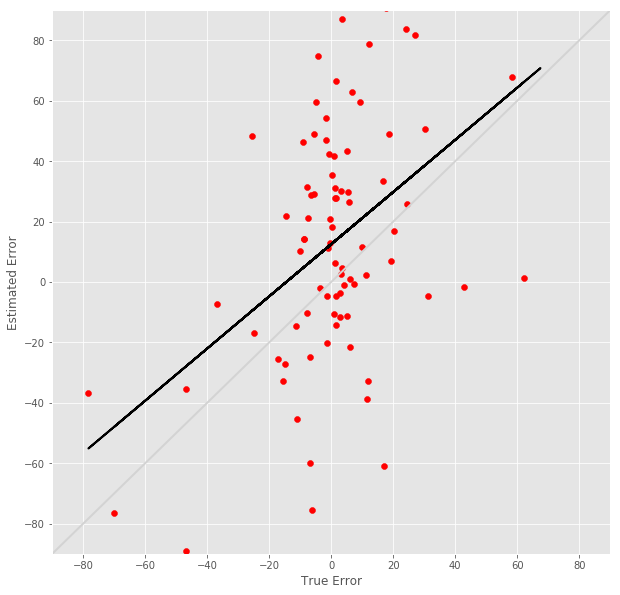

R^2 score for regression on RT: 0.0008
k = 0.0240


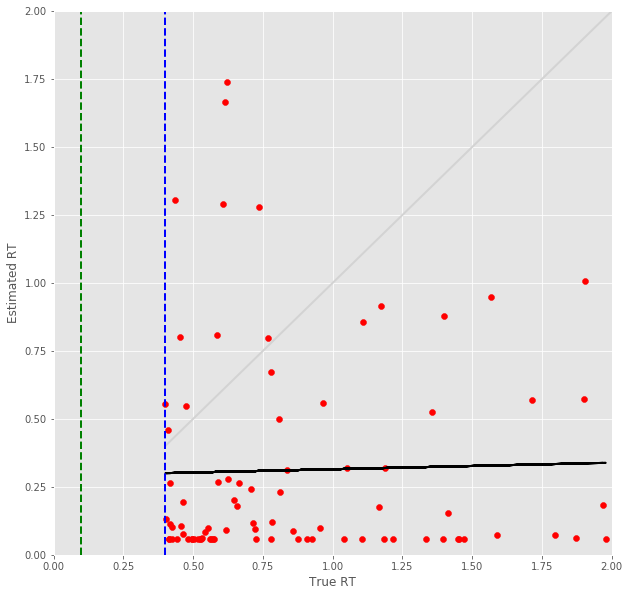

28 -step(s) forecast:
Test Score for 28 -steps forecast: 4.2347 RMSE
Predict Score for 28 -steps forecast: 4.5984 RMSE
Error Test Score for 28 -steps forecast: 0.7357 RMSE
RT Test Score for 28 -steps forecast: 0.7821 RMSE
Error Test Corr for 28 -steps forecast: 0.4124
RT Test Corr for 28 -steps forecast: 0.0275


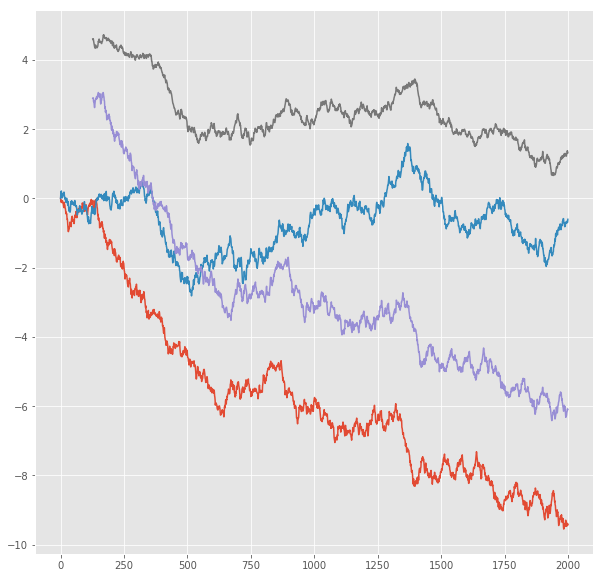

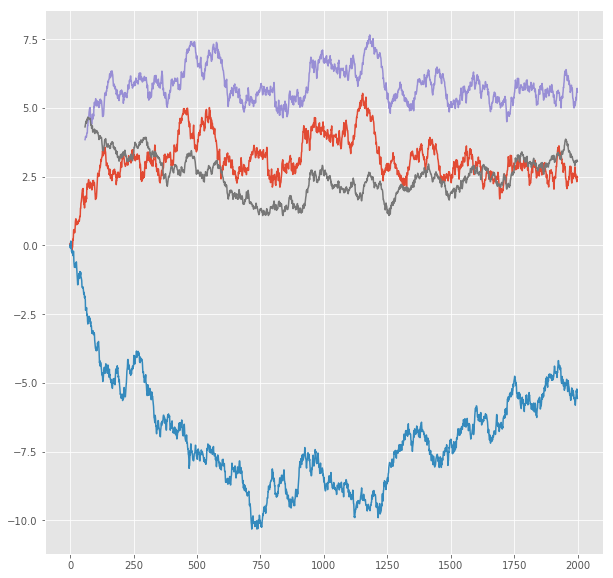

R^2 score for regression on Error: 0.1701
k = 0.7555


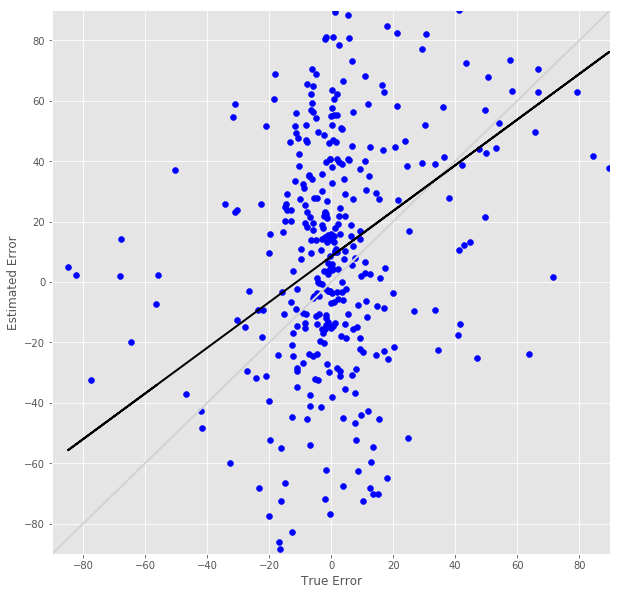

R^2 score for regression on RT: 0.0008
k = 0.0261


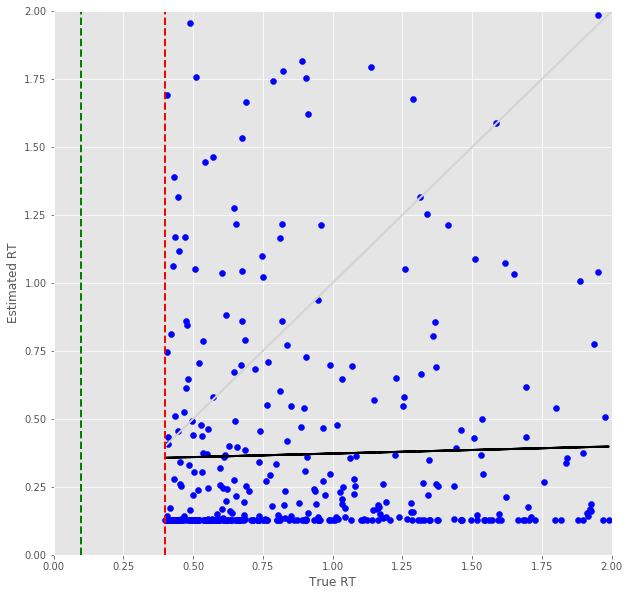

Error Prediction Score: 0.6719 RMSE
RT Prediction Score: 0.8173 RMSE
Error Prediction Corr: 0.4718
RT Prediction Corr: 0.0513
R^2 score for regression on Error: 0.2226
k = 0.8746


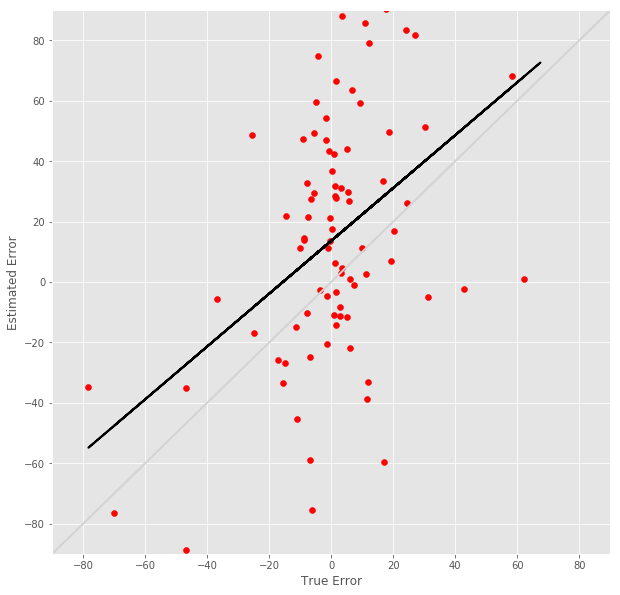

R^2 score for regression on RT: 0.0026
k = 0.0440


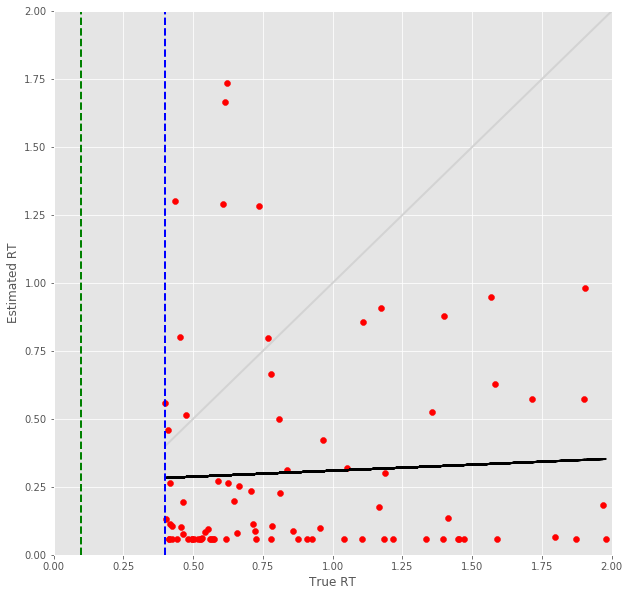

29 -step(s) forecast:
Test Score for 29 -steps forecast: 4.3432 RMSE
Predict Score for 29 -steps forecast: 4.7098 RMSE
Error Test Score for 29 -steps forecast: 0.7525 RMSE
RT Test Score for 29 -steps forecast: 0.7916 RMSE
Error Test Corr for 29 -steps forecast: 0.4311
RT Test Corr for 29 -steps forecast: 0.0195


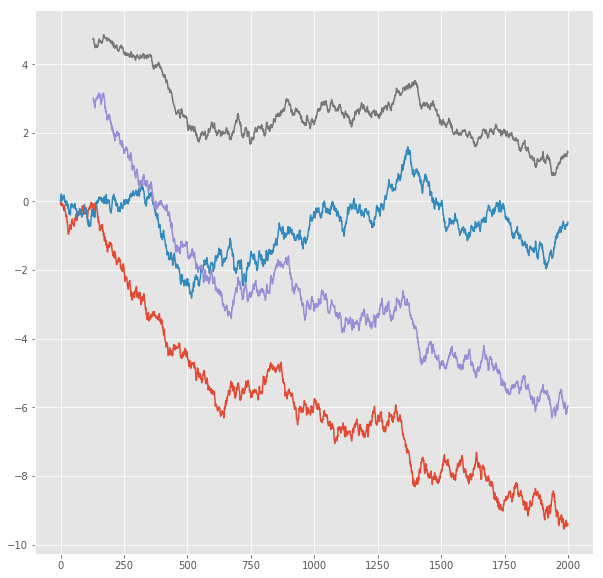

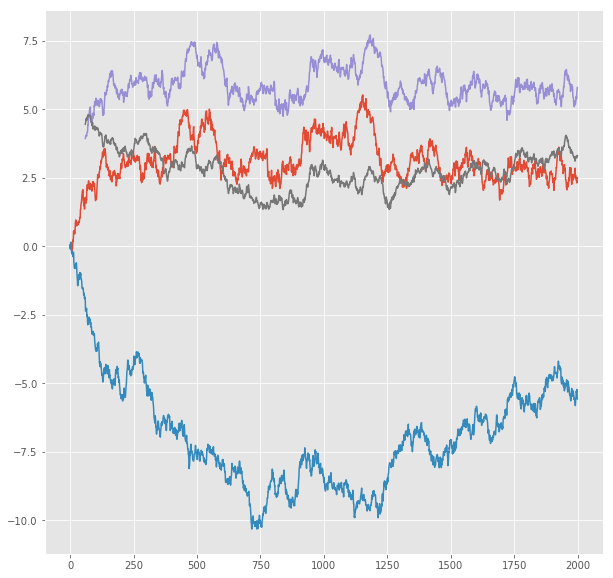

R^2 score for regression on Error: 0.1859
k = 0.8245


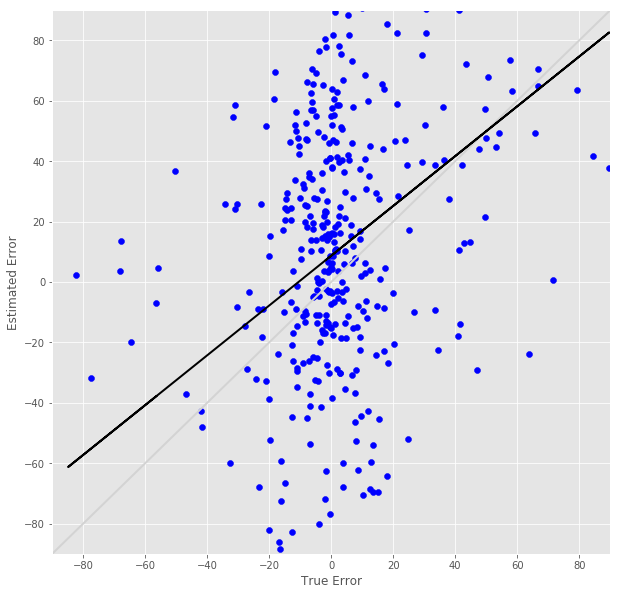

R^2 score for regression on RT: 0.0004
k = 0.0186


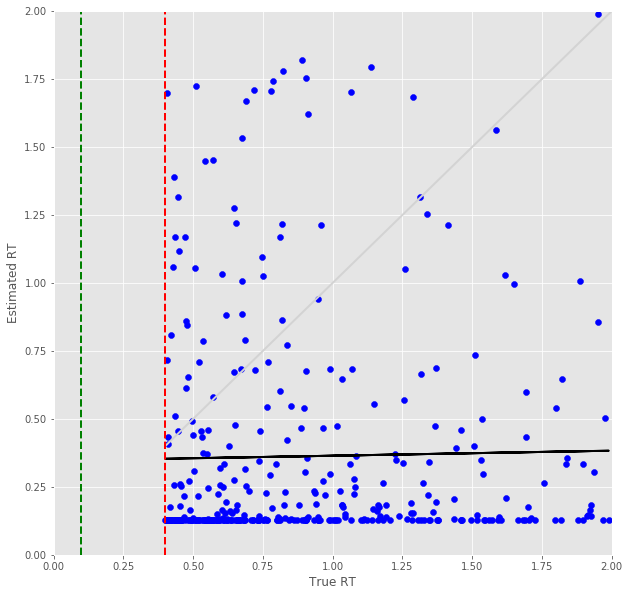

Error Prediction Score: 0.6876 RMSE
RT Prediction Score: 0.8122 RMSE
Error Prediction Corr: 0.4683
RT Prediction Corr: 0.0550
R^2 score for regression on Error: 0.2193
k = 0.8854


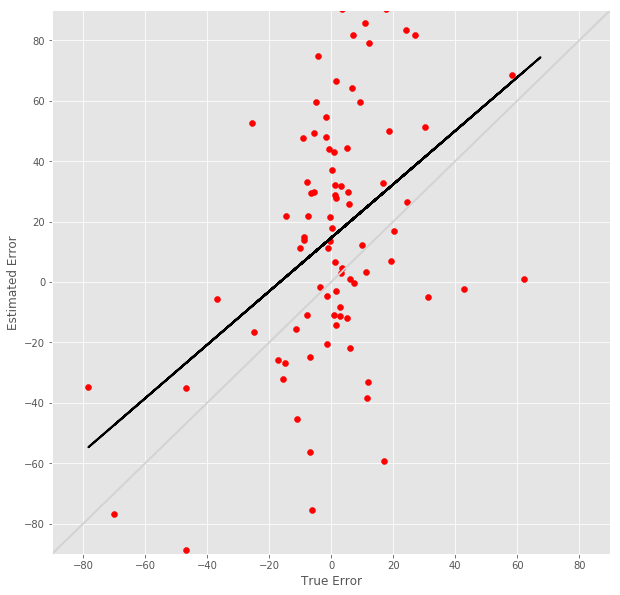

R^2 score for regression on RT: 0.0030
k = 0.0463


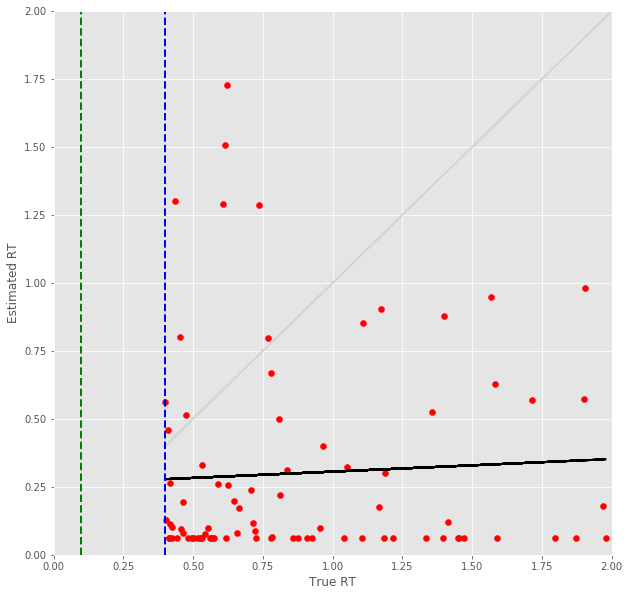

30 -step(s) forecast:
Test Score for 30 -steps forecast: 4.4493 RMSE
Predict Score for 30 -steps forecast: 4.8183 RMSE
Error Test Score for 30 -steps forecast: 0.7653 RMSE
RT Test Score for 30 -steps forecast: 0.7980 RMSE
Error Test Corr for 30 -steps forecast: 0.4340
RT Test Corr for 30 -steps forecast: 0.0326


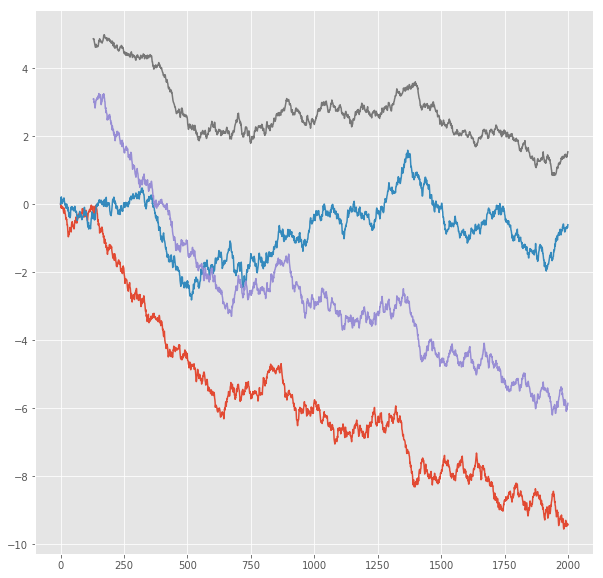

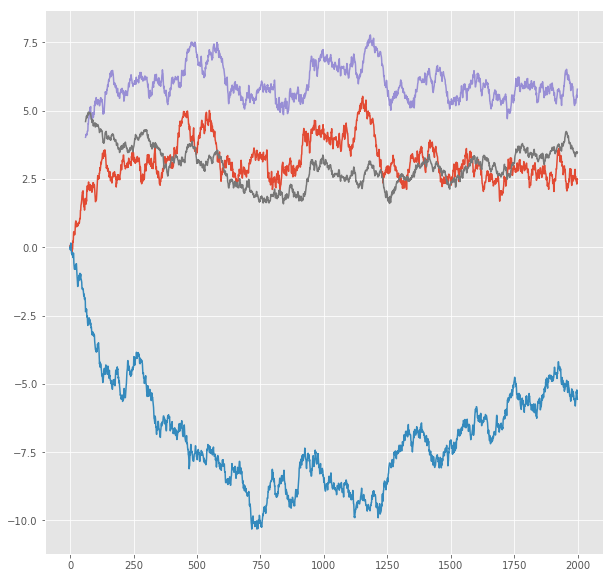

R^2 score for regression on Error: 0.1884
k = 0.8480


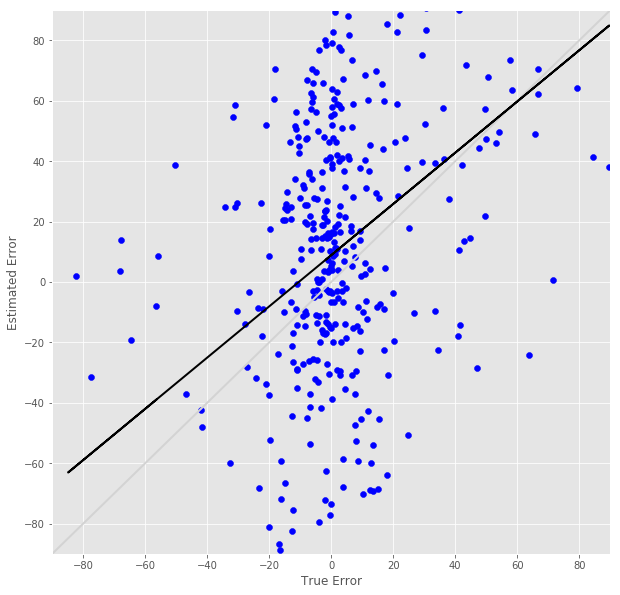

R^2 score for regression on RT: 0.0011
k = 0.0297


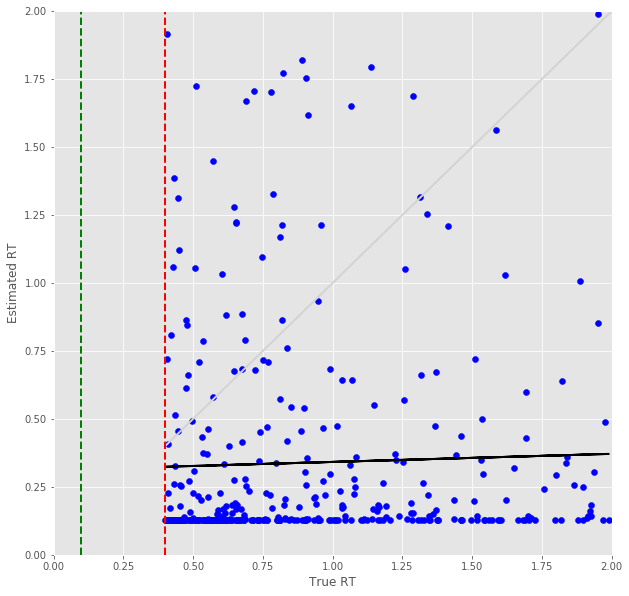

Error Prediction Score: 0.6877 RMSE
RT Prediction Score: 0.8251 RMSE
Error Prediction Corr: 0.4693
RT Prediction Corr: 0.0460
R^2 score for regression on Error: 0.2202
k = 0.8888


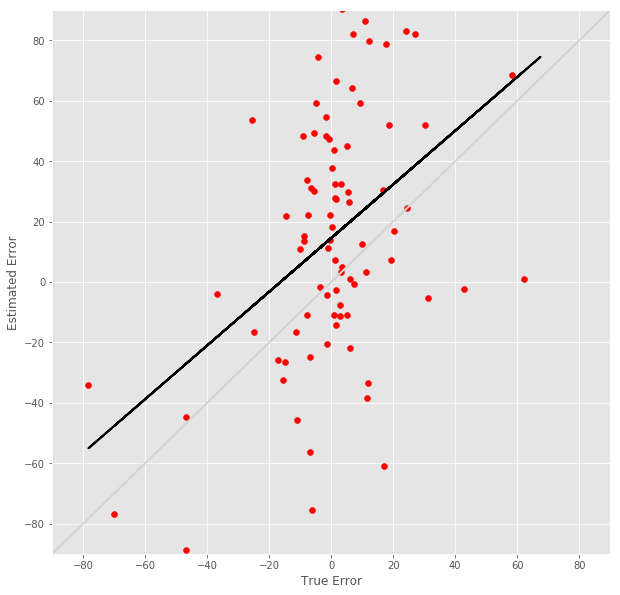

R^2 score for regression on RT: 0.0021
k = 0.0383


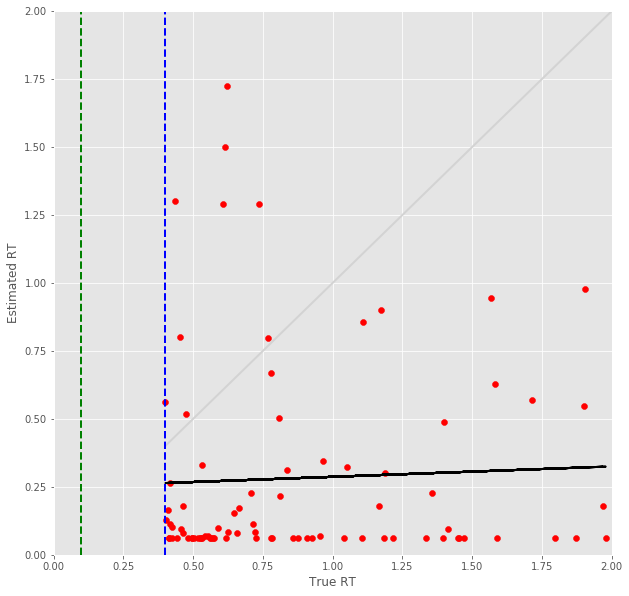

31 -step(s) forecast:
Test Score for 31 -steps forecast: 4.5532 RMSE
Predict Score for 31 -steps forecast: 4.9239 RMSE
Error Test Score for 31 -steps forecast: 0.7720 RMSE
RT Test Score for 31 -steps forecast: 0.7998 RMSE
Error Test Corr for 31 -steps forecast: 0.4271
RT Test Corr for 31 -steps forecast: 0.0409


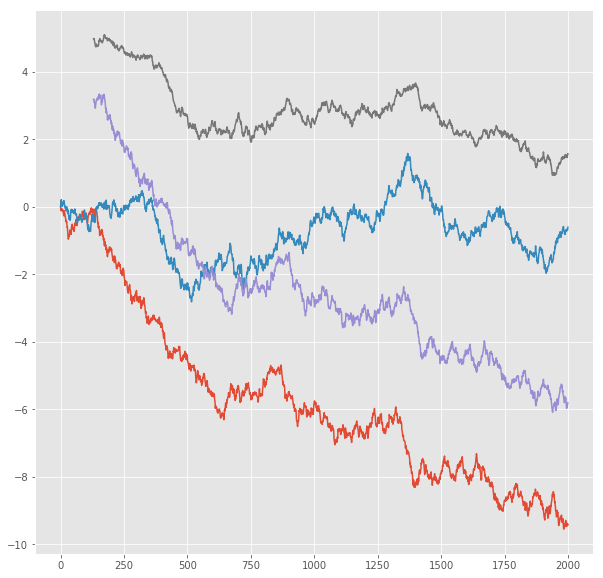

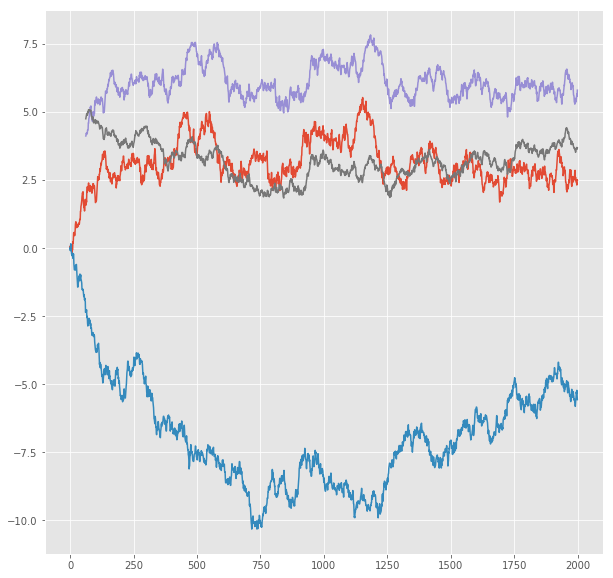

R^2 score for regression on Error: 0.1824
k = 0.8409


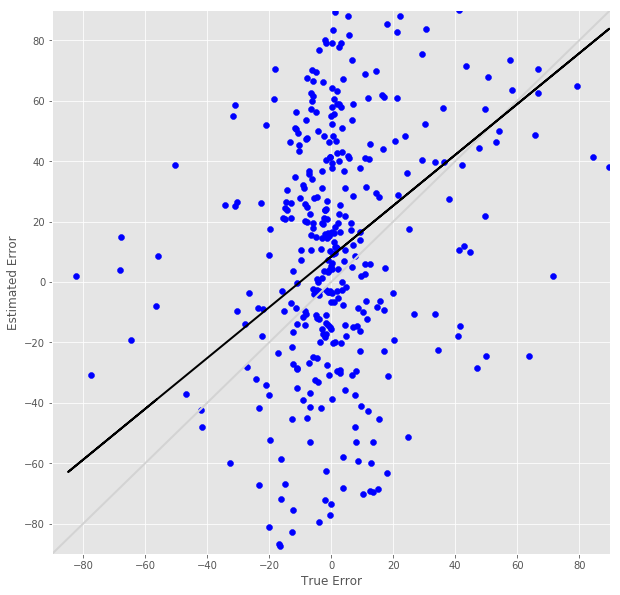

R^2 score for regression on RT: 0.0017
k = 0.0358


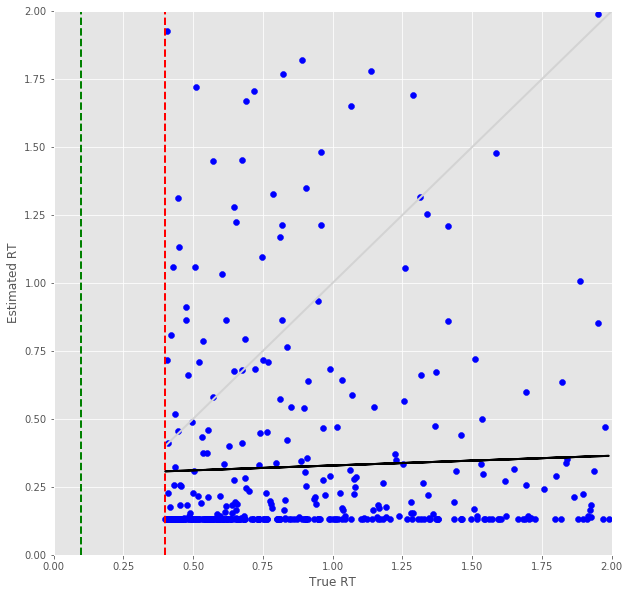

Error Prediction Score: 0.6912 RMSE
RT Prediction Score: 0.8276 RMSE
Error Prediction Corr: 0.4705
RT Prediction Corr: 0.0519
R^2 score for regression on Error: 0.2213
k = 0.8945


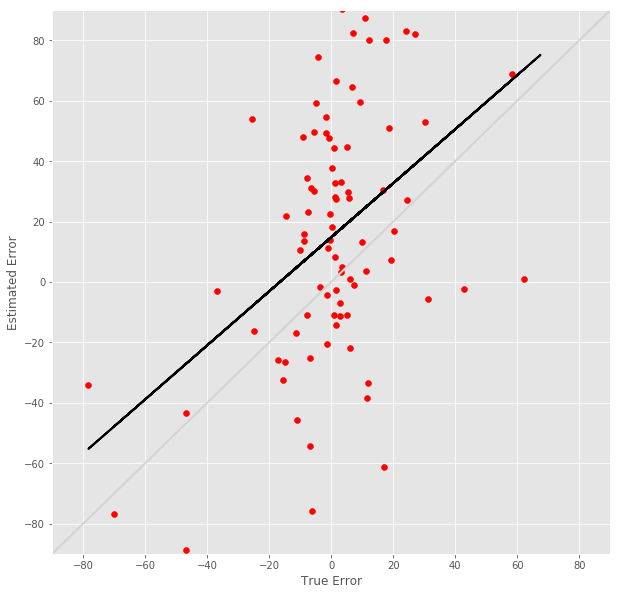

R^2 score for regression on RT: 0.0027
k = 0.0432


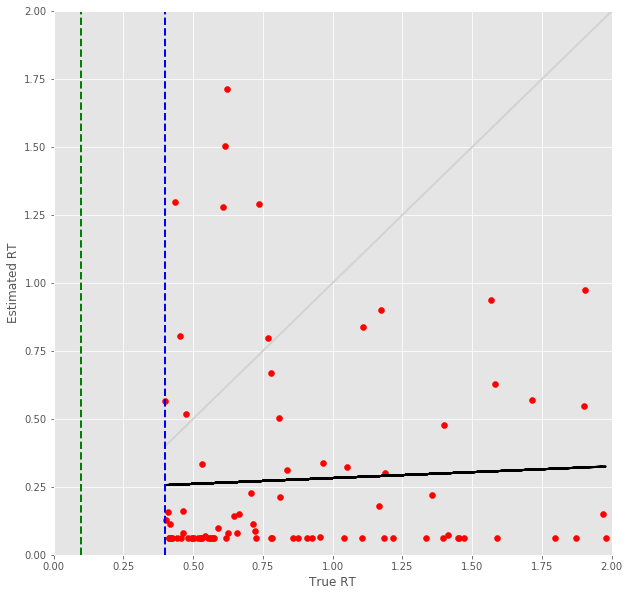

32 -step(s) forecast:
Test Score for 32 -steps forecast: 4.6547 RMSE
Predict Score for 32 -steps forecast: 5.0267 RMSE
Error Test Score for 32 -steps forecast: 0.7801 RMSE
RT Test Score for 32 -steps forecast: 0.8089 RMSE
Error Test Corr for 32 -steps forecast: 0.4210
RT Test Corr for 32 -steps forecast: 0.0595


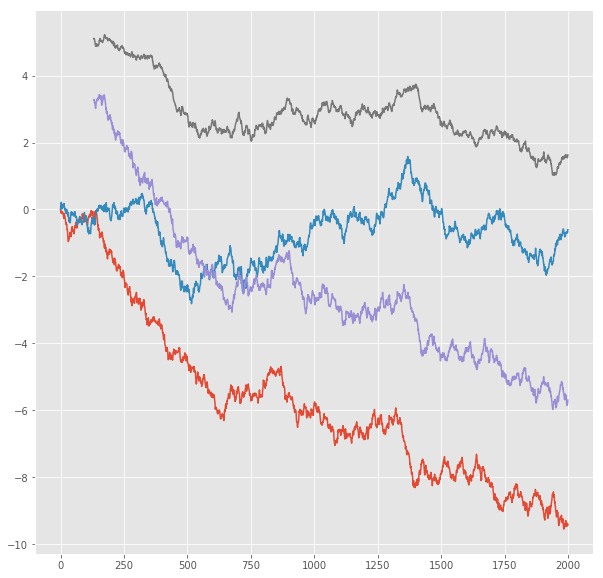

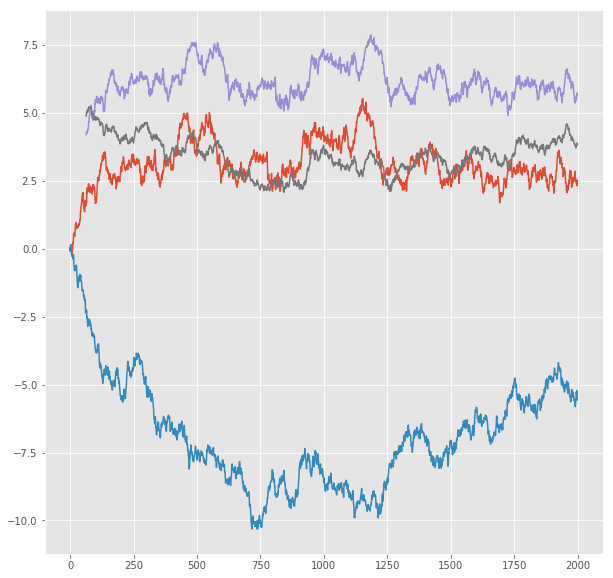

R^2 score for regression on Error: 0.1773
k = 0.8342


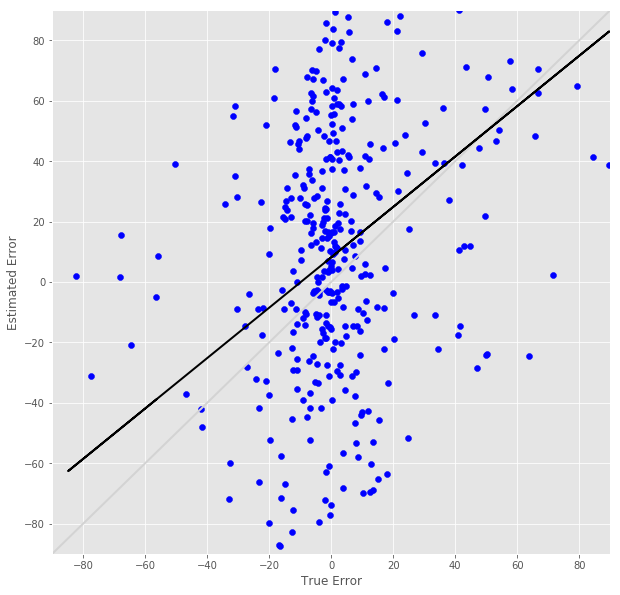

R^2 score for regression on RT: 0.0035
k = 0.0498


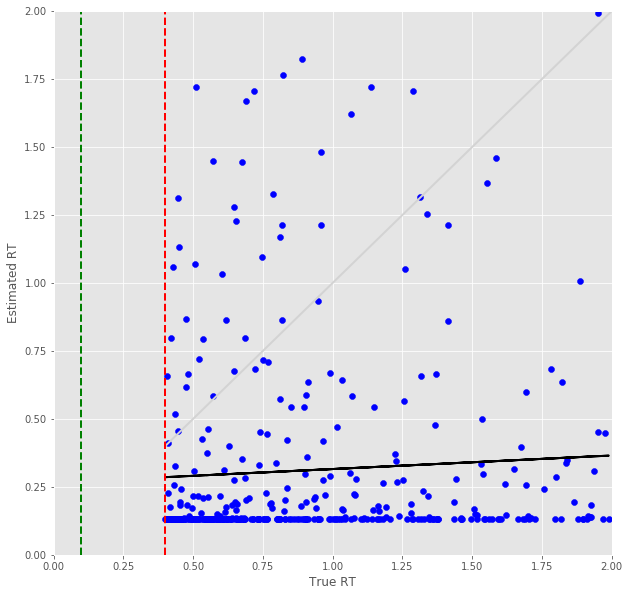

Error Prediction Score: 0.6916 RMSE
RT Prediction Score: 0.8538 RMSE
Error Prediction Corr: 0.4656
RT Prediction Corr: -0.0294
R^2 score for regression on Error: 0.2167
k = 0.8826


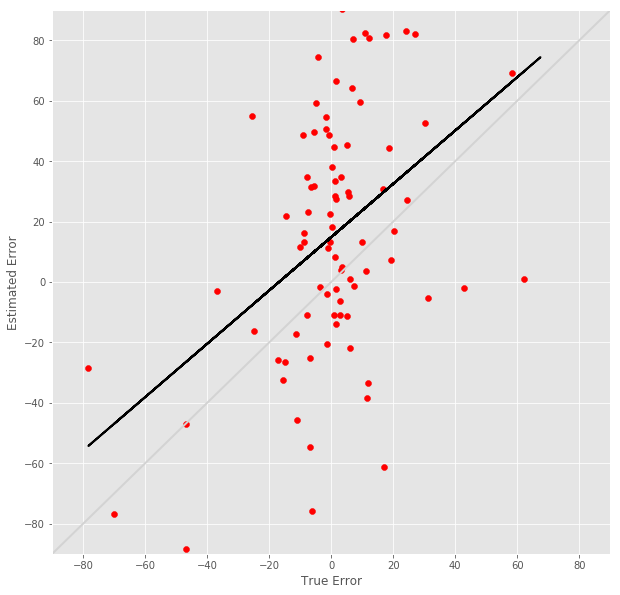

R^2 score for regression on RT: 0.0009
k = -0.0232


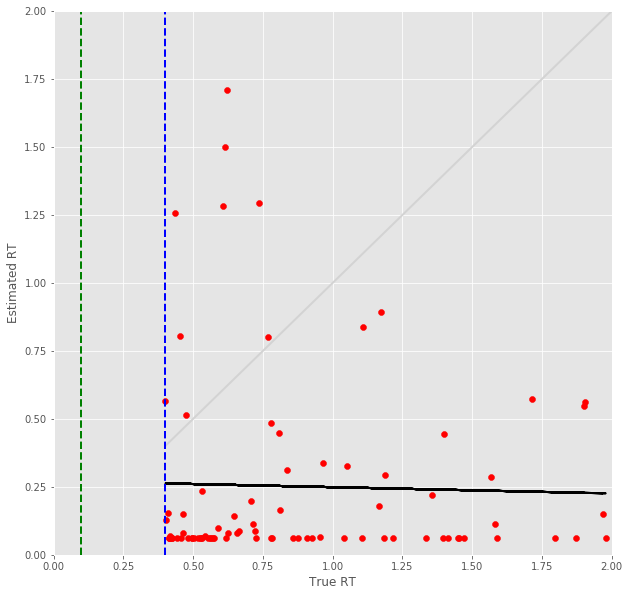

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

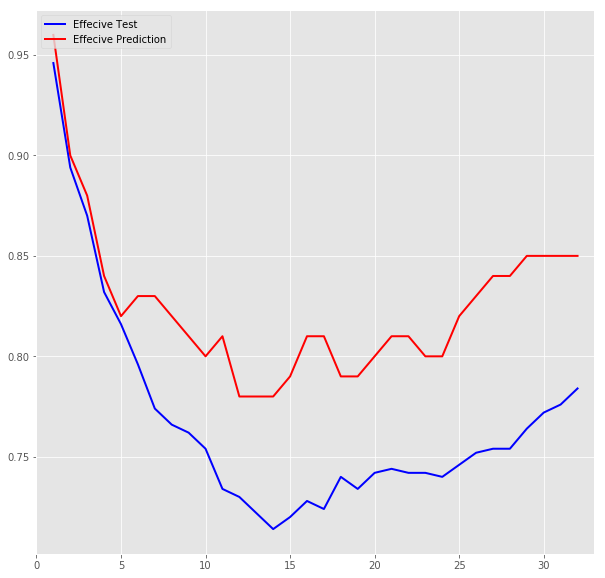

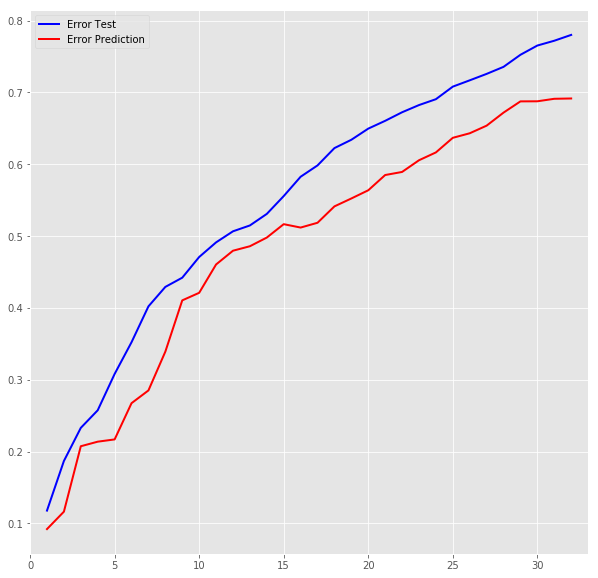

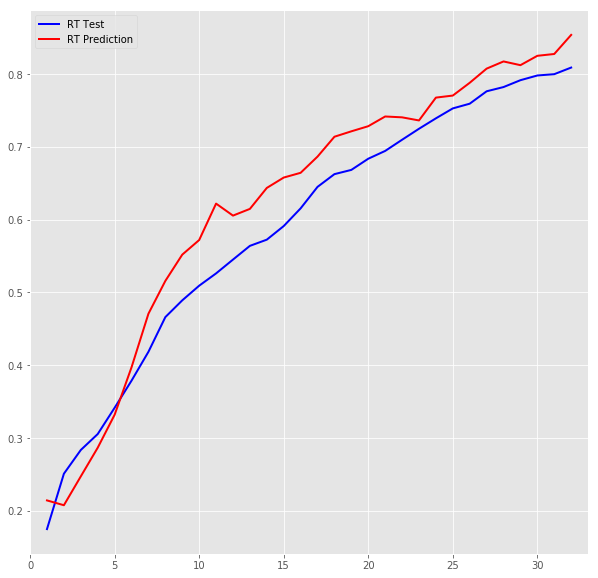

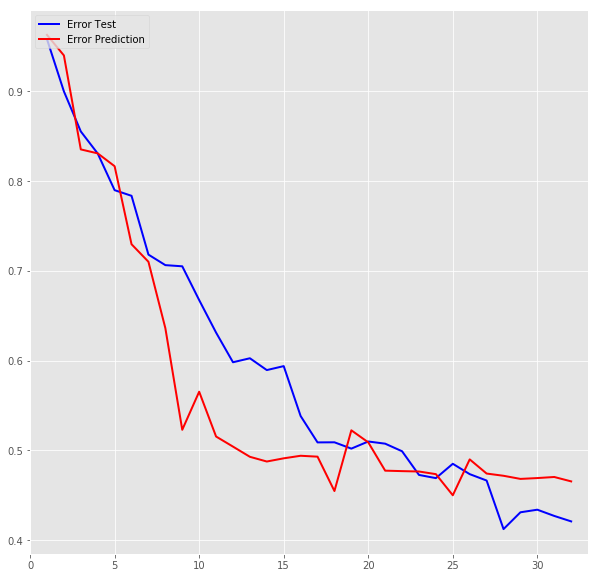

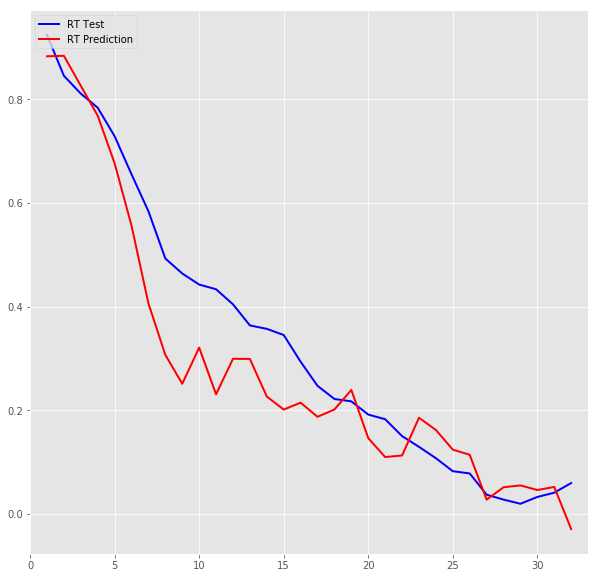

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
